**1-** Quais são os tipos de acomodações mais ofertadas e quais possuem maior faturamento?

**2-** Quais são os Top 10 acomodações mais caras e mais baratas? 

**3-** Quais bairros apresentam a maior quantidade de acomodações e quais possuem maior faturação total?

**4-** Qual a faixa de preço mais popular e qual a que possui a maior receita?

**5-** Superhosts, Hosts verificados e Hosts com maior quantidade de anúncios possuem maior valor total faturado?

**6-** Qual o comportamento do preço pela quantidade de banheiros, quartos, camas e por tipos diferentes de quartos e camas?

**7-** Acomodações que apresentam maior quantidade de avaliações, capacidade de hóspedes e convidados inclusos possuem vantagens na receita total? 

**8-** Acomodações com reserva instantânea apresentam maior ganho? Qual o número de pernoites mais ofertado?

**9-** Qual a proporção de acomodações que oferecem o serviço de hóspedes extras? E qual o preço médio?

**10-** Quais fatores mais influenciam no preço?

# Importação das bibliotecas e do dataset

In [1]:
# Configurações de visualização
%matplotlib inline
%config inlineBackend.figure_formats = ['svg']
# Importação das Bibliotecas
import pandas as pd
import numpy as np
import seaborn as sns
import statistics as sts
import matplotlib.pyplot as plt
from matplotlib import cm
import folium
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
# Configurações de visualização do dataset
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 90)

In [2]:
# Carregamento dos dados em arquivo csv
df_l = pd.read_csv('listings.csv', sep=',', engine='python')

## Exploração dos Dados

In [3]:
# Primeiras linhas do Dataset
df_l.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,17878,https://www.airbnb.com/rooms/17878,20191122092441,2019-11-22,Very Nice 2Br - Copacabana - WiFi,Pls note that special rates apply for Carnival. Pls contact me to discuss. - Beautifu...,- large balcony which looks out on pedestrian street - no traffic - priceless in Rio (...,Pls note that special rates apply for Carnival. Pls contact me to discuss. - Beautifu...,none,This is the best spot in Rio. Everything happens here. All big events are just 1 min. ...,NaN,Excellent location. Close to all major public transportation.,"The entire apartment is yours. It's like your ""home away from home"", everything you ne...",I will be available throughout your stay should you need me.,Please leave the apartment in a clean fashion (just like you found it). No loud noise...,NaN,NaN,https://a0.muscache.com/im/pictures/65320518/30698f38_original.jpg?aki_policy=large,NaN,68997,https://www.airbnb.com/users/show/68997,Matthias,2010-01-08,"Rio de Janeiro, State of Rio de Janeiro, Brazil","I am a journalist/writer. Lived for 15 years in NYC. I am now based in Rio, writin...",within an hour,100%,NaN,t,https://a0.muscache.com/im/pictures/user/67b13cea-8c11-49c0-a08d-7f42c330676e.jpg?aki_...,https://a0.muscache.com/im/pictures/user/67b13cea-8c11-49c0-a08d-7f42c330676e.jpg?aki_...,Copacabana,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'selfie', 'government_...",t,t,"Rio de Janeiro, Rio de Janeiro, Brazil",Copacabana,Copacabana,NaN,Rio de Janeiro,Rio de Janeiro,22020-050,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning"",Kitchen,""Paid parking off premises"",""S...",NaN,$332.00,NaN,NaN,$0.00,$378.00,2,$63.00,4,30,4,4,30,30,4.0,30.0,a week ago,t,23,31,35,303,2019-11-22,243,27,2010-07-15,2019-11-11,93.0,9.0,10.0,10.0,10.0,10.0,9.0,f,NaN,NaN,t,f,strict_14_with_grace_period,f,f,1,1,0,0,2.13
1,25026,https://www.airbnb.com/rooms/25026,20191122092441,2019-11-22,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves staying there! Best location, 2 blocks t...",This newly renovated studio (last renovations Oct 2014) is in the best location of C...,"Our apartment is a l

In [4]:
# Quantidade de linhas e colunas do Dataset
df_l.shape

(33715, 106)

In [5]:
# Colunas do Dataframe
df_l.columns.values

array(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name',
       'summary', 'space', 'description', 'experiences_offered',
       'neighborhood_overview', 'notes', 'transit', 'access',
       'interaction', 'house_rules', 'thumbnail_url', 'medium_url',
       'picture_url', 'xl_picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode',
       'market', 'smart_location', 'country_code', 'country', 'latitude',
       'longitude', 'is_location_exact', 'property_type', 'room_type',
       'accommodates', 'bath

In [6]:
# Tipos de dados do Dataset
df_l.dtypes

id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
name                                             object
summary                                          object
space                                            object
description                                      object
experiences_offered                              object
neighborhood_overview                            object
notes                                            object
transit                                          object
access                                           object
interaction                                      object
house_rules                                      object
thumbnail_url                                   float64
medium_url                                      float64
picture_url                                     

In [7]:
# Frequência dos tipos de dados
df_l.dtypes.value_counts()

object     61
float64    24
int64      21
dtype: int64

In [8]:
# Valores únicos em cada coluna
df_l.nunique()

id                                              33715
listing_url                                     33715
scrape_id                                           1
last_scraped                                        2
name                                            32590
summary                                         30486
space                                           19815
description                                     32052
experiences_offered                                 1
neighborhood_overview                           17225
notes                                           10045
transit                                         17167
access                                          14177
interaction                                     14777
house_rules                                     15597
thumbnail_url                                       0
medium_url                                          0
picture_url                                     33257
xl_picture_url              

In [9]:
# Campos duplicados
df_l.duplicated().sum()

0

In [10]:
# Descrição estatística de todo o Dataset incluindo colunas categóricas
df_l.describe(include=['O']).T

,count,unique,top,freq
listing_url,33715,33715,https://www.airbnb.com/rooms/2596840,1
last_scraped,33715,2,2019-11-22,32920
name,33654,32590,Apartamento em Copacabana,45
summary,31661,30486,.,82
space,20756,19815,"The apartment is amazing, spacious, quiet and comfortable. Our wifi network covers th...",50
description,32785,32052,.,24
experiences_offered,33715,1,none,33715
neighborhood_overview,18838,17225,"Copacabana, a name synonym of paradise. The wave designs near of the sea and the “calç...",27
notes,11247,10045,Intern Settlement : 1. The maximum number of tenants is the number indicated when you ...,170
transit,18739,17167,The location is very convenient to visit the neighbourhood or other parts of the city....,50


In [11]:
# Descrição estatística somente das colunas númericas do Dataset
df_l.describe()

,id,scrape_id,thumbnail_url,medium_url,xl_picture_url,host_id,host_acceptance_rate,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,square_feet,guests_included,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,jurisdiction_names,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,3.371500e+04,3.371500e+04,0.0,0.0,0.0,3.371500e+04,0.0,33695.000000,33695.000000,0.0,33715.000000,33715.000000,33715.000000,33661.000000,33673.000000,33667.000000,495.000000,33715.000000,33715.000000,3.371500e+04,33715.000000,33715.000000,3.371500e+04,3.371500e+04,33715.000000,3.371500e+04,33715.000000,33715.000000,33715.000000,33715.000000,33715.000000,33715.000000,18293.000000,18275.00000,18280.000000,18274.000000,18280.000000,18277.000000,18278.000000,0.0,33715.000000,33715.000000,33715.000000,33715.000000,19149.000000
mean,1.837737e+07,2.019112e+13,NaN,NaN,NaN,7.333110e+07,NaN,7.347559,7.347559,NaN,-22.965208,-43.254228,4.199941,1.694765,1.646126,2.574242,498.751515,1.718434,4.789826,9.571741e+02,4.677325,5.279164,9.536130e+02,9.565083e+02,4.814341,9.557378e+02,15.476553,30.368234,47.661516,177.956251,9.374344,3.524396,94.777565,9.65658,9.431565,9.802561,9.775656,9.748044,9.332093,NaN,5.996292,5.112383,0.702862,0.079638,0.707232
std,1.182836e+07,0.000000e+00,NaN,NaN,NaN,7.577773e+07,NaN,32.194777,32.194777,NaN,0.035244,0.097488,2.625252,1.508228,1.075649,2.121490,931.444840,1.585645,22.640328,5.473614e+04,21.651351,22.298511,5.473616e+04,5.473614e+04,21.762781,5.473614e+04,13.024685,24.678858,37.328647,149.766863,24.815311,8.185492,9.141386,0.88463,1.079031,0.713238,0.744620,0.734016,1.016906,NaN,20.303420,19.782263,1.475525,0.618935,0.927453
min,1.787800e+04,2.019112e+13,NaN,NaN,NaN,1.173900e+04,NaN,0.000000,0.000000,NaN,-23.073400,-43.737090,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.00000,2.000000,2.000000,2.000000,2.000000,2.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.026686e+07,2.019112e+13,NaN,NaN,NaN,1.431560e+07,NaN,1.000000,1.000000,NaN,-22.984710,-43.323360,2.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,3.000000e+01,1.000000,2.000000,3.000000e+01,3.000000e+01,1.100000,3.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,93.000000,10.00000,9.000000,10.000000,10.000000,10.000000,9.000000,NaN,1.000000,1.000000,0.000000,0.000000,0.110000
50%,1.425308e+07,2.019112e+13,NaN,NaN,NaN,5.277714e+07,NaN,1.000000,1.000000,NaN,-22.970850,-43.200220,4.000000,1.000000,1.000000,2.000000,161.000000,1.000000,2.000000,1.125000e+03,2.000000,3.000000,1.125000e+03,1.125000e+03,2.300000,1.125000e+03,19.000000,34.000000,56.000000,165.000000,1.000000,0.000000,98.000000,10.00000,10.000000,10.000000,10.000000,10.000000,10.000000,NaN,1.000000,1.000000,0.000000,0.000000,0.340000
75%,2.991364e+07,2.019112e+13,NaN,NaN,NaN,9.143910e+07,NaN,3.000000,3.000000,NaN,-22.946725,-43.187085,6.000000,2.000000,2.000000,3.000000,700.000000,2.000000,4.000000,1.125000e+03,4.000000,5.000000,1.125000e+03,1.125000e+03,4.000000,1.125000e+03,29.000000,57.000000,87.000000,350.000000,6.000000,3.000000,100.000000,10.00000,10.000000,10.000000,10.000000,10.000000,10.000000,NaN,3.000000,2.000000,1.000000,0.000000,0.980000
max,4.029091e+07,2.019112e+13,NaN,NaN,NaN,3.111796e+08,NaN,1259.000000,

In [12]:
# Valores nulos no Dataset
df_l.isnull().sum().sort_values(ascending=False)

medium_url                                      33715
host_acceptance_rate                            33715
jurisdiction_names                              33715
xl_picture_url                                  33715
thumbnail_url                                   33715
neighbourhood_group_cleansed                    33715
license                                         33713
square_feet                                     33220
weekly_price                                    31169
monthly_price                                   30890
notes                                           22468
access                                          17683
host_about                                      17543
interaction                                     16913
house_rules                                     16291
review_scores_checkin                           15441
review_scores_accuracy                          15440
review_scores_location                          15438
review_scores_value         

In [13]:
# Valores nulos no Dataset em termos de porcentagem
df_l.isnull().sum()/df_l.shape[0] * 100

id                                                0.000000
listing_url                                       0.000000
scrape_id                                         0.000000
last_scraped                                      0.000000
name                                              0.180928
summary                                           6.092244
space                                            38.436898
description                                       2.758416
experiences_offered                               0.000000
neighborhood_overview                            44.125760
notes                                            66.640961
transit                                          44.419398
access                                           52.448465
interaction                                      50.164615
house_rules                                      48.319739
thumbnail_url                                   100.000000
medium_url                                      100.0000

# Limpeza dos Dados

## Valores nulos <h2>

In [14]:
# Colunas com menos de 10% de valores nulos
df_l.isnull().sum()/df_l.shape[0] * 100 < 10

id                                               True
listing_url                                      True
scrape_id                                        True
last_scraped                                     True
name                                             True
summary                                          True
space                                           False
description                                      True
experiences_offered                              True
neighborhood_overview                           False
notes                                           False
transit                                         False
access                                          False
interaction                                     False
house_rules                                     False
thumbnail_url                                   False
medium_url                                      False
picture_url                                      True
xl_picture_url              

**OBS:** Com isso, vamos excluir as colunas que contenham mais de 10% dos valores nulos: "space", "neighborhood_overview",
"notes", "transit", "access", "interaction", "house_rules", "thumbnail_url", "medium_url", "xl_picture_url", "host_about", "host_response_time", "host_response_rate", "host_acceptance_rate", "host_neighbourhood", 
"neighbourhood_group_cleansed", "square_feet", "weekly_price", "monthly_price", "security_deposit", "cleaning_fee"
"first_review", "last_review", "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness",
"review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value",
"license", "jurisdiction_names", "reviews_per_month".             

In [15]:
# Valor máximo de nulos admitidos
max_nulo = 33715 * 10 / 100 # 33715 é o número de linhas do dataset
max_nulo

3371.5

In [16]:
# Remover todas as colunas que tenham mais de 10% de valores nulos
max_nulo = 3371.5
df_l = df_l.loc[:, (df_l.isnull().sum(axis=0) < max_nulo)]
df_l.head(2)

,id,listing_url,scrape_id,last_scraped,name,summary,description,experiences_offered,picture_url,host_id,host_url,host_name,host_since,host_location,host_is_superhost,host_thumbnail_url,host_picture_url,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,17878,https://www.airbnb.com/rooms/17878,20191122092441,2019-11-22,Very Nice 2Br - Copacabana - WiFi,Pls note that special rates apply for Carnival. Pls contact me to discuss. - Beautifu...,Pls note that special rates apply for Carnival. Pls contact me to discuss. - Beautifu...,none,https://a0.muscache.com/im/pictures/65320518/30698f38_original.jpg?aki_policy=large,68997,https://www.airbnb.com/users/show/68997,Matthias,2010-01-08,"Rio de Janeiro, State of Rio de Janeiro, Brazil",t,https://a0.muscache.com/im/pictures/user/67b13cea-8c11-49c0-a08d-7f42c330676e.jpg?aki_...,https://a0.muscache.com/im/pictures/user/67b13cea-8c11-49c0-a08d-7f42c330676e.jpg?aki_...,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'selfie', 'government_...",t,t,"Rio de Janeiro, Rio de Janeiro, Brazil",Copacabana,Copacabana,Rio de Janeiro,Rio de Janeiro,22020-050,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.96592,-43.17896,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning"",Kitchen,""Paid parking off premises"",""S...",$332.00,2,$63.00,4,30,4,4,30,30,4.0,30.0,a week ago,t,23,31,35,303,2019-11-22,243,27,f,t,f,strict_14_with_grace_period,f,f,1,1,0,0
1,25026,https://www.airbnb.com/rooms/25026,20191122092441,2019-11-22,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves staying there! Best location, 2 blocks t...","Our apartment is a little gem, everyone loves staying there! Best location, 2 blocks t...",none,https://a0.muscache.com/im/pictures/3003965/68ebb634_original.jpg?aki_policy=large,102840,https://www.airbnb.com/users/show/102840,Viviane,2010-04-03,"Rio de Janeiro, State of Rio de Janeiro, Brazil",f,https://a0.muscache.com/im/pictures/user/9e204f80-1667-448b-b5a3-4dec677060f4.jpg?aki_...,https://a0.muscache.com/im/pictures/user/9e204f80-1667-448b-b5a3-4dec677060f4.jpg?aki_...,3.0,3.0,"['email', 'phone', 'facebook', 'reviews', 'jumio', 'offline_government_id', 'governmen...",t,t,"Rio de Janeiro, Rio de Janeiro, Brazil",Copacabana,Copacabana,Rio de Janeiro,Rio de Janeiro,22060-020,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.97712,-43.19045,t,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning"",Kitchen,Doorman,Elevator,""Buzzer/wirel...",$160.00,2,$45.00,7,60,7,7,60,60,7.0,60.0,5 weeks ago,t,16,22,35,119,2019-11-22,235,17,f,f,f,strict_14_with_grace_period,t,t,3,3,0,0


In [17]:
# Tamanho do dataset após a exclusão das colunas
df_l.shape

(33715, 73)

In [18]:
# Colunas restantes
df_l.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'description', 'experiences_offered', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed', 'city', 'state',
       'zipcode', 'market', 'smart_location', 'country_code', 'country',
       'latitude', 'longitude', 'is_location_exact', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'amenities', 'price', 'guests_included', 'extra_people',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm

In [19]:
# Valores nulos colunas
df_l.isnull().sum().sort_values(ascending=False)

summary                                         2054
neighbourhood                                   1958
zipcode                                         1705
description                                      930
host_location                                    193
city                                              82
name                                              61
bathrooms                                         54
beds                                              48
state                                             47
market                                            45
bedrooms                                          42
host_picture_url                                  20
host_identity_verified                            20
host_has_profile_pic                              20
host_listings_count                               20
host_total_listings_count                         20
host_thumbnail_url                                20
host_is_superhost                             

## Seleção das colunas triviais para o negócio <h2>

Excluir todas as colunas que conjectura-se em um primeiro momento serem irrelevantes para a questão de negócio através da leitura do dicionário dos dados encontrado no site: http://insideairbnb.com/

In [20]:
# Excluir todas as colunas, exceto estas.
df_l = df_l.drop(df_l.columns.difference(['id', 'name', 'host_id',
                                          'host_is_superhost',
                                          'host_identity_verified',
                                          'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type',
                                          'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type',
                                          'price', 'guests_included', 'extra_people', 'minimum_nights', 
                                          'number_of_reviews', 'instant_bookable', 'calculated_host_listings_count'
                                         ]), 1)

In [21]:
# Verificar mudanças
df_l.head(5)

,id,name,host_id,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,guests_included,extra_people,minimum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count
0,17878,Very Nice 2Br - Copacabana - WiFi,68997,t,t,Copacabana,-22.96592,-43.17896,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,$332.00,2,$63.00,4,243,t,1
1,25026,Beautiful Modern Decorated Studio in Copa,102840,f,t,Copacabana,-22.97712,-43.19045,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,$160.00,2,$45.00,7,235,f,3
2,31560,NICE & COZY 1BDR - IPANEMA BEACH,135635,t,t,Ipanema,-22.98302,-43.21427,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,$273.00,2,$42.00,2,271,t,1
3,35636,Cosy flat close to Ipanema beach,153232,t,t,Ipanema,-22.98816,-43.19359,Apartment,Entire home/apt,3,1.5,1.0,2.0,Real Bed,$378.00,2,$63.00,2,169,f,1
4,35764,COPACABANA SEA BREEZE - RIO - 20 X Superhost,153691,t,t,Copacabana,-22.98127,-43.19046,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,$130.00,2,$80.00,3,316,f,1


In [22]:
# Tamanho do Dataset após as mudanças 
df_l.shape

(33715, 22)

In [23]:
# Valores nulos que sobraram
df_l.isnull().sum().sort_values(ascending=False)

name                              61
bathrooms                         54
beds                              48
bedrooms                          42
host_is_superhost                 20
host_identity_verified            20
calculated_host_listings_count     0
property_type                      0
host_id                            0
neighbourhood_cleansed             0
latitude                           0
longitude                          0
accommodates                       0
room_type                          0
instant_bookable                   0
bed_type                           0
price                              0
guests_included                    0
extra_people                       0
minimum_nights                     0
number_of_reviews                  0
id                                 0
dtype: int64

Substituir os valores nulos pela mediana nas variáveis numéricas e pela moda nas variáveis categóricas. **OBS:** escolhemos a mediana em detrimento da média a fim de evitar outliers.

In [24]:
# Listando colunas categóricas e numéricas:
v_c = list(df_l.select_dtypes(include=['object']).columns)
v_n = list(df_l.select_dtypes(include=['float64', 'int64']).columns)
print('Variáveis Categóricas:', v_c)
print('Variáveis Númericas:', v_n)

Variáveis Categóricas: ['name', 'host_is_superhost', 'host_identity_verified', 'neighbourhood_cleansed', 'property_type', 'room_type', 'bed_type', 'price', 'extra_people', 'instant_bookable']
Variáveis Númericas: ['id', 'host_id', 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'guests_included', 'minimum_nights', 'number_of_reviews', 'calculated_host_listings_count']


In [25]:
# Substituir valores nulos pela mediana na coluna 'bathrooms'
mediana_bathrooms = sts.median(df_l['bathrooms'])
mediana_bathrooms

df_l['bathrooms'].fillna(mediana_bathrooms, inplace=True)

In [26]:
# Verificar se ainda existem valores nulos na coluna

df_l['bathrooms'].isnull().sum()

0

In [27]:
# Substituir valores nulos pela mediana na coluna 'beds'
mediana_beds = sts.median(df_l['beds'])
mediana_beds

df_l['beds'].fillna(mediana_beds, inplace=True)

In [28]:
# Verifica se ainda existem valores nulos na coluna 'beds'
df_l['beds'].isnull().sum()

0

In [29]:
# Substituir valores nulos peda mediana na coluna 'bedrooms'
mediana_bedrooms = sts.median(df_l['bedrooms'])
mediana_bedrooms

df_l['bedrooms'].fillna(mediana_beds, inplace=True)

In [30]:
# Verifica se ainda existem valores nulos na coluna 'bedrooms'
df_l['bedrooms'].isnull().sum()

0

In [31]:
# Substituir valores nulos pela moda na coluna 'host_is_superhost'
moda_host_is_superhost = sts.mode(df_l['host_is_superhost'])
moda_host_is_superhost
df_l['host_is_superhost'].fillna(moda_host_is_superhost, inplace=True)

In [32]:
# Verifica se ainda existem valores nulos na coluna 'host_is_superhost'
df_l['host_is_superhost'].isnull().sum()

0

In [33]:
# Substituir valores nulos pela moda na coluna 'host_identity_verified '
moda_host_identity_verified  = sts.mode(df_l['host_identity_verified'])
moda_host_identity_verified 
df_l['host_identity_verified'].fillna(moda_host_identity_verified , inplace=True)

In [34]:
# Verifica se ainda existem valores nulos na coluna 'host_identity_verified'
df_l['host_identity_verified'].isnull().sum()

0

In [35]:
# Valores nulos que sobraram
df_l.isnull().sum().sort_values(ascending=False)

name                              61
calculated_host_listings_count     0
instant_bookable                   0
host_id                            0
host_is_superhost                  0
host_identity_verified             0
neighbourhood_cleansed             0
latitude                           0
longitude                          0
property_type                      0
room_type                          0
accommodates                       0
bathrooms                          0
bedrooms                           0
beds                               0
bed_type                           0
price                              0
guests_included                    0
extra_people                       0
minimum_nights                     0
number_of_reviews                  0
id                                 0
dtype: int64

Excluir todos os valores nulos restantes, pois são informações muito específicas e não é adequado substituí-las. 

In [36]:
# Excluir todas as linhas que contenham valores nulos
df_l = df_l.dropna()
df_l.head(6)

,id,name,host_id,host_is_superhost,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,guests_included,extra_people,minimum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count
0,17878,Very Nice 2Br - Copacabana - WiFi,68997,t,t,Copacabana,-22.96592,-43.17896,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,$332.00,2,$63.00,4,243,t,1
1,25026,Beautiful Modern Decorated Studio in Copa,102840,f,t,Copacabana,-22.97712,-43.19045,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,$160.00,2,$45.00,7,235,f,3
2,31560,NICE & COZY 1BDR - IPANEMA BEACH,135635,t,t,Ipanema,-22.98302,-43.21427,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,$273.00,2,$42.00,2,271,t,1
3,35636,Cosy flat close to Ipanema beach,153232,t,t,Ipanema,-22.98816,-43.19359,Apartment,Entire home/apt,3,1.5,1.0,2.0,Real Bed,$378.00,2,$63.00,2,169,f,1
4,35764,COPACABANA SEA BREEZE - RIO - 20 X Superhost,153691,t,t,Copacabana,-22.98127,-43.19046,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,$130.00,2,$80.00,3,316,f,1
5,35893,Copa Tabajaras,154043,f,t,Copacabana,-22.96681,-43.18657,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,$151.00,1,$150.00,2,1,f,1


In [37]:
# Verificar se ainda existem valores nulos
df_l.isnull().sum().sort_values(ascending=False)

calculated_host_listings_count    0
instant_bookable                  0
name                              0
host_id                           0
host_is_superhost                 0
host_identity_verified            0
neighbourhood_cleansed            0
latitude                          0
longitude                         0
property_type                     0
room_type                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
bed_type                          0
price                             0
guests_included                   0
extra_people                      0
minimum_nights                    0
number_of_reviews                 0
id                                0
dtype: int64

In [38]:
# Quantidade de linhas e colunas do Dataset após as mudanças
df_l.shape

(33654, 22)

In [39]:
# Colunas restantes
df_l.columns

Index(['id', 'name', 'host_id', 'host_is_superhost', 'host_identity_verified',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'price', 'guests_included', 'extra_people',
       'minimum_nights', 'number_of_reviews', 'instant_bookable',
       'calculated_host_listings_count'],
      dtype='object')

In [40]:
# Renomeação das colunas 
df_l.columns = ["id","nome","host_id", "superhost", "host_verificado", 
                "bairro_ajustado", "latitude", "longitude",
                "acomodacao", "tipo_quarto", "capacidade_hospedes", "banheiros", "quartos",
                "camas", "tipo_cama", "preco", "convidados_inclusos", "preco_hospedes_extras",
                "minimo_pernoite",
                "avaliacoes", "reserva_instantanea", "host_anuncios"]

In [41]:
# Mudança na ordem das colunas
df_l = df_l[["id","nome","host_id", "superhost", "host_verificado", "host_anuncios",
             "avaliacoes", "reserva_instantanea", "bairro_ajustado",
             "latitude", "longitude", "acomodacao", "tipo_quarto",
             "capacidade_hospedes", "banheiros", "quartos", "camas", "tipo_cama",
             "minimo_pernoite",
             "convidados_inclusos", "preco_hospedes_extras","preco",]]
df_l.head(6)

,id,nome,host_id,superhost,host_verificado,host_anuncios,avaliacoes,reserva_instantanea,bairro_ajustado,latitude,longitude,acomodacao,tipo_quarto,capacidade_hospedes,banheiros,quartos,camas,tipo_cama,minimo_pernoite,convidados_inclusos,preco_hospedes_extras,preco
0,17878,Very Nice 2Br - Copacabana - WiFi,68997,t,t,1,243,t,Copacabana,-22.96592,-43.17896,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,4,2,$63.00,$332.00
1,25026,Beautiful Modern Decorated Studio in Copa,102840,f,t,3,235,f,Copacabana,-22.97712,-43.19045,Apartment,Entire home/apt,2,1.0,1.0,2.0,Real Bed,7,2,$45.00,$160.00
2,31560,NICE & COZY 1BDR - IPANEMA BEACH,135635,t,t,1,271,t,Ipanema,-22.98302,-43.21427,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,2,2,$42.00,$273.00
3,35636,Cosy flat close to Ipanema beach,153232,t,t,1,169,f,Ipanema,-22.98816,-43.19359,Apartment,Entire home/apt,3,1.5,1.0,2.0,Real Bed,2,2,$63.00,$378.00
4,35764,COPACABANA SEA BREEZE - RIO - 20 X Superhost,153691,t,t,1,316,f,Copacabana,-22.98127,-43.19046,Loft,Entire home/apt,2,1.0,1.0,1.0,Real Bed,3,2,$80.00,$130.00
5,35893,Copa Tabajaras,154043,f,t,1,1,f,Copacabana,-22.96681,-43.18657,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,2,1,$150.00,$151.00


## Outliers <h2>

In [42]:
# Breve descrição estatística dos dados quantitativos
df_l.describe().T

,count,mean,std,min,25%,50%,75%,max
id,33654.0,1.839677e+07,1.182868e+07,17878.00000,1.029940e+07,1.426122e+07,2.992481e+07,4.029091e+07
host_id,33654.0,7.339950e+07,7.582164e+07,11739.00000,1.431560e+07,5.281980e+07,9.165402e+07,3.111796e+08
host_anuncios,33654.0,6.005141e+00,2.032074e+01,1.00000,1.000000e+00,1.000000e+00,3.000000e+00,2.050000e+02
avaliacoes,33654.0,9.391276e+00,2.483460e+01,0.00000,0.000000e+00,1.000000e+00,6.000000e+00,3.720000e+02
latitude,33654.0,-2.296523e+01,3.523697e-02,-23.07340,-2.298471e+01,-2.297086e+01,-2.294686e+01,-2.275038e+01
longitude,33654.0,-4.325423e+01,9.749893e-02,-43.73709,-4.332340e+01,-4.320020e+01,-4.318707e+01,-4.310406e+01
capacidade_hospedes,33654.0,4.199560e+00,2.625812e+00,1.00000,2.000000e+00,4.000000e+00,5.000000e+00,1.600000e+02
banheiros,33654.0,1.693291e+00,1.507449e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+02
quartos,33654.0,1.647352e+00,1.075974e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+01
camas,33654.0,2.574345e+00,2.120473e+00,0.00000,1.000000e+00,2.000000e+00,3.000000e+00,6.900000e+01


In [43]:
# Informações gerais sobre as colunas
df_l.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33654 entries, 0 to 33714
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     33654 non-null  int64  
 1   nome                   33654 non-null  object 
 2   host_id                33654 non-null  int64  
 3   superhost              33654 non-null  object 
 4   host_verificado        33654 non-null  object 
 5   host_anuncios          33654 non-null  int64  
 6   avaliacoes             33654 non-null  int64  
 7   reserva_instantanea    33654 non-null  object 
 8   bairro_ajustado        33654 non-null  object 
 9   latitude               33654 non-null  float64
 10  longitude              33654 non-null  float64
 11  acomodacao             33654 non-null  object 
 12  tipo_quarto            33654 non-null  object 
 13  capacidade_hospedes    33654 non-null  int64  
 14  banheiros              33654 non-null  float64
 15  qu

As colunas númericas "preco" e "preco_hospedes_extra" não aparecem pois estão no formato object. Vamos transformá-las para o tipo float.

In [44]:
# Retirar o símbolo $ da coluna 'preco_hospedes_extras' e transformar em float
df_l['preco'] = df_l['preco'].astype(str).str.replace("$", "").str.replace(',', '', regex = 'true').astype(float)

In [45]:
# Retirar o símbolo $ da coluna 'preco_hospedes_extras' e transformar em float
df_l['preco_hospedes_extras'] = df_l['preco_hospedes_extras'].astype(str).str.replace("$", "").str.replace(',', '', regex = 'true').astype(float)

**OBS:** Transformar as colunas "quartos" e "camas" em inteiro

In [46]:
# Conversão para inteiro na coluna "quartos"
df_l['quartos'] = df_l['quartos'].astype(int)

In [47]:
# Conversão para inteiro na coluna "camas"
df_l['camas'] = df_l['camas'].astype(int)

In [48]:
# Verificar as mudanças aplicadas nas colunas
df_l.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33654 entries, 0 to 33714
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     33654 non-null  int64  
 1   nome                   33654 non-null  object 
 2   host_id                33654 non-null  int64  
 3   superhost              33654 non-null  object 
 4   host_verificado        33654 non-null  object 
 5   host_anuncios          33654 non-null  int64  
 6   avaliacoes             33654 non-null  int64  
 7   reserva_instantanea    33654 non-null  object 
 8   bairro_ajustado        33654 non-null  object 
 9   latitude               33654 non-null  float64
 10  longitude              33654 non-null  float64
 11  acomodacao             33654 non-null  object 
 12  tipo_quarto            33654 non-null  object 
 13  capacidade_hospedes    33654 non-null  int64  
 14  banheiros              33654 non-null  float64
 15  qu

In [49]:
# Breve descrição estatística das colunas númericas
df_l.describe().T

,count,mean,std,min,25%,50%,75%,max
id,33654.0,1.839677e+07,1.182868e+07,17878.00000,1.029940e+07,1.426122e+07,2.992481e+07,4.029091e+07
host_id,33654.0,7.339950e+07,7.582164e+07,11739.00000,1.431560e+07,5.281980e+07,9.165402e+07,3.111796e+08
host_anuncios,33654.0,6.005141e+00,2.032074e+01,1.00000,1.000000e+00,1.000000e+00,3.000000e+00,2.050000e+02
avaliacoes,33654.0,9.391276e+00,2.483460e+01,0.00000,0.000000e+00,1.000000e+00,6.000000e+00,3.720000e+02
latitude,33654.0,-2.296523e+01,3.523697e-02,-23.07340,-2.298471e+01,-2.297086e+01,-2.294686e+01,-2.275038e+01
longitude,33654.0,-4.325423e+01,9.749893e-02,-43.73709,-4.332340e+01,-4.320020e+01,-4.318707e+01,-4.310406e+01
capacidade_hospedes,33654.0,4.199560e+00,2.625812e+00,1.00000,2.000000e+00,4.000000e+00,5.000000e+00,1.600000e+02
banheiros,33654.0,1.693291e+00,1.507449e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+02
quartos,33654.0,1.647352e+00,1.075974e+00,0.00000,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+01
camas,33654.0,2.574345e+00,2.120473e+00,0.00000,1.000000e+00,2.000000e+00,3.000000e+00,6.900000e+01


<Figure size 1152x1296 with 0 Axes>

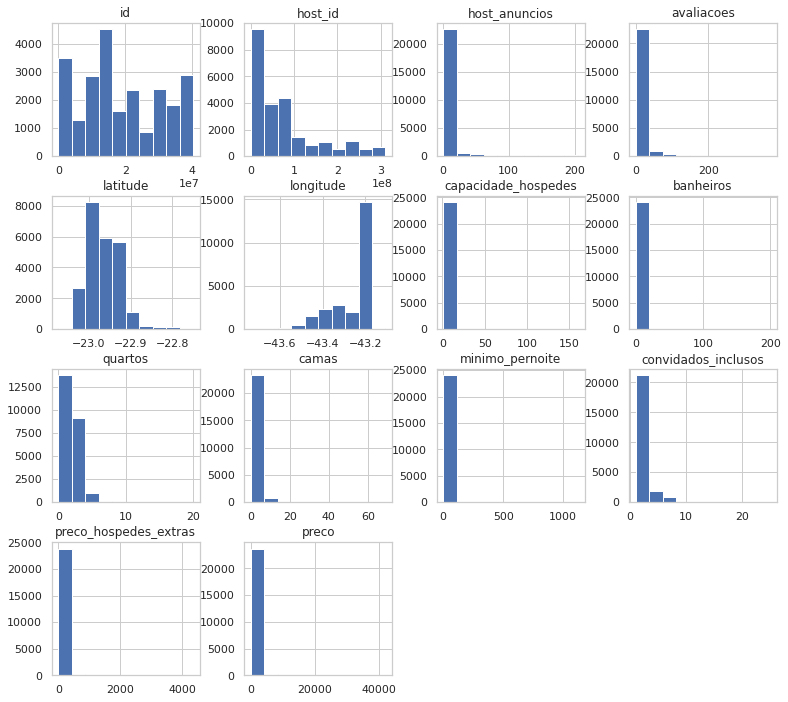

In [345]:
# Histograma de todas as colunas númericas
sns.set(style="whitegrid")
plt.figure(figsize = (16,18))
df_l.hist()
plt.show();

# Data visualization

## Devido a sua trivial relevância para a questão de negócio vamos começar analisando a coluna do Preço <h2>

Coluna "preco"

In [51]:
# Acomodações com os preços mais altos
df_l.sort_values('preco', ascending=False).head(100)

,id,nome,host_id,superhost,host_verificado,host_anuncios,avaliacoes,reserva_instantanea,bairro_ajustado,latitude,longitude,acomodacao,tipo_quarto,capacidade_hospedes,banheiros,quartos,camas,tipo_cama,minimo_pernoite,convidados_inclusos,preco_hospedes_extras,preco
20450,20381435,lar,116264656,f,f,2,0,t,Barra da Tijuca,-23.00330,-43.32386,Condominium,Private room,1,1.0,1,1,Real Bed,3,1,0.0,41982.0
16111,14106421,"Viva com luxo, conforto e segurança nas Olimpíadas",84942794,f,f,1,0,f,Itanhangá,-22.98806,-43.30390,House,Entire home/apt,14,8.0,6,12,Real Bed,7,1,0.0,41982.0
11902,12871727,Temporada Olimpíadas 2016 RJ,70395802,f,f,1,0,f,Bangu,-22.86994,-43.45056,House,Entire home/apt,8,3.0,3,4,Real Bed,15,1,0.0,41982.0
10617,11909226,2 vagas e varandão vista para mata,63368759,f,f,1,0,f,Copacabana,-22.96740,-43.19354,Apartment,Entire home/apt,4,3.0,2,4,Real Bed,1,1,0.0,41982.0
6231,6571778,Cobertura para Jogos Olímpicos 2016,13372759,f,f,2,0,f,Laranjeiras,-22.93635,-43.18820,Apartment,Entire home/apt,7,3.5,3,5,Real Bed,30,1,0.0,41982.0
11325,12425613,The Mansion,67210175,f,f,1,0,f,Santa Teresa,-22.93559,-43.19804,House,Entire home/apt,16,4.0,4,0,Real Bed,1,1,0.0,41982.0
12807,13278620,CASA OLÍMPIADAS ATÉ 25 PESSOAS SEGURANÇA LOCALIZAÇ,74838468,f,f,1,0,t,Barra da Tijuca,-23.00442,-43.39638,Apartment,Entire home/apt,16,7.0,8,14,Real Bed,16,1,0.0,41982.0
6718,7944205,MY RIOSTAR 120',32429803,f,f,5,0,f,Barra da Tijuca,-23.00137,-43.32211,Boat,Entire home/apt,14,8.0,6,7,Real Bed,1,1,0.0,40001.0
11098,12260482,House for Rio 2016 Olympic Games,64762661,f,t,1,0,f,Barra da Tijuca,-23.00062,-43.37529,House,Entire home/apt,16,8.0,5,16,Real Bed,1,1,0.0,39883.0
10120,11494778,RESORT FRONTAL A PRAIA DA BARRA,60515269,f,f,1,0,f,Barra da Tijuca,-23.01028,-43.34515,Apartment,Entire home/apt,10,4.0,3,3,Real Bed,1,1,0.0,39480.0


**OBS:** Foi possível observar que eventos esportivos aparecem com certa frequência nas acomodações com os preços mais altos. Por serem fatos atípicos, e que ocorreram no passado em que os dados foram coletados, não representam a realidade dos preços. Diante disto, é plausível excluir do Dataset todas as linhas que estejam relacionadas a estes eventos.

In [52]:
# Filtrar todas as linhas que façam referência a eventos esportivos como as Olimpiadas 2016 e a Copa do Mundo de 2014

termos = ['Olimpiadas', 'olimpiadas', 'Olimpiada', 'olimpiada', 'OLÍMPIADAS', 'OLIMPÍADAS', 'OLIMPIADAS', 
          'Olimpíadas', 'olimpíadas', 'Olímpiadas', 'Olympics','olympics', 'Olimpics', 'OLYMPICS',
          'olímpidas', 'Olímpico', 'Oímpico', 'olímpico', 'olimpico', 'Olimpico', 'Olympic', 'olympic', 'OLYMPIC',
          'Olimpic', 'Olímpica', 'Rio 2016', 'RIO 2016', 'rio 2016', 'OLYMPICSRIO2016','COPA 2014', 'World Cup',
          'Copa', 'COPA', 'COPA DO MUNDO', 'Paralimpíadas'
         ]
df_l = df_l[~df_l['nome'].str.contains('|'.join(termos))]
df_l.shape

(24067, 22)

In [53]:
# Acomodações com os preços mais altos após a remoção linhas que tinham referência a eventos esportivos
df_l.sort_values('preco', ascending=False).head(100)

,id,nome,host_id,superhost,host_verificado,host_anuncios,avaliacoes,reserva_instantanea,bairro_ajustado,latitude,longitude,acomodacao,tipo_quarto,capacidade_hospedes,banheiros,quartos,camas,tipo_cama,minimo_pernoite,convidados_inclusos,preco_hospedes_extras,preco
11325,12425613,The Mansion,67210175,f,f,1,0,f,Santa Teresa,-22.93559,-43.19804,House,Entire home/apt,16,4.0,4,0,Real Bed,1,1,0.0,41982.0
20450,20381435,lar,116264656,f,f,2,0,t,Barra da Tijuca,-23.00330,-43.32386,Condominium,Private room,1,1.0,1,1,Real Bed,3,1,0.0,41982.0
10617,11909226,2 vagas e varandão vista para mata,63368759,f,f,1,0,f,Copacabana,-22.96740,-43.19354,Apartment,Entire home/apt,4,3.0,2,4,Real Bed,1,1,0.0,41982.0
6718,7944205,MY RIOSTAR 120',32429803,f,f,5,0,f,Barra da Tijuca,-23.00137,-43.32211,Boat,Entire home/apt,14,8.0,6,7,Real Bed,1,1,0.0,40001.0
10120,11494778,RESORT FRONTAL A PRAIA DA BARRA,60515269,f,f,1,0,f,Barra da Tijuca,-23.01028,-43.34515,Apartment,Entire home/apt,10,4.0,3,3,Real Bed,1,1,0.0,39480.0
18408,16343292,"Chez Georges, an exclusive stay in Rio.",104632825,f,f,1,0,f,Santa Teresa,-22.92119,-43.18539,Villa,Entire home/apt,16,7.0,9,8,Real Bed,6,1,0.0,37784.0
3274,2845360,Historical French Villa & Tropical Forest,14545922,f,t,1,0,f,Santa Teresa,-22.92681,-43.19110,House,Entire home/apt,14,8.0,6,10,Real Bed,1,1,1259.0,37784.0
6672,7855090,Gorgeous house in Barr,21541151,f,f,1,0,f,Barra da Tijuca,-22.99909,-43.34247,House,Entire home/apt,8,8.0,8,7,Real Bed,1,1,0.0,35685.0
27810,32382405,Casa Triplex de Vila com Garagem e Churrasqueira,89415275,f,f,1,1,t,Campinho,-22.88742,-43.34252,House,Entire home/apt,5,3.0,2,2,Real Bed,2,1,50.0,35500.0
12814,13280101,"Superbe appartement dans LEME, 100m de la plage !!",74868897,f,f,1,1,f,Leme,-22.96168,-43.16906,Apartment,Entire home/apt,5,2.0,2,2,Real Bed,4,5,100.0,35001.0


Verificar a distribuição de todas as colunas numéricas por meio de Boxplot.

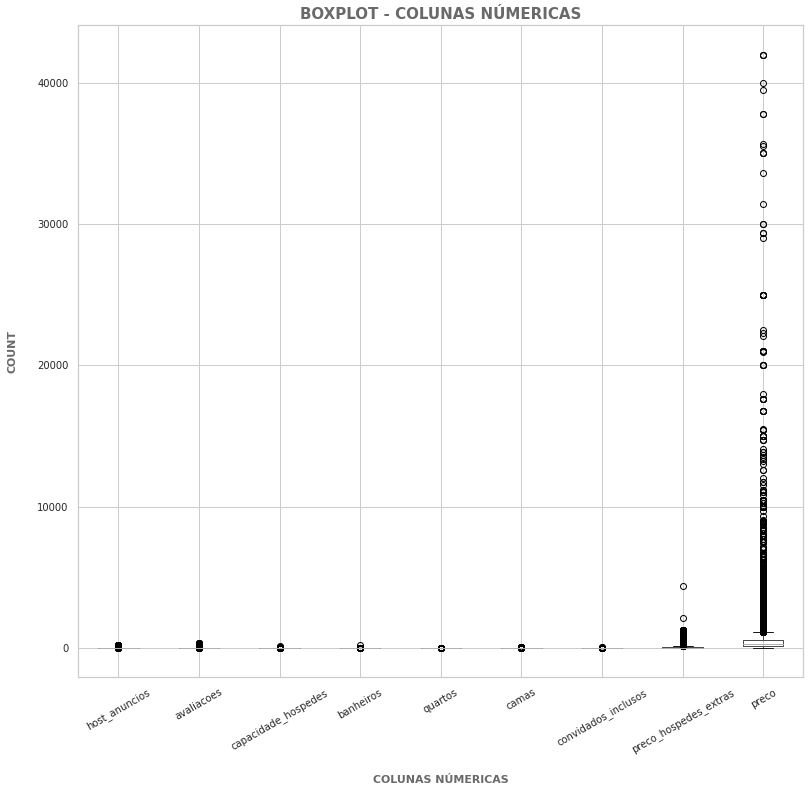

In [54]:
# Plotagem do gráfico de Boxplot para todas as variáveis númericas
plt.rcParams['figure.figsize'] = (13,12)
df_l.boxplot(column=['host_anuncios', 'avaliacoes', 'capacidade_hospedes', 'banheiros', 'quartos', 'camas',
                     'convidados_inclusos', 'preco_hospedes_extras', 'preco'
                    ], grid='true',fontsize=10, rot=30)
plt.title('BOXPLOT - COLUNAS NÚMERICAS',
         fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('COLUNAS NÚMERICAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);

**OBS:** As colunas "preco_hospedes_extras" e "preco" apresentam muitos outliers em relação às outras. Assim, vamos retirá-las do gráfico pois indica que podem afetar o comportamento das demais colunas numéricas.

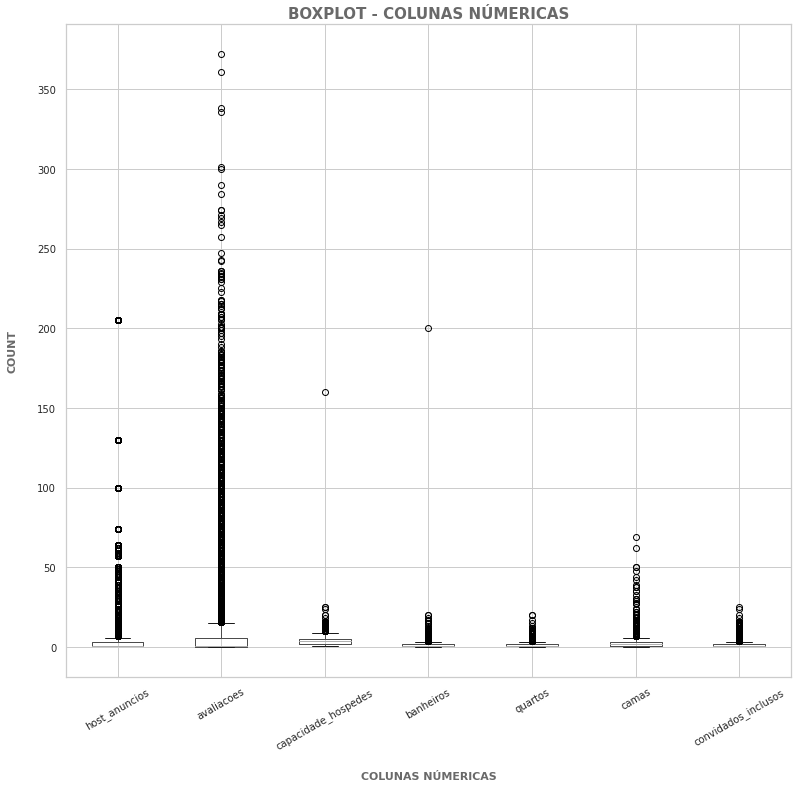

In [55]:
# Plotagem do gráfico de Boxplot para todas as variáveis númericas
plt.rcParams['figure.figsize'] = (13,12)
df_l.boxplot(column=['host_anuncios', 'avaliacoes', 'capacidade_hospedes', 'banheiros', 'quartos', 'camas',
                     'convidados_inclusos'
                    ], grid='true',fontsize=10, rot=30)
plt.title('BOXPLOT - COLUNAS NÚMERICAS',
         fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('COLUNAS NÚMERICAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);

Agora fica visualmente perceptível a existência de outliers em todas as colunas numéricas, causando assim uma distorção muito alta na distribuição dos valores.

Utilizar o Intervalo Interquartil para remoção de outliers.



<img src="boxplot3.png">

In [56]:
# Defnifição de uma função com o cálculo do intervalo interquartil(IIQ) e limites inferior e superior, utilizando-se a constante c = 1.5
# de modo a se obter uma lista de índices de outliers
def outliers(df, ft):
    Q1 = df[ft].quantile(0.25) # Primeiro Quartil
    Q3 = df[ft].quantile(0.75) # Terceiro Quartil
    IIQ = Q3 - Q1              # Intervalo Interquartil
    c = 1.5                    # Constante
    
    Li = Q1 - c * IIQ          # Limite Inferior
    Ls = Q3 + c * IIQ          # Limite Superior
    
    lis = df.index[(df[ft] < Li) | (df[ft] > Ls)] 
    
    return lis

In [57]:
# Lista para armazenar os índices das linhas que contenham outliers
index_list = []
for colunas in ['host_anuncios', 'avaliacoes', 'capacidade_hospedes',
                'banheiros', 'quartos', 'camas', 'minimo_pernoite','convidados_inclusos',
                'preco_hospedes_extras', 'preco']:
    index_list.extend(outliers(df_l, colunas))

In [58]:
# Índices das linhas que contém outliers
index_list

[9,
 34,
 40,
 50,
 92,
 110,
 138,
 147,
 158,
 188,
 194,
 196,
 197,
 198,
 202,
 225,
 238,
 243,
 275,
 295,
 298,
 299,
 318,
 333,
 334,
 335,
 350,
 363,
 364,
 390,
 444,
 445,
 453,
 454,
 457,
 482,
 485,
 487,
 488,
 490,
 491,
 494,
 500,
 504,
 506,
 513,
 515,
 516,
 517,
 518,
 531,
 543,
 547,
 549,
 550,
 565,
 579,
 593,
 594,
 596,
 602,
 603,
 604,
 605,
 607,
 615,
 618,
 623,
 634,
 642,
 643,
 649,
 656,
 658,
 659,
 661,
 675,
 684,
 714,
 715,
 716,
 750,
 756,
 765,
 773,
 786,
 819,
 831,
 846,
 857,
 899,
 912,
 915,
 919,
 920,
 927,
 932,
 948,
 949,
 952,
 964,
 985,
 990,
 995,
 1009,
 1010,
 1011,
 1012,
 1014,
 1015,
 1017,
 1022,
 1034,
 1039,
 1045,
 1047,
 1055,
 1104,
 1105,
 1109,
 1118,
 1120,
 1132,
 1134,
 1136,
 1140,
 1142,
 1146,
 1162,
 1171,
 1173,
 1183,
 1184,
 1188,
 1197,
 1213,
 1217,
 1226,
 1232,
 1233,
 1239,
 1240,
 1246,
 1248,
 1252,
 1255,
 1256,
 1262,
 1269,
 1284,
 1306,
 1311,
 1312,
 1313,
 1315,
 1319,
 1320,
 1324,
 132

In [59]:
# Definição de uma função para excluir os outliers do Dataframe
def remove(df, lis):
    lis = sorted(set(lis))
    df = df.drop(lis)
    return df

In [60]:
# Novo Dataframe sem outliers
df_t = remove(df_l, index_list)

In [61]:
# Tamanho do novo Dataframse sem outliers
df_t.shape

(12327, 22)

<Figure size 1152x576 with 0 Axes>

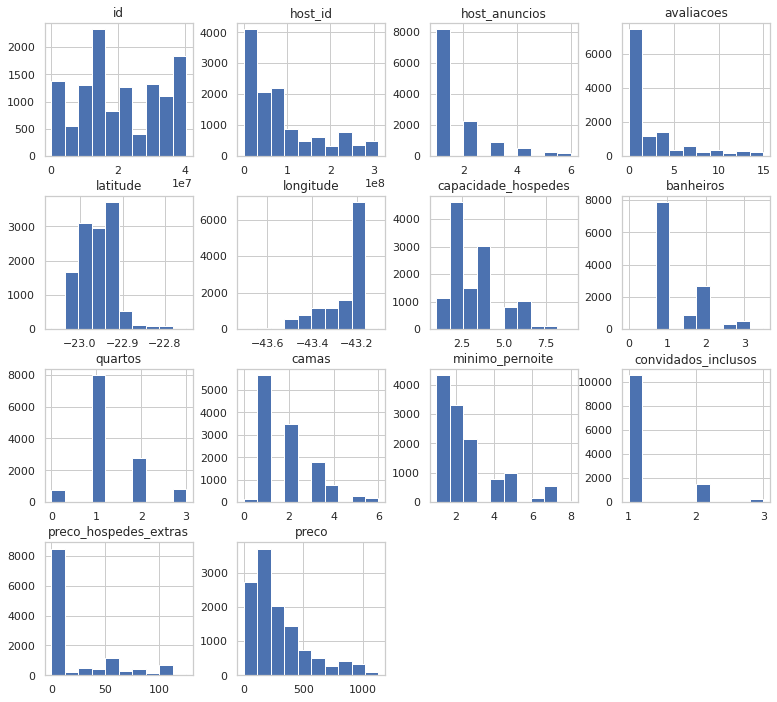

In [62]:
# Histograma das colunas númericas após a remoção de outliers.
sns.set(style="whitegrid")
plt.figure(figsize = (16,8))
df_t.hist()
plt.show();

##  Análise do preço após a remoção dos outliers <h2>

Coluna "preco"

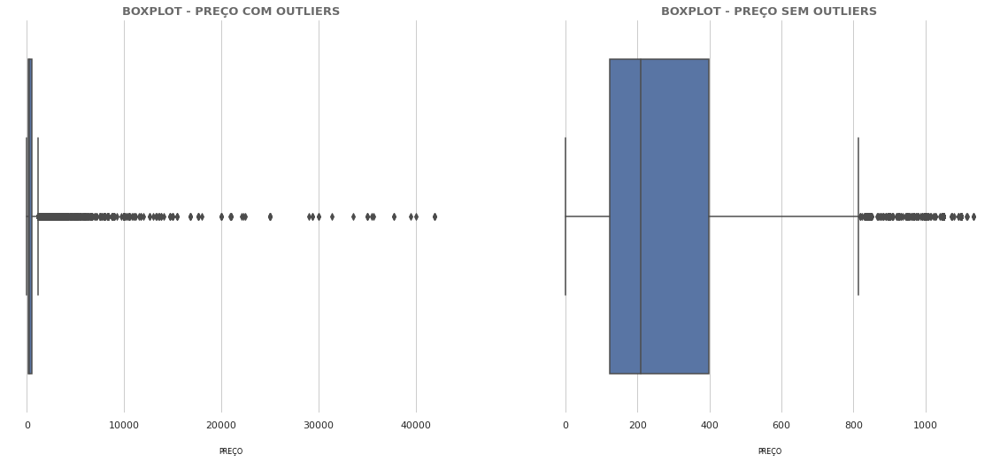

In [63]:
# Gráfico preço antes e após a remoção e outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.boxplot(df_l['preco'], data=df_l)


plt.title('BOXPLOT - PREÇO COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('PREÇO', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.boxplot(df_t['preco'], data=df_t)


plt.title('BOXPLOT - PREÇO SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('PREÇO', color = 'black', labelpad = 20, fontsize = 8);

In [64]:
# Resumo estatístico da coluna 'preco'
df_t['preco'].describe().T

count    12327.000000
mean       297.064087
std        237.092385
min          0.000000
25%        122.000000
50%        210.000000
75%        399.000000
max       1134.000000
Name: preco, dtype: float64

In [65]:
# Preços mais frequentes
df_t['preco'].value_counts()

202.0     678
151.0     616
298.0     563
101.0     533
252.0     520
399.0     420
500.0     397
348.0     370
122.0     341
80.0      295
181.0     283
88.0      259
600.0     238
999.0     235
130.0     206
71.0      193
59.0      186
802.0     180
449.0     178
50.0      169
109.0     155
168.0     147
160.0     146
139.0     146
218.0     145
210.0     134
701.0     131
189.0     131
97.0      123
84.0      118
76.0      117
231.0     114
420.0     113
126.0     110
147.0      98
63.0       93
105.0      93
550.0      93
281.0      90
42.0       88
840.0      76
239.0      75
630.0      72
46.0       70
290.0      66
651.0      65
751.0      65
898.0      65
319.0      61
382.0      60
67.0       55
1050.0     55
55.0       54
176.0      54
197.0      54
155.0      53
294.0      49
113.0      49
185.0      49
134.0      47
260.0      45
92.0       45
269.0      42
164.0      41
332.0      40
504.0      37
193.0      36
248.0      35
848.0      35
118.0      33
315.0      33
336.0 

In [66]:
# Frequência dos preços em termos de porcentagem
round(df_t['preco'].value_counts(normalize=True) * 100)

202.0     6.0
151.0     5.0
298.0     5.0
101.0     4.0
252.0     4.0
399.0     3.0
500.0     3.0
348.0     3.0
122.0     3.0
80.0      2.0
181.0     2.0
88.0      2.0
600.0     2.0
999.0     2.0
130.0     2.0
71.0      2.0
59.0      2.0
802.0     1.0
449.0     1.0
50.0      1.0
109.0     1.0
168.0     1.0
160.0     1.0
139.0     1.0
218.0     1.0
210.0     1.0
701.0     1.0
189.0     1.0
97.0      1.0
84.0      1.0
76.0      1.0
231.0     1.0
420.0     1.0
126.0     1.0
147.0     1.0
63.0      1.0
105.0     1.0
550.0     1.0
281.0     1.0
42.0      1.0
840.0     1.0
239.0     1.0
630.0     1.0
46.0      1.0
290.0     1.0
651.0     1.0
751.0     1.0
898.0     1.0
319.0     0.0
382.0     0.0
67.0      0.0
1050.0    0.0
55.0      0.0
176.0     0.0
197.0     0.0
155.0     0.0
294.0     0.0
113.0     0.0
185.0     0.0
134.0     0.0
260.0     0.0
92.0      0.0
269.0     0.0
164.0     0.0
332.0     0.0
504.0     0.0
193.0     0.0
248.0     0.0
848.0     0.0
118.0     0.0
315.0     0.0
336.0 

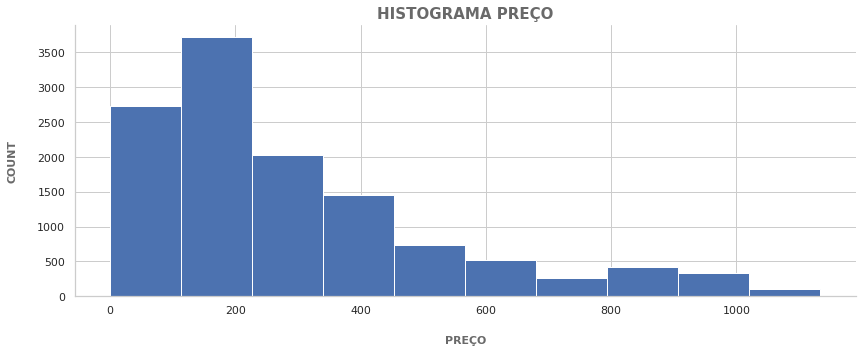

In [67]:
# Coluna 'preco' em forma de histograma
plt.figure(figsize = (14,5))
df_t['preco'].hist()
sns.despine()
plt.title('HISTOGRAMA PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);

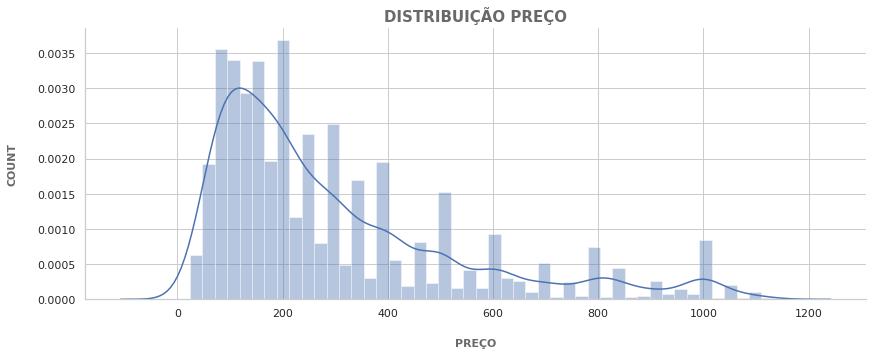

In [68]:
# Distribuição do preço
plt.figure(figsize = (14,5))
sns.distplot(df_t['preco']).set_title('PREÇO')
sns.despine()
plt.title('DISTRIBUIÇÃO PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);

In [69]:
# Acomodações com os preços mais altos após a remoção linhas que faziam referência a eventos esportivos
df_t.sort_values('preco', ascending=True).head(100)

,id,nome,host_id,superhost,host_verificado,host_anuncios,avaliacoes,reserva_instantanea,bairro_ajustado,latitude,longitude,acomodacao,tipo_quarto,capacidade_hospedes,banheiros,quartos,camas,tipo_cama,minimo_pernoite,convidados_inclusos,preco_hospedes_extras,preco
20413,20269038,"APT ESPIGÃO ,MENSAL OU ESTADIAS PROLONGADA13°andar",100693784,f,f,4,4,t,Jacarepaguá,-22.97320,-43.41019,Apartment,Entire home/apt,4,1.0,2,4,Real Bed,3,1,0.0,0.0
20261,19865325,Vaga em apartamento conjugado(LEIAM A DESCRIÇÃO!!),116767818,f,f,1,1,t,Copacabana,-22.96580,-43.18147,Apartment,Shared room,6,1.0,1,6,Real Bed,1,1,0.0,29.0
20825,20958582,Aluguel quarto individual/divisão de apto,150744348,f,f,1,0,t,Recreio dos Bandeirantes,-23.02005,-43.47540,Apartment,Private room,2,2.0,0,2,Real Bed,1,1,0.0,29.0
19673,18228027,Quarto para 1 pessoa na Tijuca,89547164,f,f,1,0,f,Tijuca,-22.91888,-43.23077,Apartment,Private room,1,1.0,1,1,Real Bed,3,1,0.0,29.0
16609,14202392,"Quarto no Itanhangá, zona oeste",86174628,f,f,1,0,f,Itanhangá,-22.98185,-43.32656,House,Private room,1,1.0,1,1,Real Bed,1,1,0.0,34.0
15029,13919884,quarto com suite,75048740,f,f,1,0,f,Vila Isabel,-22.91442,-43.24213,Apartment,Private room,1,1.0,1,1,Airbed,1,1,0.0,34.0
11807,12828141,suite na tijuca em casa de vila,70001230,f,f,1,0,f,Tijuca,-22.92549,-43.23979,House,Private room,2,2.0,1,1,Real Bed,1,1,0.0,34.0
226,313441,quarto com suite e cozinha casa boa,1451937,f,f,1,2,f,Senador Camará,-22.88177,-43.49129,House,Private room,2,1.0,1,1,Real Bed,1,1,45.0,34.0
21192,21461894,Quarto Aconchegante,148854690,f,f,1,0,t,Alto da Boa Vista,-22.94717,-43.25974,House,Private room,2,1.0,1,1,Real Bed,1,1,0.0,34.0
11472,12567639,QUARTO a 1600m da UERJ/Maracanã,68136213,f,f,1,2,t,Mangueira,-22.89997,-43.24065,House,Private room,2,1.0,1,1,Real Bed,1,1,40.0,34.0


Com o tratamento de valores nulos e a remoção de outliers, agora podemos dedicar-nos a responder às perguntas de negócio.

Renomeação das colunas "acomodacao", "tipo_quarto" e "tipo_cama"

In [70]:
# Renomeando os valores da coluna "acomodacao"
df_t.loc[df_t['acomodacao'] ==  'Apartment', 'acomodacao'] = "apartamento"
df_t.loc[df_t['acomodacao'] ==  'House', 'acomodacao'] = "casa"
df_t.loc[df_t['acomodacao'] ==  'Condominium', 'acomodacao'] = "condominio"
df_t.loc[df_t['acomodacao'] ==  'Serviced apartment', 'acomodacao'] = "apartamento_com_servico"
df_t.loc[df_t['acomodacao'] ==  'Loft', 'acomodacao'] = "loft"
df_t.loc[df_t['acomodacao'] ==  'Guest suite', 'acomodacao'] = "suite"
df_t.loc[df_t['acomodacao'] ==  'Bed and breakfast', 'acomodacao'] = "acomodacao_cama_e_cafe"
df_t.loc[df_t['acomodacao'] ==  'Guesthouse', 'acomodacao'] = "casa_de_hospedes"
df_t.loc[df_t['acomodacao'] ==  'Hostel', 'acomodacao'] = "hostel"
df_t.loc[df_t['acomodacao'] ==  'Villa', 'acomodacao'] = "vila"
df_t.loc[df_t['acomodacao'] ==  'Hotel', 'acomodacao'] = "hotel"
df_t.loc[df_t['acomodacao'] ==  'Other', 'acomodacao'] = "outros"
df_t.loc[df_t['acomodacao'] ==  'Aparthotel', 'acomodacao'] = "apart_hotel"
df_t.loc[df_t['acomodacao'] ==  'Townhouse', 'acomodacao'] = "casa_germinada"
df_t.loc[df_t['acomodacao'] ==  'Boutique hotel', 'acomodacao'] = "hotel_boutique"
df_t.loc[df_t['acomodacao'] ==  'Chalet', 'acomodacao'] = "chale"
df_t.loc[df_t['acomodacao'] ==  'Boat', 'acomodacao'] = "barco_hotel"
df_t.loc[df_t['acomodacao'] ==  'Tiny house', 'acomodacao'] = "casa_minuscula"
df_t.loc[df_t['acomodacao'] ==  'Earth house', 'acomodacao'] = "casa_terra"
df_t.loc[df_t['acomodacao'] ==  'Cottage', 'acomodacao'] = "cottage"
df_t.loc[df_t['acomodacao'] ==  'Nature lodge', 'acomodacao'] = "pousada_natural"
df_t.loc[df_t['acomodacao'] ==  'Bungalow', 'acomodacao'] = "bangalo"
df_t.loc[df_t['acomodacao'] ==  'Casa particular (Cuba)', 'acomodacao'] = "casa_particular_compartilhada"
df_t.loc[df_t['acomodacao'] ==  'Island', 'acomodacao'] = "ilha"
df_t.loc[df_t['acomodacao'] ==  'Cabin', 'acomodacao'] = "cabana"
df_t.loc[df_t['acomodacao'] ==  'Treehouse', 'acomodacao'] = "casa_na_arvore"
df_t.loc[df_t['acomodacao'] ==  'Castle', 'acomodacao'] = "castelo"
df_t.loc[df_t['acomodacao'] ==  'Hut', 'acomodacao'] = "choupana"
df_t.loc[df_t['acomodacao'] ==  'Camper/RV', 'acomodacao'] = "veiculo_recreativo"
df_t.loc[df_t['acomodacao'] ==  'Igloo', 'acomodacao'] = "iglu"
df_t.loc[df_t['acomodacao'] ==  'Campsite', 'acomodacao'] = "acampamento"
df_t.loc[df_t['acomodacao'] ==  'Houseboat', 'acomodacao'] = "casa_flutuante"

In [71]:
# Renomeando os valores da coluna 'tipo_quarto'
df_t.loc[df_t['tipo_quarto'] ==  'Entire home/apt', 'tipo_quarto'] = "espaco_inteiro"
df_t.loc[df_t['tipo_quarto'] ==  'Private room', 'tipo_quarto'] = "quarto_privado"
df_t.loc[df_t['tipo_quarto'] ==  'Shared room', 'tipo_quarto'] = "quarto_compartilhado"
df_t.loc[df_t['tipo_quarto'] ==  'Hotel room', 'tipo_quarto'] = "quarto_hotel"

In [72]:
# Renomeando os valores da coluna 'tipo_camas'
df_t.loc[df_t['tipo_cama'] ==  'Real Bed', 'tipo_cama'] = "cama_real"
df_t.loc[df_t['tipo_cama'] ==  'Pull-out Sofa', 'tipo_cama'] = "sofa_cama"
df_t.loc[df_t['tipo_cama'] ==  'Futon', 'tipo_cama'] = "futon"
df_t.loc[df_t['tipo_cama'] ==  'Airbed', 'tipo_cama'] = "colchao_ar"
df_t.loc[df_t['tipo_cama'] ==  'Couch', 'tipo_cama'] = "sofa"

# 1- Quais são os tipos de acomodações mais ofertadas e quais possuem maior faturamento?

Coluna "acomodacao"

In [73]:
# Valores únicos da coluna "acomodacao"
df_t['acomodacao'].unique()

array(['apartamento', 'casa', 'loft', 'condominio', 'hostel',
       'casa_de_hospedes', 'chale', 'bangalo', 'casa_na_arvore', 'outros',
       'acomodacao_cama_e_cafe', 'apart_hotel', 'apartamento_com_servico',
       'hotel_boutique', 'vila', 'cottage', 'casa_germinada', 'suite',
       'casa_terra', 'cabana', 'barco_hotel', 'casa_minuscula', 'castelo',
       'choupana', 'Yurt', 'casa_particular_compartilhada',
       'pousada_natural', 'hotel', 'veiculo_recreativo', 'iglu', 'ilha'],
      dtype=object)

In [74]:
# Breve resumo estatístico da coluna 'acomodacao'
df_t['acomodacao'].describe().T

count           12327
unique             31
top       apartamento
freq             9050
Name: acomodacao, dtype: object

In [75]:
# Tipo de acomodações mais frequentes
df_t['acomodacao'].value_counts()

apartamento                      9050
casa                             1455
condominio                        816
apartamento_com_servico           256
loft                              222
suite                             105
acomodacao_cama_e_cafe             65
casa_de_hospedes                   57
vila                               46
hostel                             42
outros                             40
casa_minuscula                     25
casa_germinada                     23
chale                              22
hotel                              17
casa_terra                         15
hotel_boutique                     13
apart_hotel                        12
cottage                            10
casa_particular_compartilhada       8
bangalo                             6
pousada_natural                     4
casa_na_arvore                      3
cabana                              3
ilha                                3
choupana                            3
castelo     

In [76]:
# Frequência dos tipos de acomodações em termos de porcentagem
df_t['acomodacao'].value_counts(normalize=True) * 100

apartamento                      73.416079
casa                             11.803358
condominio                        6.619615
apartamento_com_servico           2.076742
loft                              1.800925
suite                             0.851789
acomodacao_cama_e_cafe            0.527298
casa_de_hospedes                  0.462400
vila                              0.373165
hostel                            0.340716
outros                            0.324491
casa_minuscula                    0.202807
casa_germinada                    0.186582
chale                             0.178470
hotel                             0.137909
casa_terra                        0.121684
hotel_boutique                    0.105460
apart_hotel                       0.097347
cottage                           0.081123
casa_particular_compartilhada     0.064898
bangalo                           0.048674
pousada_natural                   0.032449
casa_na_arvore                    0.024337
cabana     

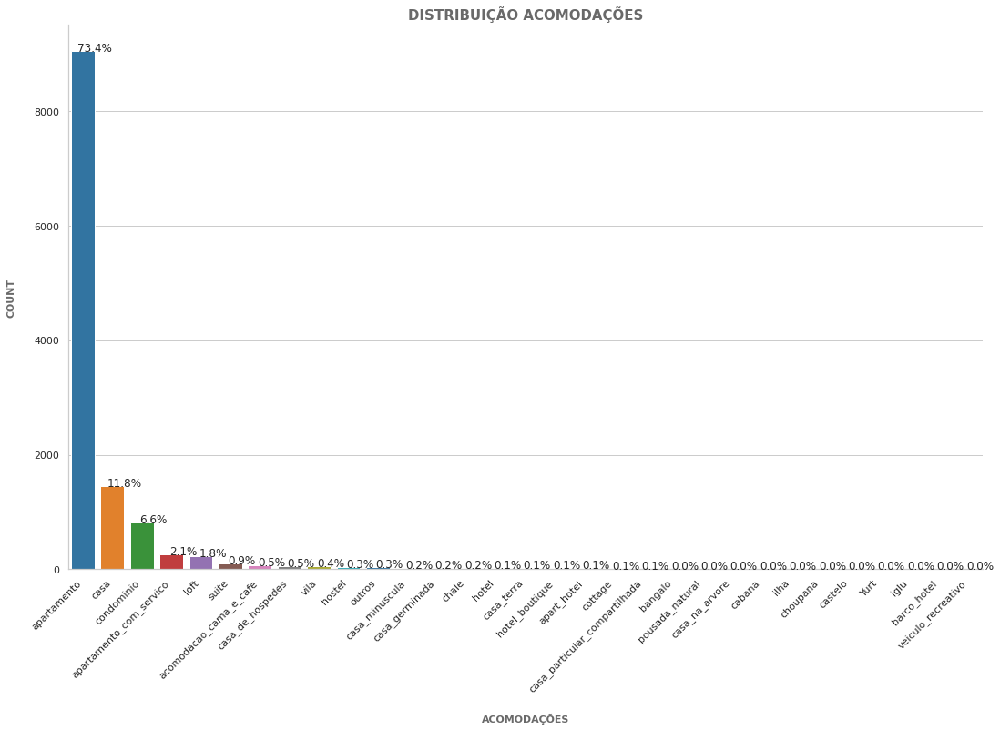

In [77]:
# Gráfico Distribuição de Acomodações
sns.set(style="whitegrid")
plt.figure(figsize=(18,11))

total = float(df_t.shape[0])

ax = sns.countplot(x='acomodacao', data=df_t, palette='tab10', order = df_t['acomodacao'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO ACOMODAÇÕES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
plt.xlabel('ACOMODAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);
plt.xticks(rotation=45, ha='right')
plt.show()

In [78]:
# Resumo estatístico de cada um dos tipos de acomodações em termos do preço
df_t.groupby('acomodacao')['preco'].describe().round(2).T

acomodacao,Yurt,acomodacao_cama_e_cafe,apart_hotel,apartamento,apartamento_com_servico,bangalo,barco_hotel,cabana,casa,casa_de_hospedes,casa_germinada,casa_minuscula,casa_na_arvore,casa_particular_compartilhada,casa_terra,castelo,chale,choupana,condominio,cottage,hostel,hotel,hotel_boutique,iglu,ilha,loft,outros,pousada_natural,suite,veiculo_recreativo,vila
count,1.0,65.00,12.00,9050.00,256.00,6.00,1.0,3.00,1455.00,57.00,23.00,25.00,3.00,8.00,15.00,2.00,22.00,3.00,816.00,10.00,42.00,17.00,13.00,1.0,3.00,222.00,40.00,4.00,105.00,1.0,46.00
mean,172.0,200.55,365.83,313.22,309.58,357.50,202.0,479.67,235.33,189.07,195.87,211.12,421.33,103.62,174.40,254.00,193.73,106.33,283.27,274.10,123.57,440.06,331.92,46.0,219.67,263.23,262.42,254.25,169.15,252.0,310.46
std,NaN,144.66,235.98,245.15,192.04,329.68,NaN,455.02,208.68,130.19,142.44,217.71,192.05,40.02,247.04,162.63,124.70,38.89,216.46,171.40,132.66,281.96,113.49,NaN,73.98,199.06,216.17,106.35,96.57,NaN,245.69
min,172.0,42.00,130.00,0.00,63.00,105.00,202.0,151.00,34.00,42.00,42.00,42.00,252.00,38.00,42.00,139.00,55.00,80.00,38.00,105.00,38.00,101.00,76.00,46.0,151.00,38.00,34.00,97.00,38.00,252.0,46.00
25%,172.0,88.00,239.50,130.00,181.00,154.50,202.0,220.00,101.00,101.00,96.50,84.00,317.00,95.75,52.50,196.50,95.50,84.00,122.00,151.00,50.00,252.00,298.00,46.0,180.50,132.25,134.75,244.75,101.00,252.0,101.00
50%,172.0,172.00,300.00,231.00,252.00,285.50,202.0,289.00,151.00,151.00,151.00,130.00,382.00,101.00,71.00,254.00,155.00,88.00,214.00,207.50,69.00,306.00,319.00,46.0,210.00,202.00,191.50,294.00,151.00,252.0,245.00
75%,172.0,260.00,404.25,399.00,391.25,340.75,202.0,644.00,298.00,239.00,231.00,252.00,506.00,109.25,166.00,311.50,261.25,119.50,390.00,373.75,130.00,546.00,382.00,46.0,254.00,298.00,323.25,303.50,202.00,252.0,452.00
max,172.0,676.00,999.00,1134.00,1008.00,999.00,202.0,999.00,1134.00,558.00,600.00,999.00,630.00,181.00,999.00,369.00,449.00,151.00,1100.00,600.00,701.00,1012.00,533.00,46.0,298.00,1050.00,961.00,332.00,600.00,252.0,1029.00


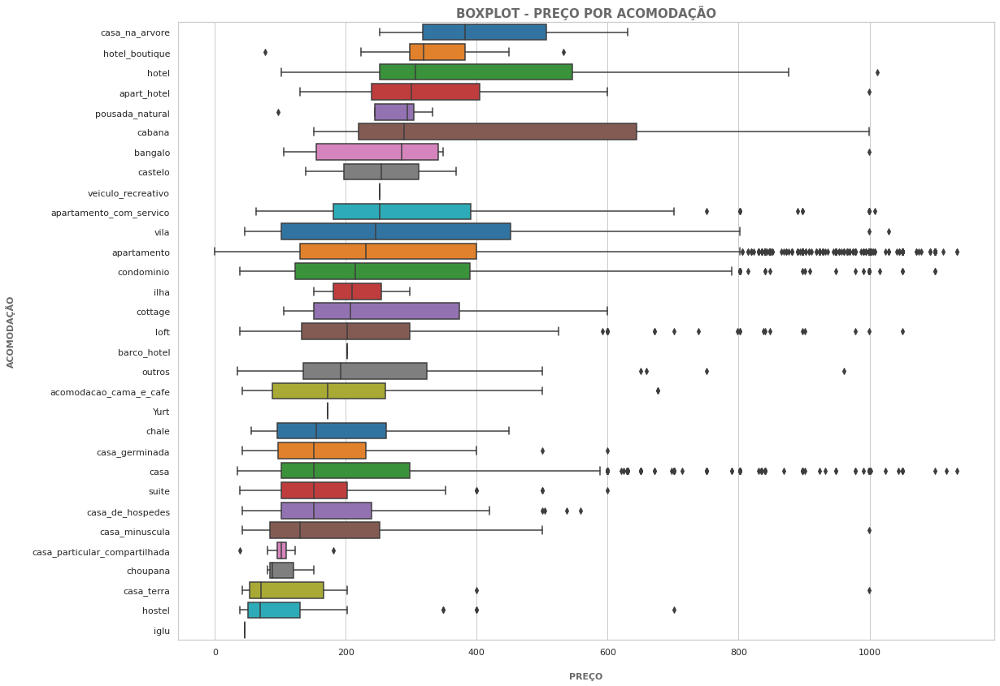

In [79]:
# Boxplot preço por tipo de acomodação

# Plot
plt.figure(figsize = (18,14))
sns.boxplot(data=df_t, x='preco', y='acomodacao', palette = "tab10", order = df_t.groupby(["acomodacao"])["preco"].median().sort_values(ascending=False).index);
plt.title('BOXPLOT - PREÇO POR ACOMODAÇÃO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('ACOMODAÇÃO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);
plt.show()

In [80]:
# Média de preço por tipo de acomodação
df_t.groupby(['acomodacao'])['preco'].mean().round(2).sort_values(ascending=False)

acomodacao
cabana                           479.67
hotel                            440.06
casa_na_arvore                   421.33
apart_hotel                      365.83
bangalo                          357.50
hotel_boutique                   331.92
apartamento                      313.22
vila                             310.46
apartamento_com_servico          309.58
condominio                       283.27
cottage                          274.10
loft                             263.23
outros                           262.42
pousada_natural                  254.25
castelo                          254.00
veiculo_recreativo               252.00
casa                             235.33
ilha                             219.67
casa_minuscula                   211.12
barco_hotel                      202.00
acomodacao_cama_e_cafe           200.55
casa_germinada                   195.87
chale                            193.73
casa_de_hospedes                 189.07
casa_terra                   

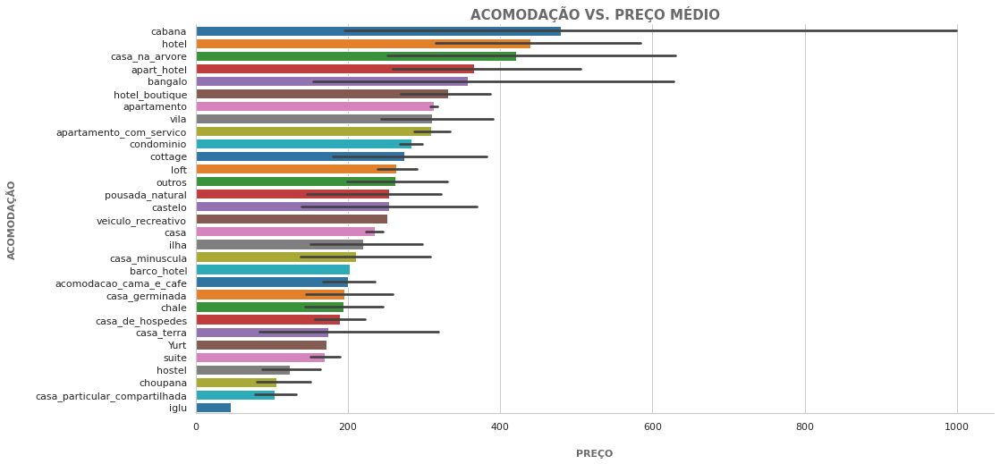

In [81]:
# Gráfico preço médio por tipo de acomodação

# Plot
plt.figure(figsize = (16,8))
sns.barplot(x = 'preco', y = 'acomodacao', orient = "h", data=df_t, palette = "tab10", order = df_t.groupby(["acomodacao"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('ACOMODAÇÃO VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('ACOMODAÇÃO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11);
plt.show()

In [82]:
# Receita por tipo de acomodação
df_t.groupby(['acomodacao'])['preco'].sum().sort_values(ascending=False)

acomodacao
apartamento                      2834678.0
casa                              342412.0
condominio                        231148.0
apartamento_com_servico            79253.0
loft                               58436.0
suite                              17761.0
vila                               14281.0
acomodacao_cama_e_cafe             13036.0
casa_de_hospedes                   10777.0
outros                             10497.0
hotel                               7481.0
casa_minuscula                      5278.0
hostel                              5190.0
casa_germinada                      4505.0
apart_hotel                         4390.0
hotel_boutique                      4315.0
chale                               4262.0
cottage                             2741.0
casa_terra                          2616.0
bangalo                             2145.0
cabana                              1439.0
casa_na_arvore                      1264.0
pousada_natural                     1017.0


In [83]:
# Tabela analítica receita por tipo de acomodação
ra = df_t.groupby(by=['acomodacao']).sum()['preco'].reset_index() # receita por tipo de acomodação(ra)
ra.head()

,acomodacao,preco
0,Yurt,172.0
1,acomodacao_cama_e_cafe,13036.0
2,apart_hotel,4390.0
3,apartamento,2834678.0
4,apartamento_com_servico,79253.0


In [84]:
# Tabela analítica receita por tipo de acomodação em ordem decrescente
rad = ra.sort_values('preco', ascending=False) # receita por tipo de acomodação em ordem decrescente(rad)
rad.head()

,acomodacao,preco
3,apartamento,2834678.0
8,casa,342412.0
18,condominio,231148.0
4,apartamento_com_servico,79253.0
25,loft,58436.0


<Figure size 720x720 with 0 Axes>

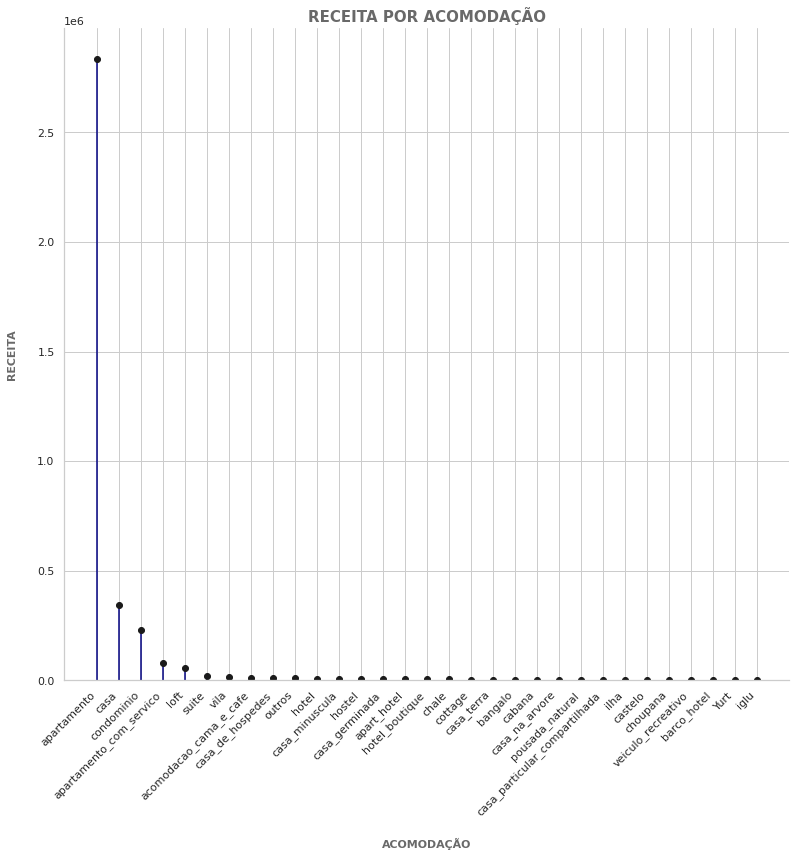

In [85]:
# Gráfico receita por Acomodações

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rad['acomodacao'], ymin=0, ymax=rad['preco'], color='navy')
  
axes.plot(rad['acomodacao'], rad['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR ACOMODAÇÃO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('ACOMODAÇÃO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.xticks(rotation=45, ha='right')
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

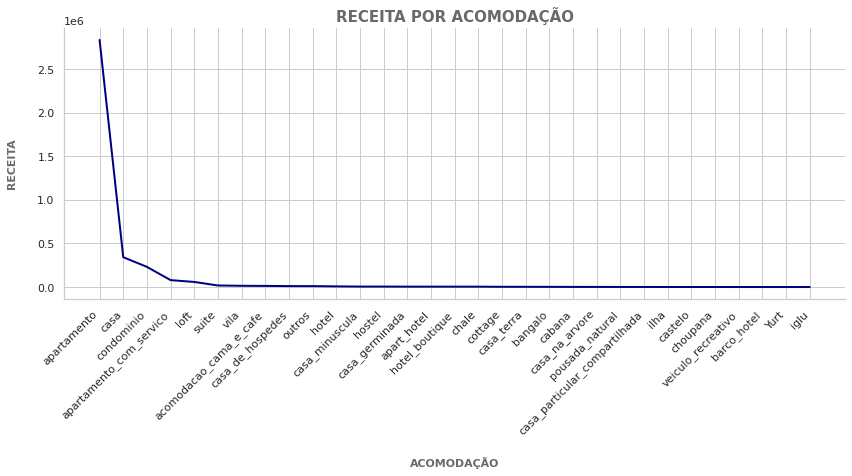

In [86]:
# Gráfico receita por tipo de acomodação
plt.figure(figsize=(14,5))
plt.plot(rad['acomodacao'], rad['preco'], color='navy', linewidth = '2')
sns.despine()
plt.title('RECEITA POR ACOMODAÇÃO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('ACOMODAÇÃO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.xticks(rotation=45, ha='right')
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Apartamento é o tipo de acomodação mais comum no Rio de Janeiro e o que apresenta maior faturamento
- Cabana é a que possui maior preço médio

# **2-** Quais são os Top 10 acomodações mais caras e mais baratas?

In [87]:
# Visualizar as acomodações com os preços mais caros
df_t.sort_values('preco', ascending=False).head(10)

,id,nome,host_id,superhost,host_verificado,host_anuncios,avaliacoes,reserva_instantanea,bairro_ajustado,latitude,longitude,acomodacao,tipo_quarto,capacidade_hospedes,banheiros,quartos,camas,tipo_cama,minimo_pernoite,convidados_inclusos,preco_hospedes_extras,preco
33011,39778367,Santa Clara Aconchego.,227005551,f,f,2,0,t,Copacabana,-22.97016,-43.18983,apartamento,espaco_inteiro,4,1.0,1,1,cama_real,3,1,0.0,1134.0
10762,12017320,Quarto em Casa em Vargem Grande,61163071,f,f,4,0,t,Vargem Pequena,-22.98251,-43.45401,casa,quarto_privado,2,1.0,1,1,cama_real,3,1,0.0,1134.0
15897,14074526,Ótimo apto de 3 quartos 50m da praia do Recreio,37915278,f,f,1,0,t,Recreio dos Bandeirantes,-23.02246,-43.45269,apartamento,espaco_inteiro,6,3.0,3,4,cama_real,7,1,0.0,1134.0
8759,10540733,"Award Winning Historical Home, Rio.",30582748,f,t,1,14,f,Jardim Botânico,-22.96394,-43.22632,casa,espaco_inteiro,4,2.0,2,3,cama_real,1,1,0.0,1117.0
27482,32121867,Apezinho super aconchegante no Aterro do Flamengo,139619493,f,f,2,0,t,Glória,-22.92237,-43.17284,apartamento,espaco_inteiro,2,1.0,0,2,cama_real,1,1,0.0,1113.0
30063,36424563,Cartão Postal da Baia da Guanabara.,273861175,f,f,2,0,f,Glória,-22.91192,-43.16976,apartamento,espaco_inteiro,2,1.5,1,2,cama_real,1,1,0.0,1100.0
5788,5268389,apto Ipanema entre o mar e a Lagoa,26909189,f,f,1,10,f,Ipanema,-22.98108,-43.20039,condominio,espaco_inteiro,6,2.0,3,5,cama_real,1,1,0.0,1100.0
33574,40183370,Apartamento do jeh,310307171,f,f,1,0,t,Barra da Tijuca,-23.00281,-43.34285,apartamento,espaco_inteiro,7,2.0,0,1,cama_real,4,1,0.0,1100.0
3633,2966210,Apartamento 3 quartos na Barra,15134470,f,f,1,0,f,Barra da Tijuca,-22.99075,-43.35018,apartamento,espaco_inteiro,4,3.0,3,2,cama_real,1,1,0.0,1100.0
10084,11469787,Cobertura à duas quadras do BRT,60342635,f,f,1,0,f,Vila da Penha,-22.84852,-43.31308,apartamento,espaco_inteiro,7,2.5,3,6,cama_real,1,1,0.0,1100.0


In [88]:
# Top 10 acomodações mais caras
df_t.nlargest(10, 'preco')[['nome','preco']]

,nome,preco
10762,Quarto em Casa em Vargem Grande,1134.0
15897,Ótimo apto de 3 quartos 50m da praia do Recreio,1134.0
33011,Santa Clara Aconchego.,1134.0
8759,"Award Winning Historical Home, Rio.",1117.0
27482,Apezinho super aconchegante no Aterro do Flamengo,1113.0
2026,Luxo e alta decoração no leblon RJ,1100.0
2681,Apto totalmente novo em Ipanema,1100.0
3633,Apartamento 3 quartos na Barra,1100.0
4158,Recreio dos Bandeirantes,1100.0
5788,apto Ipanema entre o mar e a Lagoa,1100.0


In [89]:
# Visualizar as acomodações com os preços mais baratos
df_t.sort_values('preco', ascending=True).head(10)

,id,nome,host_id,superhost,host_verificado,host_anuncios,avaliacoes,reserva_instantanea,bairro_ajustado,latitude,longitude,acomodacao,tipo_quarto,capacidade_hospedes,banheiros,quartos,camas,tipo_cama,minimo_pernoite,convidados_inclusos,preco_hospedes_extras,preco
20413,20269038,"APT ESPIGÃO ,MENSAL OU ESTADIAS PROLONGADA13°andar",100693784,f,f,4,4,t,Jacarepaguá,-22.97320,-43.41019,apartamento,espaco_inteiro,4,1.0,2,4,cama_real,3,1,0.0,0.0
20261,19865325,Vaga em apartamento conjugado(LEIAM A DESCRIÇÃO!!),116767818,f,f,1,1,t,Copacabana,-22.96580,-43.18147,apartamento,quarto_compartilhado,6,1.0,1,6,cama_real,1,1,0.0,29.0
20825,20958582,Aluguel quarto individual/divisão de apto,150744348,f,f,1,0,t,Recreio dos Bandeirantes,-23.02005,-43.47540,apartamento,quarto_privado,2,2.0,0,2,cama_real,1,1,0.0,29.0
19673,18228027,Quarto para 1 pessoa na Tijuca,89547164,f,f,1,0,f,Tijuca,-22.91888,-43.23077,apartamento,quarto_privado,1,1.0,1,1,cama_real,3,1,0.0,29.0
16609,14202392,"Quarto no Itanhangá, zona oeste",86174628,f,f,1,0,f,Itanhangá,-22.98185,-43.32656,casa,quarto_privado,1,1.0,1,1,cama_real,1,1,0.0,34.0
15029,13919884,quarto com suite,75048740,f,f,1,0,f,Vila Isabel,-22.91442,-43.24213,apartamento,quarto_privado,1,1.0,1,1,colchao_ar,1,1,0.0,34.0
11807,12828141,suite na tijuca em casa de vila,70001230,f,f,1,0,f,Tijuca,-22.92549,-43.23979,casa,quarto_privado,2,2.0,1,1,cama_real,1,1,0.0,34.0
226,313441,quarto com suite e cozinha casa boa,1451937,f,f,1,2,f,Senador Camará,-22.88177,-43.49129,casa,quarto_privado,2,1.0,1,1,cama_real,1,1,45.0,34.0
21192,21461894,Quarto Aconchegante,148854690,f,f,1,0,t,Alto da Boa Vista,-22.94717,-43.25974,casa,quarto_privado,2,1.0,1,1,cama_real,1,1,0.0,34.0
11472,12567639,QUARTO a 1600m da UERJ/Maracanã,68136213,f,f,1,2,t,Mangueira,-22.89997,-43.24065,casa,quarto_privado,2,1.0,1,1,cama_real,1,1,40.0,34.0


In [90]:
# Top 10 acomodações mais baratas
df_t.nsmallest(10, 'preco')[['nome','preco']]

,nome,preco
20413,"APT ESPIGÃO ,MENSAL OU ESTADIAS PROLONGADA13°andar",0.0
19673,Quarto para 1 pessoa na Tijuca,29.0
20261,Vaga em apartamento conjugado(LEIAM A DESCRIÇÃO!!),29.0
20825,Aluguel quarto individual/divisão de apto,29.0
226,quarto com suite e cozinha casa boa,34.0
11472,QUARTO a 1600m da UERJ/Maracanã,34.0
11807,suite na tijuca em casa de vila,34.0
15029,quarto com suite,34.0
16609,"Quarto no Itanhangá, zona oeste",34.0
16732,Apto Tijuca,34.0


In [91]:
# Quantidade de acomodações com preço igual a zero
df_t['preco'][df_t['preco'] == 0].count()

1

In [92]:
# Excluir a linha que contém preço igual a zero
df_t.drop(df_t.loc[df_t['preco']== 0].index, inplace=True)

In [93]:
# Top 10 acomodações mais baratas
df_t.nsmallest(10, 'preco')[['nome','preco']]

,nome,preco
19673,Quarto para 1 pessoa na Tijuca,29.0
20261,Vaga em apartamento conjugado(LEIAM A DESCRIÇÃO!!),29.0
20825,Aluguel quarto individual/divisão de apto,29.0
226,quarto com suite e cozinha casa boa,34.0
11472,QUARTO a 1600m da UERJ/Maracanã,34.0
11807,suite na tijuca em casa de vila,34.0
15029,quarto com suite,34.0
16609,"Quarto no Itanhangá, zona oeste",34.0
16732,Apto Tijuca,34.0
20746,Apartamento Bairro de Fatima (Alto Fátima).,34.0


# 3- Quais bairros apresentam a maior quantidade de acomodações e quais possuem maior faturação total?

Coluna "bairro_ajustado"

In [94]:
# Visualizar os valores únicos da coluna "bairro_ajustado"
df_t['bairro_ajustado'].unique()

array(['Flamengo', 'Leblon', 'Itanhangá', 'Santa Teresa', 'Ipanema',
       'Humaitá', 'Copacabana', 'Botafogo', 'Santo Cristo',
       'Barra da Tijuca', 'Lagoa', 'Praça Seca', 'Laranjeiras', 'Tijuca',
       'Catete', 'Campo Grande', 'Cacuia', 'Recreio dos Bandeirantes',
       'Jacarepaguá', 'Centro', 'Rio Comprido', 'Glória',
       'Jardim Botânico', 'São Conrado', 'Senador Camará', 'Irajá',
       'Gávea', 'Vargem Grande', 'Vidigal', 'São Cristóvão', 'Estácio',
       'Grajaú', 'Gardênia Azul', 'Taquara', 'Bangu', 'Cosme Velho',
       'Anil', 'Joá', 'Alto da Boa Vista', 'Jardim Sulacap',
       'Praça da Bandeira', 'Lins de Vasconcelos', 'Santíssimo',
       'Bonsucesso', 'Urca', 'Camorim', 'Leme', 'Piedade',
       'Vila da Penha', 'Olaria', 'Cidade de Deus', 'Riachuelo',
       'Maracanã', 'Andaraí', 'Vargem Pequena', 'Cidade Nova',
       'Vila Isabel', 'Tauá', 'Engenho Novo', 'Gamboa', 'Santa Cruz',
       'Inhoaíba', 'São Francisco Xavier', 'Maria da Graça', 'Guaratiba',
  

In [95]:
# Renomeação dos Bairros substituindo-se os epaços em branco por "_"
renomeacao_bairros = list(df_t.dtypes[df_t.dtypes == 'object'].index)
for col in renomeacao_bairros:
    df_t[col] = df_t[col].str.lower().str.replace(' ', '_')

In [96]:
# Breve descrição estatística da coluna 'bairro_ajustado'
df_t['bairro_ajustado'].describe().T

count               12326
unique                144
top       barra_da_tijuca
freq                 1407
Name: bairro_ajustado, dtype: object

In [97]:
# Bairros mais frequentes
df_t['bairro_ajustado'].value_counts()

barra_da_tijuca             1407
copacabana                  1085
botafogo                     907
ipanema                      845
recreio_dos_bandeirantes     646
santa_teresa                 645
jacarepaguá                  580
leblon                       567
centro                       556
flamengo                     477
tijuca                       430
laranjeiras                  389
glória                       210
leme                         198
catete                       197
jardim_botânico              166
humaitá                      164
vila_isabel                  164
lagoa                        163
maracanã                     146
gávea                        141
são_conrado                  109
freguesia_(jacarepaguá)      105
camorim                       95
taquara                       84
vidigal                       83
cosme_velho                   74
grajaú                        73
vargem_pequena                73
rio_comprido                  69
itanhangá 

In [98]:
# Frequência dos bairros em termos de porcentagem
df_t['bairro_ajustado'].value_counts(normalize=True) * 100

barra_da_tijuca             11.414895
copacabana                   8.802531
botafogo                     7.358429
ipanema                      6.855428
recreio_dos_bandeirantes     5.240954
santa_teresa                 5.232841
jacarepaguá                  4.705501
leblon                       4.600032
centro                       4.510790
flamengo                     3.869869
tijuca                       3.488561
laranjeiras                  3.155931
glória                       1.703716
leme                         1.606361
catete                       1.598248
jardim_botânico              1.346747
humaitá                      1.330521
vila_isabel                  1.330521
lagoa                        1.322408
maracanã                     1.184488
gávea                        1.143923
são_conrado                  0.884310
freguesia_(jacarepaguá)      0.851858
camorim                      0.770729
taquara                      0.681486
vidigal                      0.673373
cosme_velho 

In [99]:
# Resumo estatístico do preço de cada um dos bairros
df_t.groupby('bairro_ajustado')['preco'].describe().round(2).T

bairro_ajustado,abolição,alto_da_boa_vista,anchieta,andaraí,anil,bancários,bangu,barra_da_tijuca,barra_de_guaratiba,barros_filho,benfica,bento_ribeiro,bonsucesso,botafogo,brás_de_pina,cachambi,cacuia,caju,camorim,campinho,campo_grande,cascadura,catete,catumbi,cavalcanti,centro,cidade_de_deus,cidade_nova,cocotá,coelho_neto,complexo_do_alemão,copacabana,cordovil,cosme_velho,cosmos,curicica,del_castilho,deodoro,encantado,engenho_da_rainha,engenho_de_dentro,engenho_novo,estácio,flamengo,freguesia_(ilha),freguesia_(jacarepaguá),galeão,gamboa,gardênia_azul,gericinó,glória,grajaú,guadalupe,guaratiba,gávea,higienópolis,honório_gurgel,humaitá,inhaúma,inhoaíba,ipanema,irajá,itanhangá,jacarepaguá,jacaré,jardim_botânico,jardim_carioca,jardim_guanabara,jardim_sulacap,joá,lagoa,laranjeiras,leblon,leme,lins_de_vasconcelos,madureira,mangueira,manguinhos,maracanã,marechal_hermes,maria_da_graça,moneró,méier,olaria,osvaldo_cruz,paciência,padre_miguel,paquetá,parada_de_lucas,parque_anchieta,pavuna,pechincha,pedra_de_guaratiba,penha,penha_circular,piedade,pilares,pitangueiras,portuguesa,praia_da_bandeira,praça_da_bandeira,praça_seca,quintino_bocaiúva,ramos,realengo,recreio_dos_bandeirantes,riachuelo,ricardo_de_albuquerque,rio_comprido,rocha,rocha_miranda,rocinha,sampaio,santa_cruz,santa_teresa,santo_cristo,santíssimo,saúde,senador_camará,senador_vasconcelos,sepetiba,são_conrado,são_cristóvão,são_francisco_xavier,tanque,taquara,tauá,tijuca,todos_os_santos,tomás_coelho,urca,vargem_grande,vargem_pequena,vasco_da_gama,vaz_lobo,vicente_de_carvalho,vidigal,vigário_geral,vila_da_penha,vila_isabel,vila_kosmos,vila_valqueire,vista_alegre,água_santa
count,2.00,23.00,3.00,56.00,33.00,4.00,14.00,1407.00,36.00,6.00,2.00,6.00,4.00,907.00,14.00,17.00,4.00,1.0,95.00,10.00,40.00,4.00,197.00,7.00,1.0,556.00,6.00,16.00,8.00,1.0,3.00,1085.00,5.00,74.00,5.00,23.00,18.00,2.00,8.0,2.00,36.00,36.00,58.00,477.00,4.00,105.00,2.00,8.00,14.00,1.0,210.00,73.00,8.00,28.00,141.00,7.00,2.00,164.00,7.00,4.00,845.00,26.00,68.00,580.00,3.00,166.00,8.00,39.00,4.00,32.00,163.00,389.00,567.00,198.00,18.00,11.00,7.00,2.00,146.00,6.00,12.00,5.00,18.00,7.00,2.00,5.00,5.00,20.00,3.00,6.00,5.00,40.00,9.00,9.00,4.00,11.00,4.00,3.00,11.00,2.00,50.00,19.00,8.00,4.00,6.00,646.00,15.00,1.0,69.00,14.00,1.0,15.00,4.00,14.00,645.00,14.00,6.00,18.00,5.00,6.00,3.00,109.00,60.00,15.00,13.00,84.00,10.00,430.00,27.00,7.00,56.00,55.00,73.00,5.00,1.0,2.00,83.00,1.0,7.00,164.00,3.00,7.00,1.0,1.0
mean,153.50,298.22,142.67,228.70,249.09,123.00,219.50,381.17,255.89,149.00,250.00,196.00,312.50,269.81,107.43,257.41,240.75,332.0,282.78,351.60,250.55,225.75,237.91,217.71,348.0,216.37,116.83,246.50,223.38,42.0,228.00,293.38,123.40,297.84,109.00,355.78,152.78,474.00,239.5,228.50,271.28,198.25,130.78,262.43,438.75,268.01,84.00,190.50,324.43,50.0,243.34,184.45,278.75,266.89,342.01,255.57,63.00,312.37,210.71,318.00,402.12,197.08,199.46,325.52,206.00,347.87,189.88,135.00,231.00,301.34,390.98,265.02,421.26,327.76,188.94,247.45,220.14,145.00,327.56,107.17,149.33,127.00,180.44,245.14,239.50,249.20,93.40,277.20,278.33,126.67,252.80,228.32,287.22,110.11,303.50,176.45,200.25,126.00,115.82,130.00,270.88,212.68,237.25,105.00,313.67,321.32,327.67,298.0,236.65,220.21,101.0,197.00,123.00,141.71,209.35,204.93,267.83,275.11,72.20,99.33,61.67,342.24,235.55,230.33,207.77,237.60,172.60,241.00,156.04,233.86,305.82,245.40,275.38,248.80,999.0,75.50,204.23,84.0,300.43,222.92,88.33,189.57,80.0,63.0
std,68.59,245.51,38.19,245.01,227.13,53.02,226.80,251.31,176.74,174.23,210.72,102.24,293.14,206.66,54.32,185.44,163.72,NaN,205.93,315.77,210.57,224.12,198.94,204.14,NaN,185.40,61.64,151.93,140.58,NaN,322.16,222.53,106.98,229.95,59.87,306.96,144.74,391.74,254.5,169.00,240.18,237.87,91.53,203.75,443.61,244.00,65.05,196.65,275.07,NaN,216.66,151.60,206.06,200.02,242.90,177.70,18.38,218.37,144.69,348.98,261.36,198.68,168.73,256.79,203.69,266.76,185.82,81.99,155.42,243.80,262.73,216.63,252.51,244.38,185.82,236.05,287.29,80.61,300.91,15.22,159.16,55.3

In [100]:
# Média de preço por bairro
df_t.groupby(['bairro_ajustado'])['preco'].mean().round(2).sort_values(ascending=False)

bairro_ajustado
vaz_lobo                    999.00
deodoro                     474.00
freguesia_(ilha)            438.75
leblon                      421.26
ipanema                     402.12
lagoa                       390.98
barra_da_tijuca             381.17
curicica                    355.78
campinho                    351.60
cavalcanti                  348.00
jardim_botânico             347.87
são_conrado                 342.24
gávea                       342.01
caju                        332.00
leme                        327.76
riachuelo                   327.67
maracanã                    327.56
jacarepaguá                 325.52
gardênia_azul               324.43
recreio_dos_bandeirantes    321.32
inhoaíba                    318.00
realengo                    313.67
bonsucesso                  312.50
humaitá                     312.37
urca                        305.82
penha_circular              303.50
joá                         301.34
vila_da_penha               300.43
alto

In [101]:
# Receita por bairro
df_t.groupby(['bairro_ajustado'])['preco'].sum().sort_values(ascending=False)

bairro_ajustado
barra_da_tijuca             536308.0
ipanema                     339793.0
copacabana                  318318.0
botafogo                    244718.0
leblon                      238855.0
recreio_dos_bandeirantes    207574.0
jacarepaguá                 188804.0
santa_teresa                135033.0
flamengo                    125180.0
centro                      120299.0
tijuca                      103628.0
laranjeiras                 103093.0
leme                         64896.0
lagoa                        63729.0
jardim_botânico              57746.0
humaitá                      51229.0
glória                       51101.0
gávea                        48224.0
maracanã                     47824.0
catete                       46868.0
são_conrado                  37304.0
vila_isabel                  36559.0
freguesia_(jacarepaguá)      28141.0
camorim                      26864.0
cosme_velho                  22040.0
vargem_pequena               20103.0
taquara               

In [102]:
# Tabela analítica receita por bairro
rb = df_t.groupby(by=['bairro_ajustado']).sum()['preco'].reset_index() # receita por bairro(rb)
rb.head(10)

,bairro_ajustado,preco
0,abolição,307.0
1,alto_da_boa_vista,6859.0
2,anchieta,428.0
3,andaraí,12807.0
4,anil,8220.0
5,bancários,492.0
6,bangu,3073.0
7,barra_da_tijuca,536308.0
8,barra_de_guaratiba,9212.0
9,barros_filho,894.0


In [103]:
# Tabela analítica receita por bairro em ordem decrescente
rbd = rb.sort_values('preco', ascending=False) # receita por bairro em ordem decrescente(rbd)
rbd.head(15)

,bairro_ajustado,preco
7,barra_da_tijuca,536308.0
60,ipanema,339793.0
31,copacabana,318318.0
13,botafogo,244718.0
72,leblon,238855.0
105,recreio_dos_bandeirantes,207574.0
63,jacarepaguá,188804.0
114,santa_teresa,135033.0
43,flamengo,125180.0
25,centro,120299.0


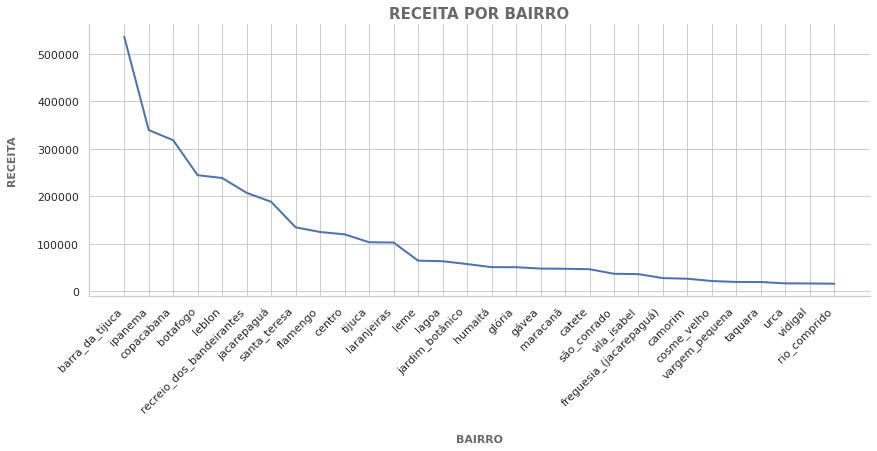

In [104]:
# Gráfico 30 maiores receitas por bairro

plt.figure(figsize=(14,5))
plt.plot(rbd[:30].bairro_ajustado, rbd[:30].preco, linewidth = '2')
sns.despine()
plt.title('RECEITA POR BAIRRO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('BAIRRO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.xticks(rotation=45, ha='right')
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [105]:
# Tipo de acomodações por bairro
pd.crosstab(df_t.bairro_ajustado, df_t.acomodacao, margins=True, margins_name="Total")

acomodacao,acomodacao_cama_e_cafe,apart_hotel,apartamento,apartamento_com_servico,bangalo,barco_hotel,cabana,casa,casa_de_hospedes,casa_germinada,casa_minuscula,casa_na_arvore,casa_particular_compartilhada,casa_terra,castelo,chale,choupana,condominio,cottage,hostel,hotel,hotel_boutique,iglu,ilha,loft,outros,pousada_natural,suite,veiculo_recreativo,vila,yurt,Total
bairro_ajustado,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
abolição,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
alto_da_boa_vista,0,0,5,0,0,0,0,15,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,23
anchieta,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
andaraí,0,0,44,0,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,1,0,1,0,56
anil,0,0,10,0,0,0,0,20,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,33
bancários,0,0,1,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
bangu,0,0,4,0,0,0,0,8,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,14
barra_da_tijuca,6,3,909,97,1,0,0,100,8,1,1,0,0,1,0,1,0,218,0,1,8,5,0,3,29,2,0,12,1,0,0,1407
barra_de_guaratiba,1,0,10,0,0,0,0,12,1,0,1,0,0,0,0,3,0,0,1,3,0,0,0,0,1,2,1,0,0,0,0,36


**ALGUMAS CONCLUSÕES:**

- Barra de Tijuca é o bairro que possui a maior quantidade de acomodações e a maior receita

# 4- Qual a faixa de preço mais popular e qual a que possui a maior receita?

Vamos definir as categorias para a faixa de preços da seguinte maneira:
 
barato - 0 a 200 reais
 
intermediário - 201 a 300 reais
 
caro - 301 a 500 reais
 
muito caro - 501 a 800 reais
 
elevado - maior que 801 reais.

In [106]:
# Criar uma categorização para os preços

lista_condicoes = [
    (df_t['preco'] > 0) & (df_t['preco'] <=200),
    (df_t['preco'] > 200) & (df_t['preco'] <=300),
    (df_t['preco'] > 300) & (df_t['preco'] <=500),
    (df_t['preco'] > 500) & (df_t['preco'] <=800),
    (df_t['preco'] > 800)]
lista_categorias = ['barato', 'intermediario', 'caro', 'muito_caro', 'elevado']
df_t['categoria_preco'] = np.select(lista_condicoes, lista_categorias, default='Not Specified')

In [107]:
# Breve descrição estatística das categorias de preços
df_t['categoria_preco'].describe().T

count      12326
unique         5
top       barato
freq        5408
Name: categoria_preco, dtype: object

In [108]:
# Categorias de preços mais frequentes
df_t['categoria_preco'].value_counts()

barato           5408
intermediario    2807
caro             2245
muito_caro       1012
elevado           854
Name: categoria_preco, dtype: int64

In [109]:
# Frequência das categorias de preços em termos de porcentagem
round(df_t['categoria_preco'].value_counts(normalize=True) * 100)

barato           44.0
intermediario    23.0
caro             18.0
muito_caro        8.0
elevado           7.0
Name: categoria_preco, dtype: float64

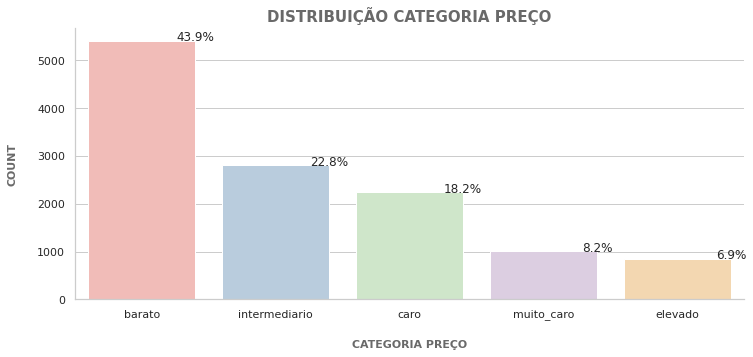

In [110]:
# Gráfico Distribuição Categoria preço
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='categoria_preco', data=df_t, palette='Pastel1', order = df_t['categoria_preco'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO CATEGORIA PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
plt.xlabel('CATEGORIA PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [111]:
# Resumo estatístico do preço para cada categoria
df_t.groupby('categoria_preco')['preco'].describe().round(2).T

categoria_preco,barato,caro,elevado,intermediario,muito_caro
count,5408.00,2245.00,854.00,2807.00,1012.00
mean,116.49,407.23,923.86,246.20,630.10
std,41.65,59.91,94.21,36.54,73.28
min,29.00,302.00,802.00,201.00,504.00
25%,80.00,348.00,840.00,206.00,588.00
50%,113.00,399.00,926.00,252.00,600.00
75%,151.00,449.00,999.00,281.00,701.00
max,197.00,500.00,1134.00,298.00,800.00


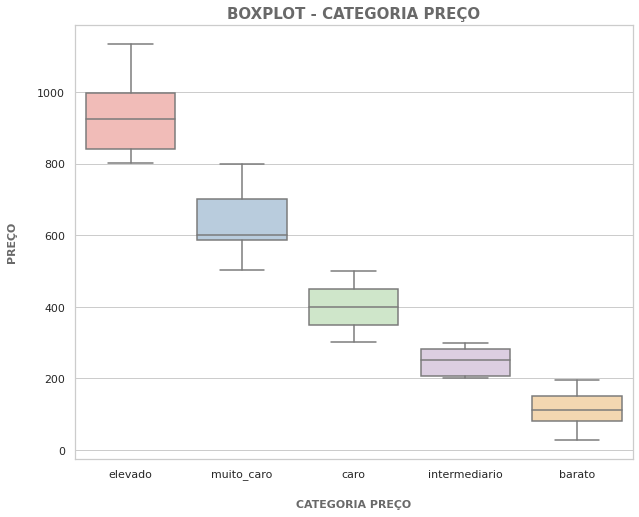

In [112]:
# Boxplot Categoria preço

# Plot
plt.figure(figsize = (10,8))
sns.boxplot(data=df_t, x='categoria_preco', y='preco', palette = 'Pastel1', order = df_t.groupby(["categoria_preco"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - CATEGORIA PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CATEGORIA PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();


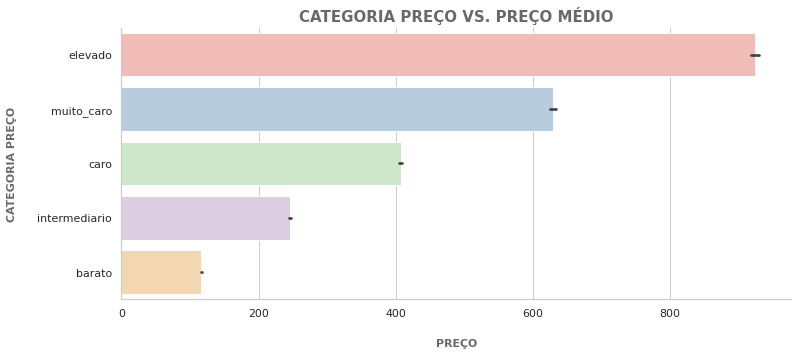

In [113]:
# Gráfico preço médio por categória de preços

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'categoria_preco', orient = "h", data=df_t, palette = 'Pastel1', order = df_t.groupby(["categoria_preco"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('CATEGORIA PREÇO VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('CATEGORIA PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [114]:
# Receita pela categoria de preço
df_t.groupby(['categoria_preco'])['preco'].sum().sort_values(ascending=False)

categoria_preco
caro             914235.0
elevado          788976.0
intermediario    691082.0
muito_caro       637660.0
barato           629956.0
Name: preco, dtype: float64

In [115]:
# Tabela analítica por categoria de preco
rcp = df_t.groupby(by=['categoria_preco']).sum()['preco'].reset_index() # receita por categoria de preço(rcp)
rcp.head()

,categoria_preco,preco
0,barato,629956.0
1,caro,914235.0
2,elevado,788976.0
3,intermediario,691082.0
4,muito_caro,637660.0


In [116]:
# Tabela analítica receita por categoria de preco em ordem decrescente
rcpd = rcp.sort_values('preco', ascending=False) # receita por categoria de preço em ordem decrescente(rcpd)
rcpd.head()

,categoria_preco,preco
1,caro,914235.0
2,elevado,788976.0
3,intermediario,691082.0
4,muito_caro,637660.0
0,barato,629956.0


<Figure size 720x720 with 0 Axes>

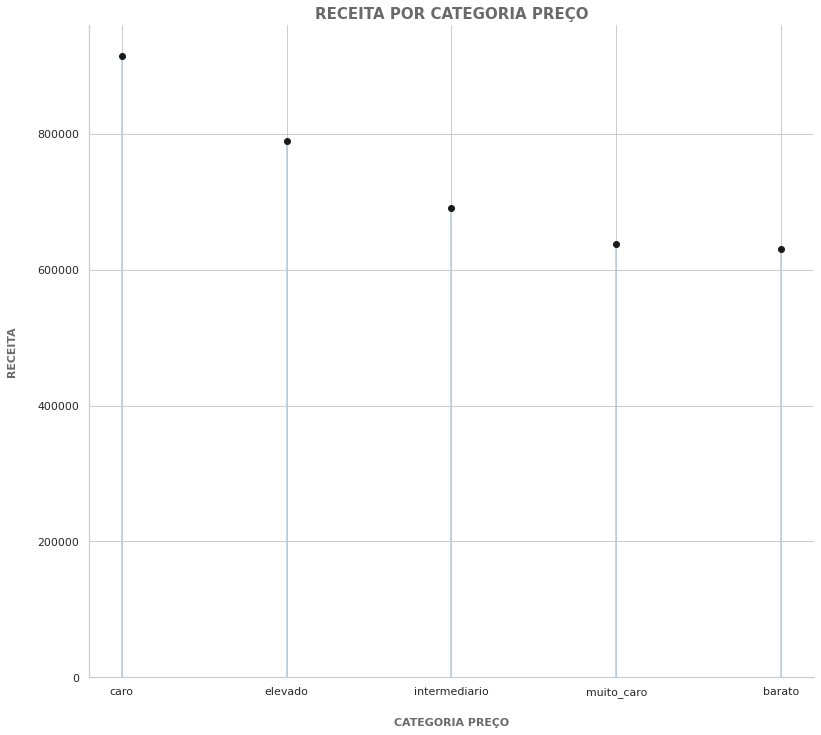

In [117]:
# Gráfico faturamento total por categoria preço

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rcpd['categoria_preco'], ymin=0, ymax=rcpd['preco'], color='#b3cde3')
  
axes.plot(rcpd['categoria_preco'], rcpd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR CATEGORIA PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CATEGORIA PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

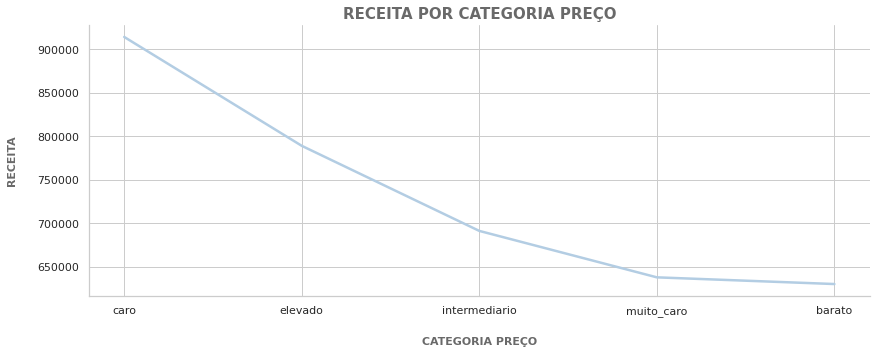

In [118]:
# Gráfico receita por categoria de preço
plt.figure(figsize=(14,5))
plt.plot(rcpd['categoria_preco'], rcpd['preco'], color='#b3cde3', linewidth = '2.5')
sns.despine()
plt.title('RECEITA POR CATEGORIA PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CATEGORIA PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [119]:
# Tipo de acomodação por categoria preço
pd.crosstab(df_t.acomodacao, df_t.categoria_preco, margins=True, margins_name="Total")

categoria_preco,barato,caro,elevado,intermediario,muito_caro,Total
acomodacao,,,,,,
acomodacao_cama_e_cafe,38,10,0,15,2,65
apart_hotel,2,4,1,4,1,12
apartamento,3692,1693,719,2119,826,9049
apartamento_com_servico,83,67,12,77,17,256
bangalo,2,2,1,1,0,6
barco_hotel,0,0,0,1,0,1
cabana,1,0,1,1,0,3
casa,855,199,61,263,77,1455
casa_de_hospedes,39,7,0,8,3,57


In [120]:
# Bairro por categoria preço
pd.crosstab(df_t.bairro_ajustado, df_t.categoria_preco, margins=True, margins_name="Total")

categoria_preco,barato,caro,elevado,intermediario,muito_caro,Total
bairro_ajustado,,,,,,
abolição,1,0,0,1,0,2
alto_da_boa_vista,9,5,1,6,2,23
anchieta,3,0,0,0,0,3
andaraí,39,6,2,3,6,56
anil,20,4,2,6,1,33
bancários,3,0,0,1,0,4
bangu,10,0,1,2,1,14
barra_da_tijuca,334,340,157,410,166,1407
barra_de_guaratiba,16,3,0,12,5,36


**ALGUMAS CONCLUSÕES:**

- Embora a quantidade de acomodações com a faixa de preço em barato seja a mais popular, é a que têm a menor receita
- A faixa de preço caro é a que possui maior receita total


# 5- Superhosts, Hosts verificados e Hosts com maior quantidade de anúncios possuem maior valor total faturado?

Coluna "superhost"

In [121]:
# Breve resumo estatístico da coluna 'superhost'
df_t['superhost'].describe().T

count     12326
unique        2
top           f
freq      11645
Name: superhost, dtype: object

In [122]:
# Frequência de superhost
df_t['superhost'].value_counts()

f    11645
t      681
Name: superhost, dtype: int64

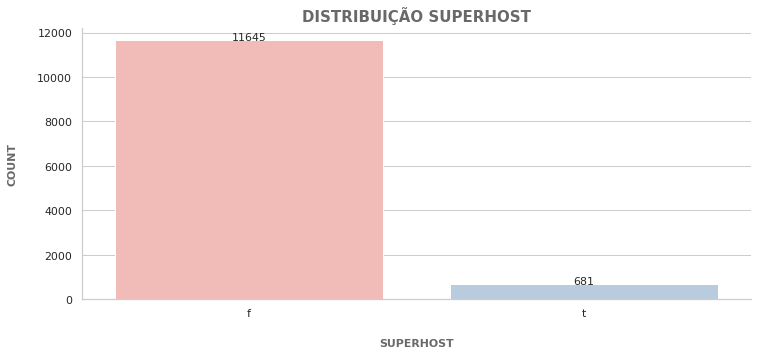

In [123]:
# Gráfico Distribuição Superhost
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

ax = sns.countplot(x='superhost', data=df_t, palette='Pastel1', order = df_t['superhost'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO SUPERHOST', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    ax.text (p.get_x() + p.get_width()  / 2, p.get_height()+ 0.75, p.get_height(), horizontalalignment='center', fontsize = 11)
plt.xlabel('SUPERHOST', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [124]:
# Frequência de superhost em termos de porcentagem
round(df_t['superhost'].value_counts(normalize=True) * 100)

f    94.0
t     6.0
Name: superhost, dtype: float64

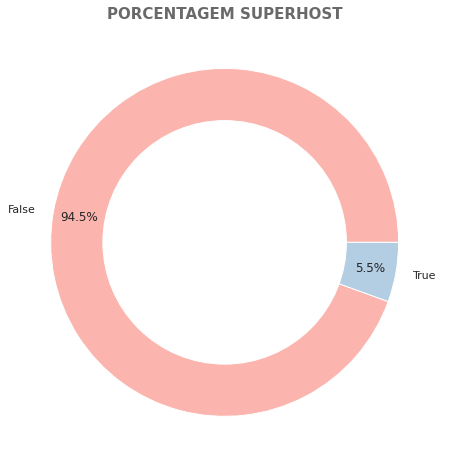

In [125]:
# Distribuição superhost em termos de porcentagem

plt.figure(figsize=(8,8))
# Rótulos para legenda
Legendas = ['False', 'True']
  
# Valores
valores = df_t['superhost'].value_counts()
  
# Configurando o gráfico
plt.pie(valores, colors=['#fbb4ae', '#b3cde3'], labels=Legendas,
        autopct='%1.1f%%', pctdistance=0.85,)
  
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
fig.gca().add_artist(centre_circle)
  
plt.title('PORCENTAGEM SUPERHOST', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show()

In [126]:
# Descrição estatística do preço por superhost
df_t.groupby('superhost')['preco'].describe().round(2).T

superhost,f,t
count,11645.00,681.00
mean,302.01,212.89
std,239.51,170.40
min,29.00,42.00
25%,126.00,101.00
50%,214.00,160.00
75%,399.00,252.00
max,1134.00,1100.00


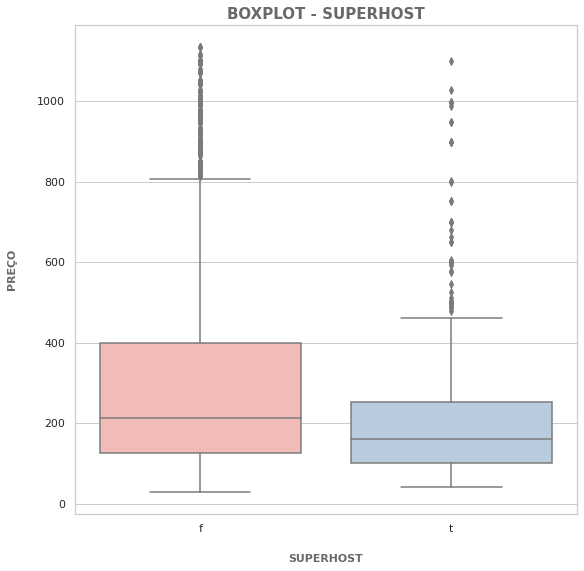

In [127]:
# Boxplot Superhost

# Plot
plt.figure(figsize = (9,9))
sns.boxplot(data=df_t, x='superhost', y='preco', palette='Pastel1', order = df_t.groupby(["superhost"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - SUPERHOST', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('SUPERHOST', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();


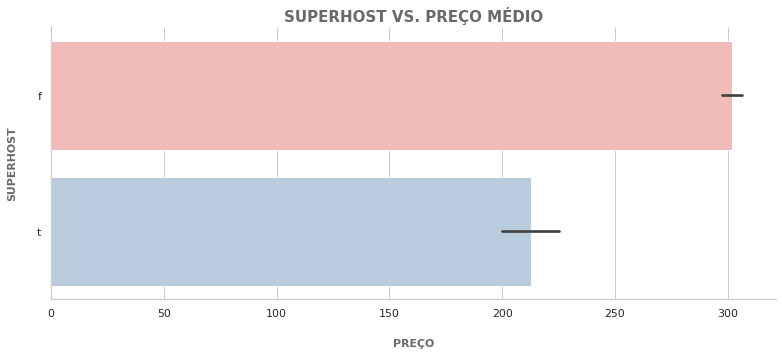

In [128]:
# Gráfico preço médio por Superhost

# Plot
plt.figure(figsize = (13,5))

sns.barplot(x = 'preco', y = 'superhost', orient = "h", data=df_t, palette = 'Pastel1', order = df_t.groupby(["superhost"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('SUPERHOST VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('SUPERHOST', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();


In [129]:
# Tabela analítica receita por superhost
rs = df_t.groupby(by=['superhost']).sum()['preco'].reset_index() # receita por superhost(rs)
rs.head()

,superhost,preco
0,f,3516931.0
1,t,144978.0


In [130]:
# Tabela analítica receita por superhost em ordem decrescente
rsd = rs.sort_values('preco', ascending=False) # receita por superhost em ordem decrescente(rsd)
rsd.head()

,superhost,preco
0,f,3516931.0
1,t,144978.0


<Figure size 1080x936 with 0 Axes>

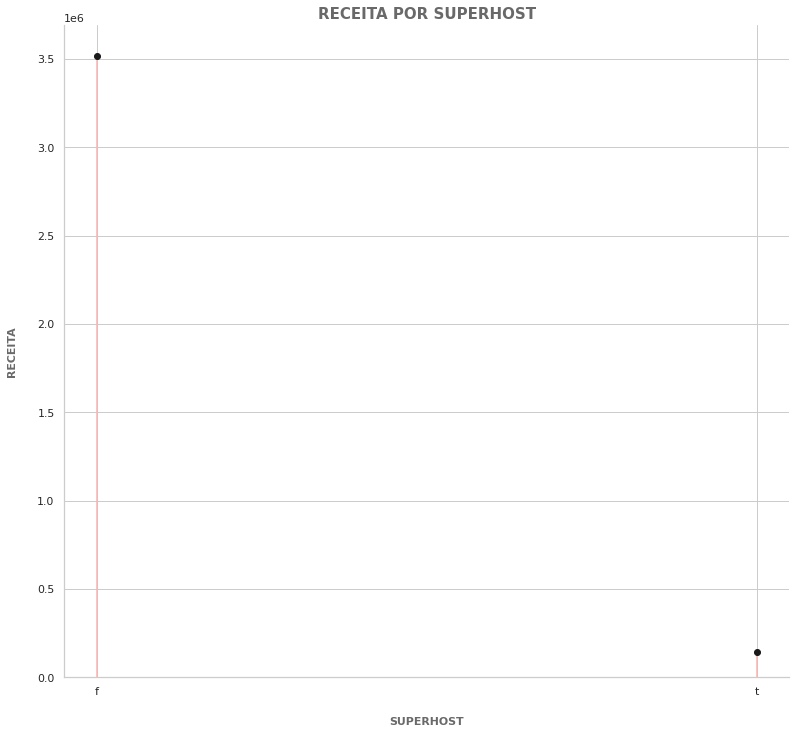

In [131]:
# Gráfico faturamento total por Superhost

sns.set(style="whitegrid")
plt.figure(figsize=(15,13))

fig, axes = plt.subplots()
axes.vlines(rsd['superhost'], ymin=0, ymax=rsd['preco'], color='#fbb4ae')
  
axes.plot(rsd['superhost'], rsd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR SUPERHOST', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('SUPERHOST', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

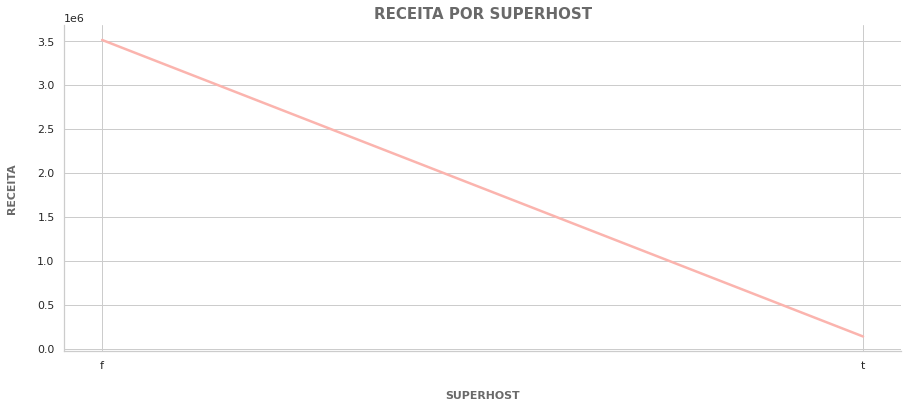

In [132]:
# Gráfico superhost por preço
plt.figure(figsize=(15,6))
plt.plot(rsd['superhost'], rsd['preco'], color='#fbb4ae', linewidth = '2.5')
sns.despine()
plt.title('RECEITA POR SUPERHOST', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('SUPERHOST', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

-  A quantidade de Superhosts é muito pequena, o que pode indicar que Superhost não seja um atributo tão simples de se conquistar. Assim, em razão da parcela diminuta de Superhosts, a receita total com esta característica também tende a ser menor 

Coluna "host_verificado"

In [133]:
# Breve resumo estatístico da coluna 'host_verificado'
df_t['host_verificado'].describe().T

count     12326
unique        2
top           f
freq       9590
Name: host_verificado, dtype: object

In [134]:
# Frequência host verificado
df_t['host_verificado'].value_counts()

f    9590
t    2736
Name: host_verificado, dtype: int64

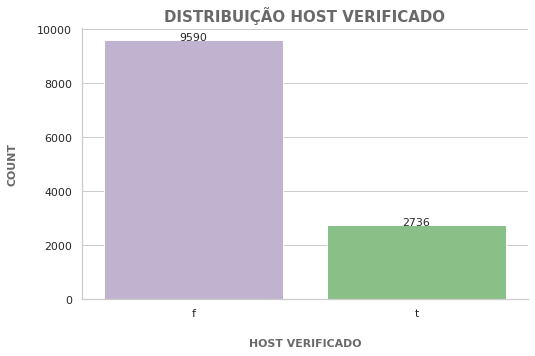

In [135]:
# Gráfico Distribuição Host verificado
sns.set(style="whitegrid")
plt.figure(figsize=(8,5))

cores_hf = ['#beaed4', '#7fc97f']
sns.set_palette(sns.color_palette(cores_hf))
ax = sns.countplot(x='host_verificado', data=df_t,order = df_t['host_verificado'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO HOST VERIFICADO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    ax.text (p.get_x() + p.get_width()  / 2, p.get_height()+ 0.75, p.get_height(), horizontalalignment='center', fontsize = 11)
plt.xlabel('HOST VERIFICADO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [136]:
# Frequência host verificado em termos de porcentagem
round(df_t['host_verificado'].value_counts(normalize=True) * 100)

f    78.0
t    22.0
Name: host_verificado, dtype: float64

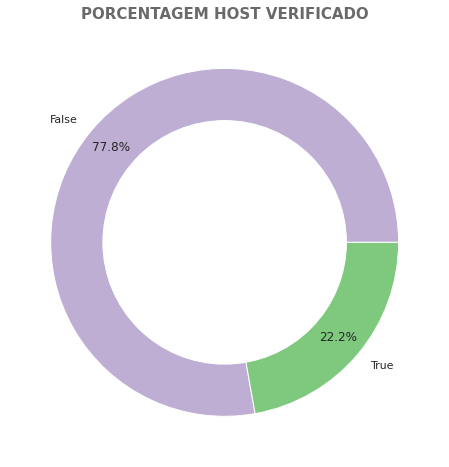

In [137]:
# Distribuição Host verificado em termos de porcentagem

plt.figure(figsize=(8,8))
# Rótulos para legenda
Legendas = ['False', 'True']
  
# Valores
valores = df_t['host_verificado'].value_counts()
  
# Configurando o gráfico
plt.pie(valores, colors=['#beaed4', '#7fc97f'], labels=Legendas,
        autopct='%1.1f%%', pctdistance=0.85,)
  
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
fig.gca().add_artist(centre_circle)
  
plt.title('PORCENTAGEM HOST VERIFICADO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show()

In [138]:
# Descrição estatística do preço por host verificados
df_t.groupby('host_verificado')['preco'].describe().round(2).T

host_verificado,f,t
count,9590.00,2736.00
mean,300.81,284.04
std,242.04,218.37
min,29.00,34.00
25%,122.00,126.00
50%,210.00,210.00
75%,399.00,374.00
max,1134.00,1117.00


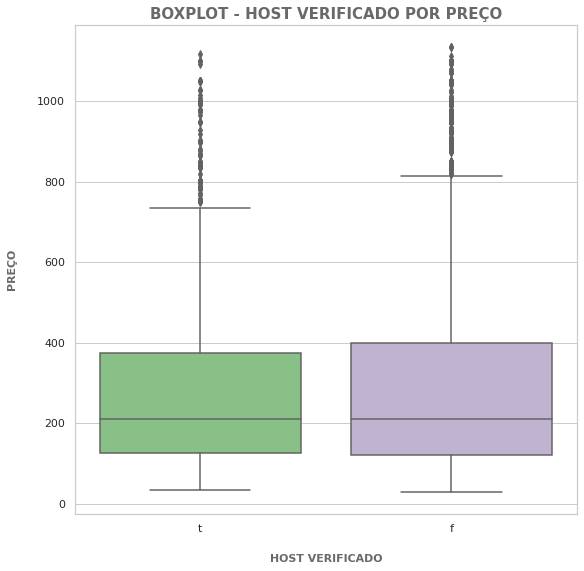

In [139]:
# Boxplot Host verificado

# Plot
plt.figure(figsize = (9,9))

sns.boxplot(data=df_t, x='host_verificado', y='preco', palette='Accent', order = df_t.groupby(["host_verificado"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - HOST VERIFICADO POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST VERIFICADO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();


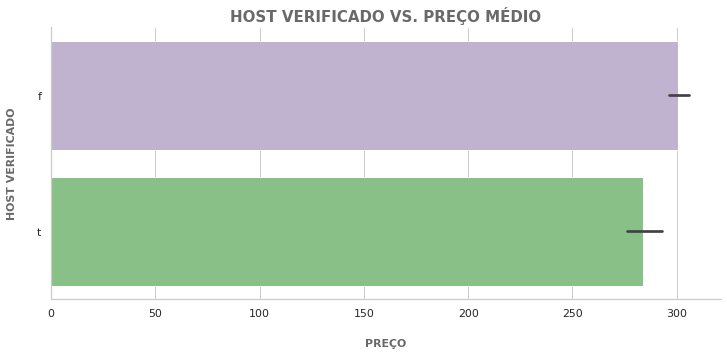

In [140]:
# Gráfico preço médio por Host verificado

# Plot
plt.figure(figsize = (12,5))

cores_hf = ['#beaed4', '#7fc97f']
sns.set_palette(sns.color_palette(cores_hf))
sns.barplot(x = 'preco', y = 'host_verificado', orient = "h", data=df_t, order = df_t.groupby(["host_verificado"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('HOST VERIFICADO VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('HOST VERIFICADO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();


In [141]:
# Tabela analítica receita host verificado
rhv = df_t.groupby(by=['host_verificado']).sum()['preco'].reset_index() #receita por host verificado(rhv) 
rhv.head()

,host_verificado,preco
0,f,2884767.0
1,t,777142.0


In [142]:
# Tabela analítica receita host verificado em ordem decrescente
rhvd = rhv.sort_values('preco', ascending=False) # #receita por host verificado em ordem decrescente(rhvd)
rhvd.head()

,host_verificado,preco
0,f,2884767.0
1,t,777142.0


<Figure size 504x360 with 0 Axes>

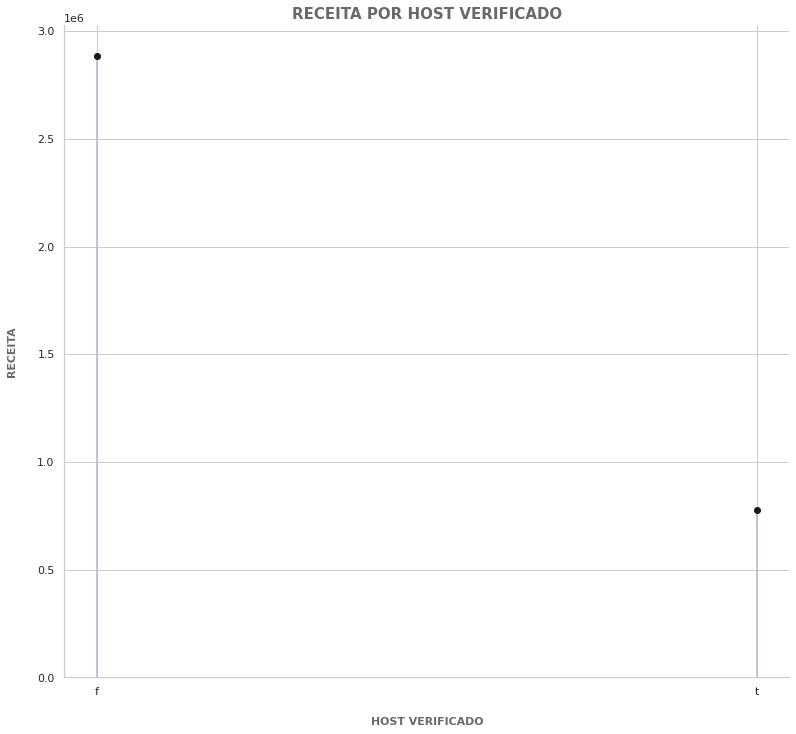

In [143]:
# Gráfico receita total por Host verificado

sns.set(style="whitegrid")
plt.figure(figsize=(7,5))

fig, axes = plt.subplots()
axes.vlines(rhvd['host_verificado'], ymin=0, ymax=rhvd['preco'], color='#beaed4')
  
axes.plot(rhvd['host_verificado'], rhvd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR HOST VERIFICADO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST VERIFICADO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

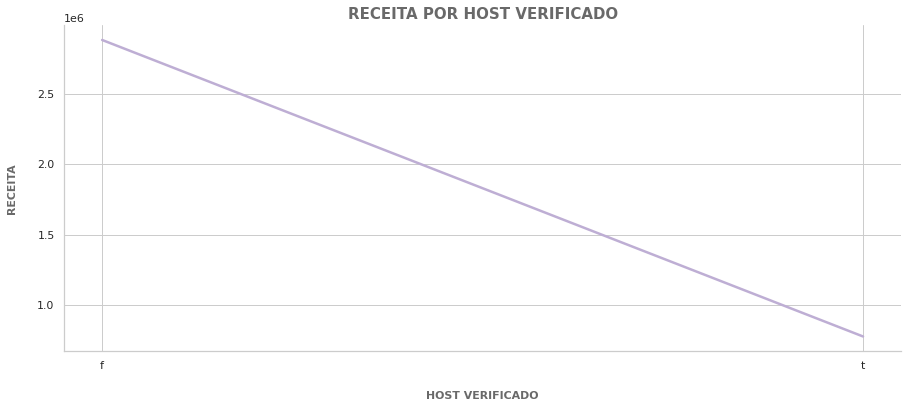

In [144]:
# Gráfico host_verificado pelo preço
plt.figure(figsize=(15,6))
plt.plot(rhvd['host_verificado'], rhvd['preco'], color='#beaed4', linewidth = '2.5')
sns.despine()
plt.title('RECEITA POR HOST VERIFICADO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST VERIFICADO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Existe uma maior quantidade de hosts que não possuem verificação do que hosts com verificação

- A receita total de hosts não verificados é bem maior

- A diferença entre a média dos preços de hosts verificados e não verificados não é significativa

Coluna "host_anuncios"

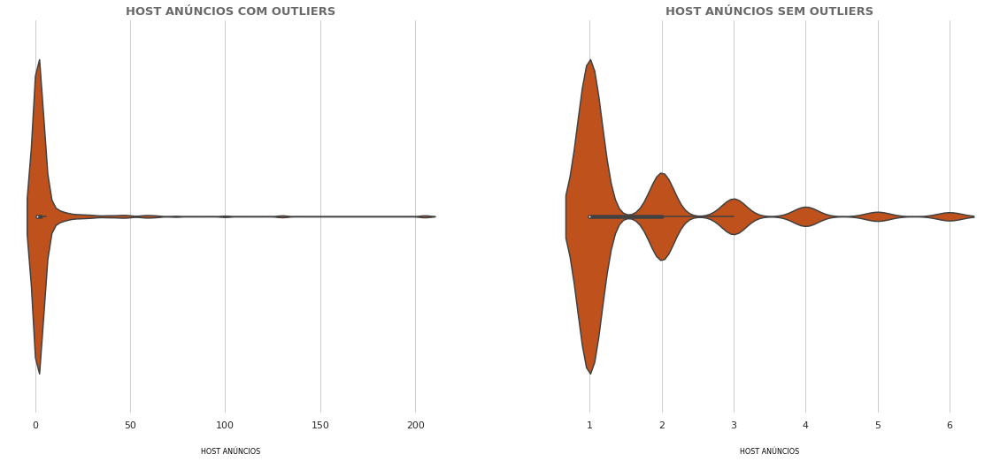

In [145]:
# Gráfico comparação 'host_anuncios' antes e depois da remoção dos outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['host_anuncios'], data=df_l, color = '#d94701')


plt.title('HOST ANÚNCIOS COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('HOST ANÚNCIOS', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['host_anuncios'], data=df_t, color = '#d94701')


plt.title('HOST ANÚNCIOS SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('HOST ANÚNCIOS', color = 'black', labelpad = 20, fontsize = 8);

In [146]:
# Breve resumo estatístico da coluna 'host_anuncios'
df_t['host_anuncios'].describe().T

count    12326.000000
mean         1.622505
std          1.100931
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          6.000000
Name: host_anuncios, dtype: float64

In [147]:
# Frequẽncia anúncios host
df_t['host_anuncios'].value_counts()

1    8164
2    2277
3     928
4     503
5     239
6     215
Name: host_anuncios, dtype: int64

In [148]:
# Frequência anúncios host em termos de porcentagem
round(df_t['host_anuncios'].value_counts(normalize=True) * 100)

1    66.0
2    18.0
3     8.0
4     4.0
5     2.0
6     2.0
Name: host_anuncios, dtype: float64

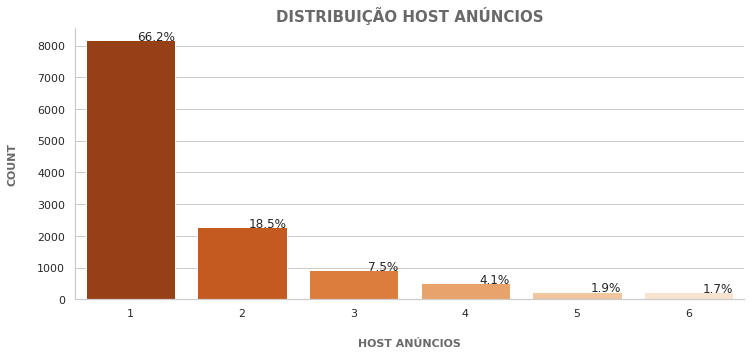

In [149]:
# Gráfico Distribuição Host Anúncios
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='host_anuncios', data=df_t, palette='Oranges_r', order = df_t['host_anuncios'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO HOST ANÚNCIOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

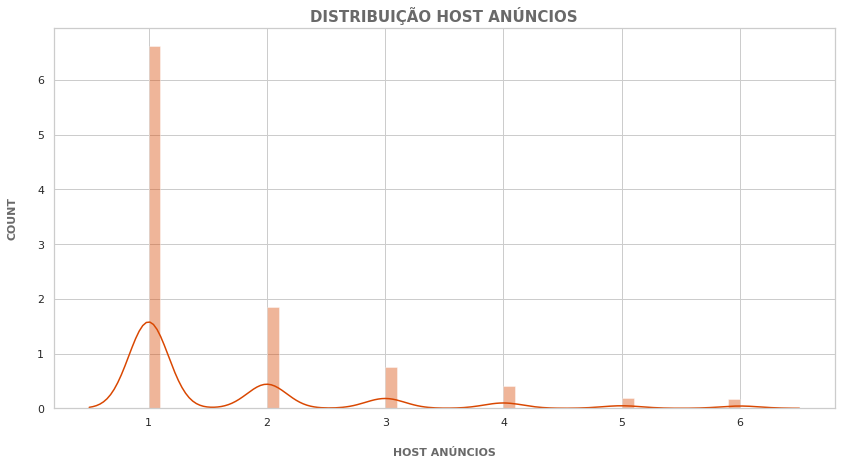

In [150]:
# Histograma anúncios host
sns.set(style='whitegrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['host_anuncios'], color='#d94701')
plt.title('DISTRIBUIÇÃO HOST ANÚNCIOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [151]:
# Resumo estatístico do preço por host anúncios
df_t.groupby('host_anuncios')['preco'].describe().round(2).T

host_anuncios,1,2,3,4,5,6
count,8164.00,2277.00,928.00,503.00,239.00,215.00
mean,321.74,259.12,230.27,241.15,219.72,268.33
std,247.26,215.46,191.17,200.28,183.32,221.48
min,29.00,38.00,38.00,42.00,42.00,38.00
25%,139.00,109.00,101.00,118.00,84.00,111.00
50%,252.00,189.00,180.00,181.00,160.00,202.00
75%,420.00,319.00,298.00,298.00,298.00,342.00
max,1134.00,1134.00,1050.00,1134.00,999.00,1029.00


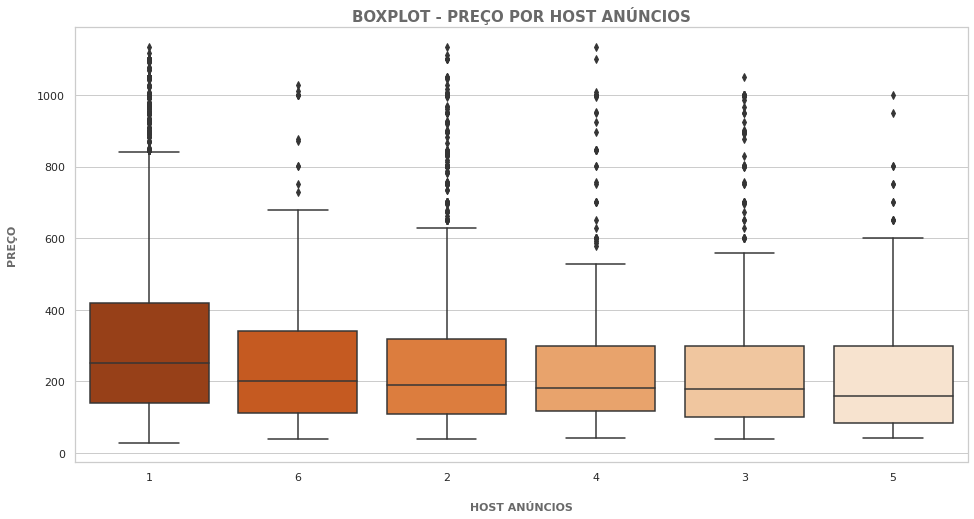

In [152]:
# Boxplot preço por quantidade de anúncios

# Plot
plt.figure(figsize = (16,8))
sns.boxplot(data=df_t, x='host_anuncios', y='preco', palette='Oranges_r', order = df_t.groupby(["host_anuncios"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - PREÇO POR HOST ANÚNCIOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [153]:
# Média de preço por anúncios host
df_t.groupby(['host_anuncios'])['preco'].mean().round(2).sort_values(ascending=False)

host_anuncios
1    321.74
6    268.33
2    259.12
4    241.15
3    230.27
5    219.72
Name: preco, dtype: float64

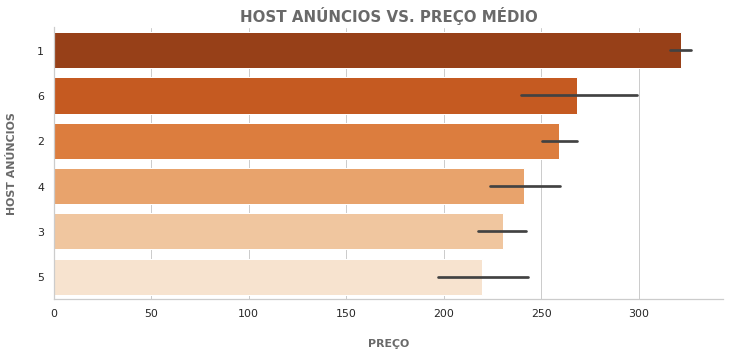

In [154]:
# Gráfico preço médio por Anúncios Host

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'host_anuncios', orient = "h", data=df_t, palette='Oranges_r', order = df_t.groupby(["host_anuncios"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('HOST ANÚNCIOS VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [155]:
# Correlação entre anúncios host e preço
df_t['host_anuncios'].corr(df_t['preco']).round(2)

-0.12

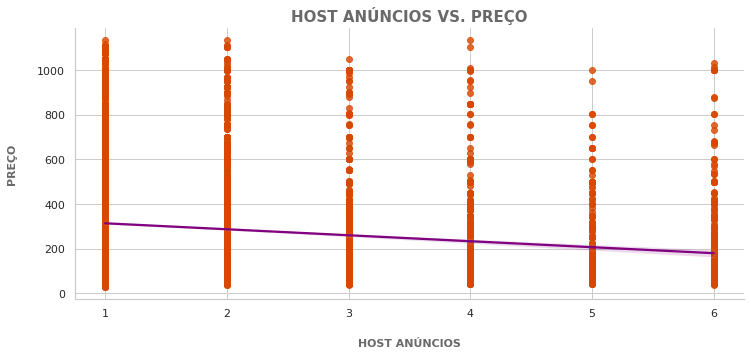

In [156]:
# Gráfico Host Anúncios vc. Preço

plt.figure(figsize=(12,5))
sns.regplot(x="host_anuncios", y="preco", data=df_t, scatter_kws = {'color': '#d94701'}, line_kws = {'color': 'purple'})
sns.despine()
plt.title('HOST ANÚNCIOS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [157]:
# Tabela analítica receita por anúncios host
rha = df_t.groupby(by=['host_anuncios']).sum()['preco'].reset_index() # receita por host anúncios(rha)
rha.head()

,host_anuncios,preco
0,1,2626699.0
1,2,590018.0
2,3,213690.0
3,4,121300.0
4,5,52512.0


In [158]:
# Tabela analítica receita por anúncios host em ordem decrescente
rhad = rha.sort_values('preco', ascending=False) # receita por host anúncios em ordem decrescen(rhad)
rhad.head()

,host_anuncios,preco
0,1,2626699.0
1,2,590018.0
2,3,213690.0
3,4,121300.0
5,6,57690.0


<Figure size 720x720 with 0 Axes>

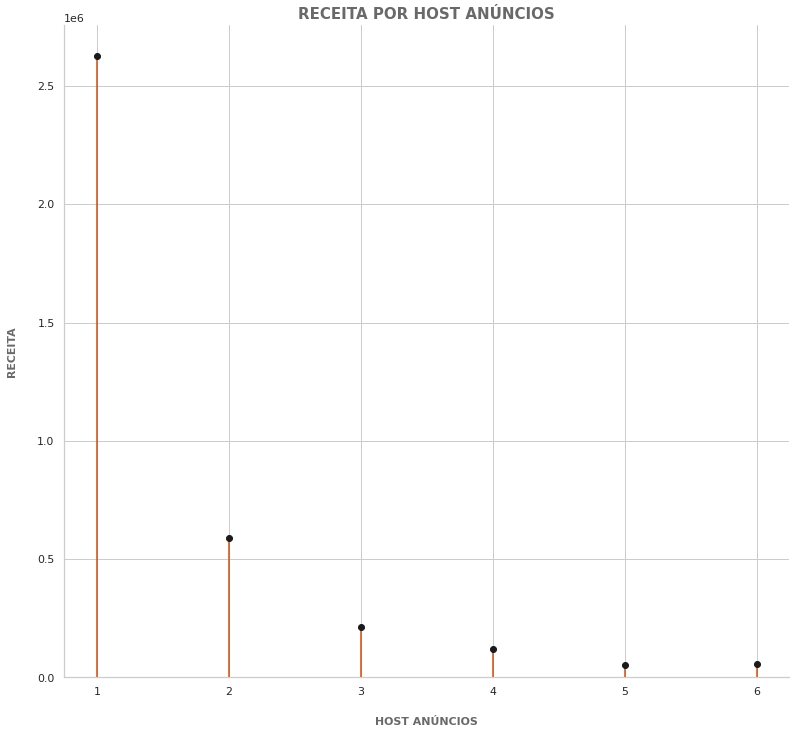

In [159]:
# Gráfico receita total por anúncios host

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rhad['host_anuncios'], ymin=0, ymax=rhad['preco'], color='#d94701')
  
axes.plot(rhad['host_anuncios'], rhad['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR HOST ANÚNCIOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

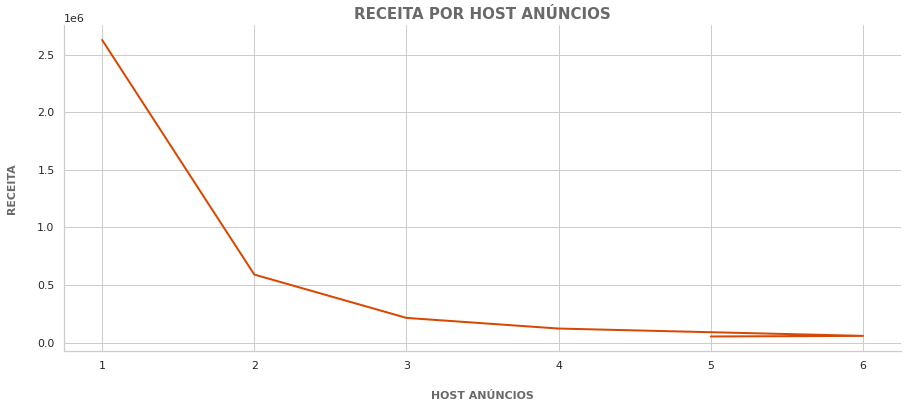

In [160]:
# Gráfico receita total por anúncios host
plt.figure(figsize=(15,6))
plt.plot(rhad['host_anuncios'], rhad['preco'], color='#d94701', linewidth = '2')
sns.despine()
plt.title('RECEITA POR HOST ANÚNCIOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('HOST ANÚNCIOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Mais da metade dos Hosts possuem apenas um anúncio

- Surpreendentemente Hosts com menor quantidade de anúncios dispõem de maior receita. Logo, ao que tudo indica, uma maior quantidade de anúncios não gera impacto significativo sobre a receita total

# 6- Qual o comportamento do preço pela quantidade de banheiros, quartos, camas e por tipos diferentes de quartos e camas?

Coluna "banheiros"

**OBS:** 0.5 banheiro representa um banheiro somente com vaso sanitário e uma pia, mas sem chuveiro ou banheira. Por exemplo, 1.5 retrata um banheiro completo e um banheiro com apenas vaso sanitário e pia. Assim sendo com os demais valores.

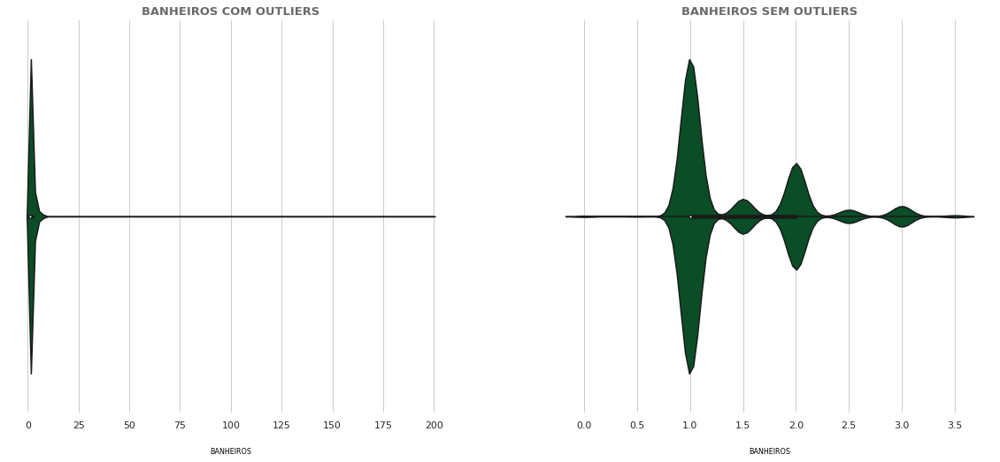

In [161]:
# Gráfico compração entre a quantidade de banheiros antes e depois da remoção de outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['banheiros'], data=df_l, color='#005824')


plt.title('BANHEIROS COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('BANHEIROS', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['banheiros'], data=df_t, color='#005824')


plt.title('BANHEIROS SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('BANHEIROS', color = 'black', labelpad = 20, fontsize = 8);

In [162]:
# Breve resumo estatístico quantidade de banheiros
df_t['banheiros'].describe().T

count    12326.000000
mean         1.382119
std          0.586924
min          0.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          3.500000
Name: banheiros, dtype: float64

In [163]:
# Frequência quantidade de banheiros
df_t['banheiros'].value_counts()

1.0    7860
2.0    2652
1.5     867
3.0     514
2.5     333
3.5      54
0.0      30
0.5      16
Name: banheiros, dtype: int64

In [164]:
# Frequência quantidade de banheiros em termos de porcentagem
round(df_t['banheiros'].value_counts(normalize=True) * 100)

1.0    64.0
2.0    22.0
1.5     7.0
3.0     4.0
2.5     3.0
3.5     0.0
0.0     0.0
0.5     0.0
Name: banheiros, dtype: float64

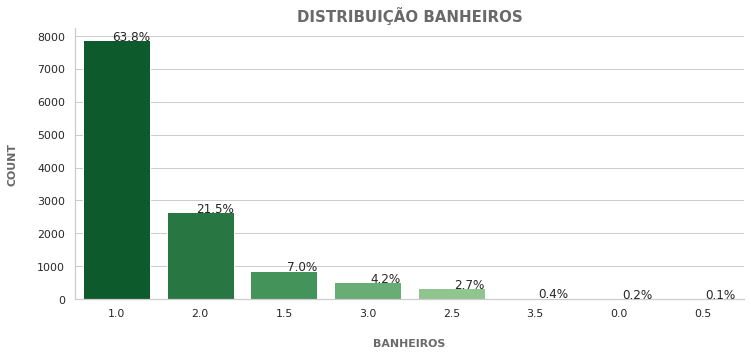

In [165]:
# Gráfico Distribuição banheiros
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='banheiros', data=df_t, palette='Greens_r', order = df_t['banheiros'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO BANHEIROS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

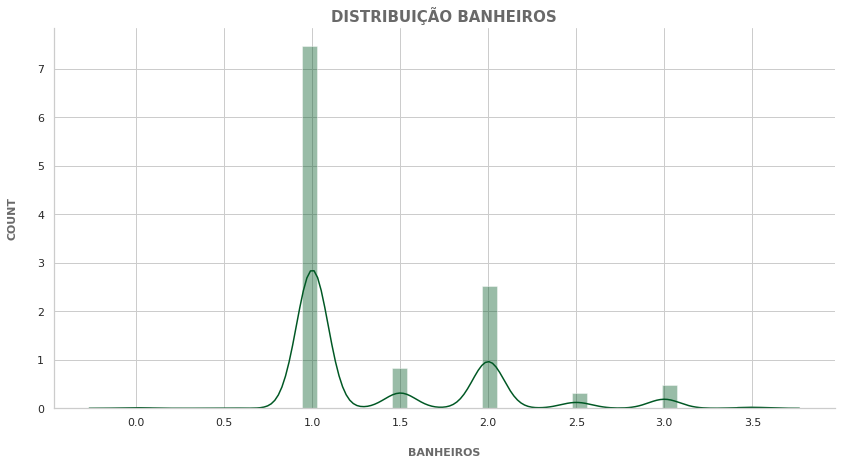

In [166]:
# Distribuição dos banheiros
sns.set(style='whitegrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['banheiros'], color='#005824')
sns.despine()
plt.title('DISTRIBUIÇÃO BANHEIROS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [167]:
# Descrição estatística do preço por banheiros
df_t.groupby('banheiros')['preco'].describe().round(2).T

banheiros,0.0,0.5,1.0,1.5,2.0,2.5,3.0,3.5
count,30.00,16.00,7860.00,867.00,2652.00,333.00,514.00,54.00
mean,236.03,278.19,249.11,269.96,390.42,449.80,473.54,551.09
std,196.45,291.10,199.67,217.40,268.94,277.03,295.26,307.01
min,46.00,59.00,29.00,34.00,29.00,42.00,42.00,50.00
25%,101.00,108.00,109.00,105.00,181.00,239.00,218.00,317.25
50%,170.00,183.00,189.00,202.00,302.00,399.00,420.00,506.00
75%,346.50,300.75,298.00,363.00,550.00,621.00,657.00,802.00
max,840.00,1050.00,1134.00,1100.00,1117.00,1100.00,1134.00,1100.00


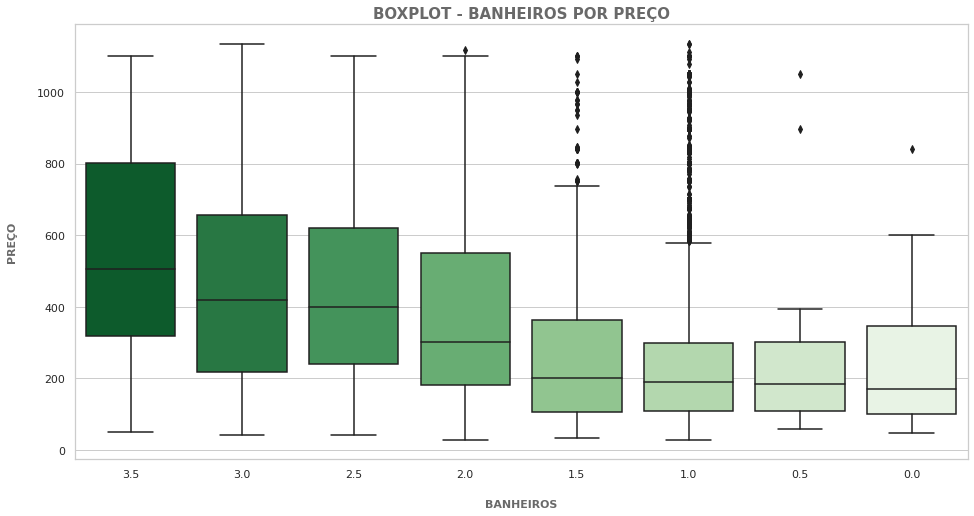

In [168]:
# Boxplot preço por quantidade de banheiros

# Plot
plt.figure(figsize = (16,8))
sns.boxplot(data=df_t, x='banheiros', y='preco', palette='Greens_r', order = df_t.groupby(["banheiros"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - BANHEIROS POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [169]:
# Média de preço por banheiros
df_t.groupby(['banheiros'])['preco'].mean().round(2).sort_values(ascending=False)

banheiros
3.5    551.09
3.0    473.54
2.5    449.80
2.0    390.42
0.5    278.19
1.5    269.96
1.0    249.11
0.0    236.03
Name: preco, dtype: float64

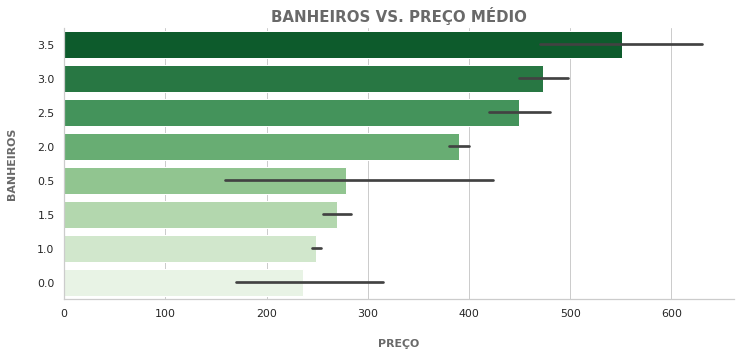

In [170]:
# Gráfico preço médio por Banheiros

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'banheiros', orient = "h", data=df_t, palette='Greens_r', order = df_t.groupby(["banheiros"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('BANHEIROS VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [171]:
# Correlação entre a quantidade de banheiros e preço
df_t['banheiros'].corr(df_t['preco']).round(2)

0.31

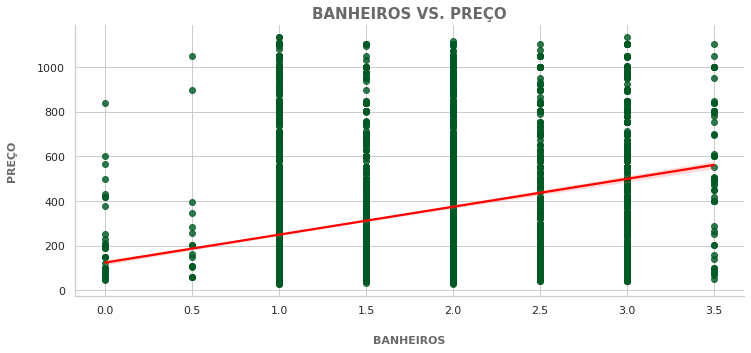

In [172]:
# Gráfico banheiros vs. preço

plt.figure(figsize=(12,5))
sns.regplot(x="banheiros", y="preco", data=df_t, scatter_kws = {'color': '#005824'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('BANHEIROS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [173]:
# Tabela analítica receita banheiros
rqb = df_t.groupby(by=['banheiros']).sum()['preco'].reset_index() # receita por quantidade de banheiros(rqb)
rqb.head()

,banheiros,preco
0,0.0,7081.0
1,0.5,4451.0
2,1.0,1957983.0
3,1.5,234053.0
4,2.0,1035399.0


In [174]:
# Tabela analítica receita banheiros em ordem decrescente
rqbd = rqb.sort_values('preco', ascending=False) # receita por quantidade de banheiros em ordem decrescente(rqbd)
rqbd.head()

,banheiros,preco
2,1.0,1957983.0
4,2.0,1035399.0
6,3.0,243398.0
3,1.5,234053.0
5,2.5,149785.0


<Figure size 720x720 with 0 Axes>

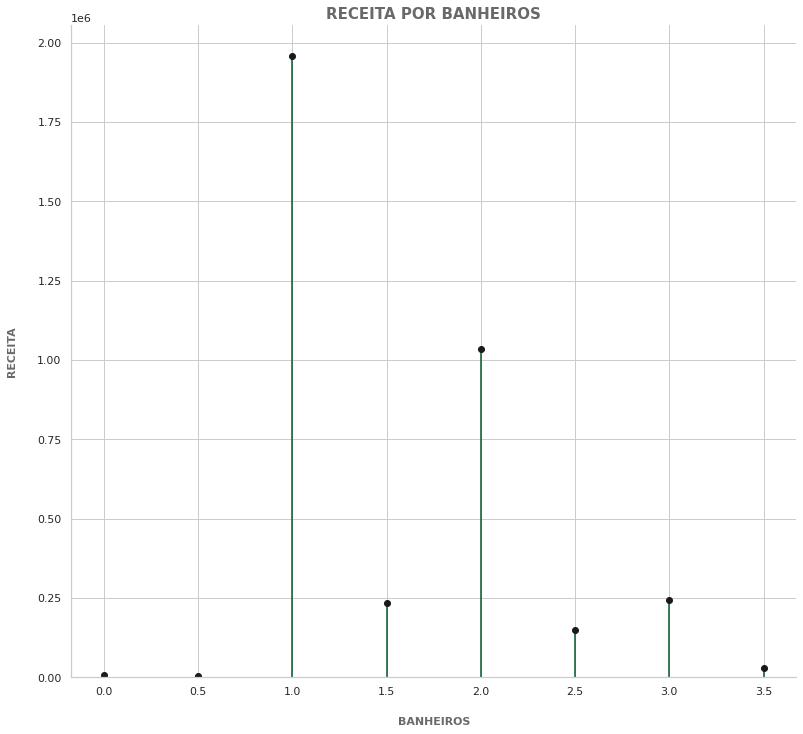

In [175]:
# Gráfico receita total por Banheiros

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rqbd['banheiros'], ymin=0, ymax=rqbd['preco'], color='#005824')
  
axes.plot(rqbd['banheiros'], rqbd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR BANHEIROS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

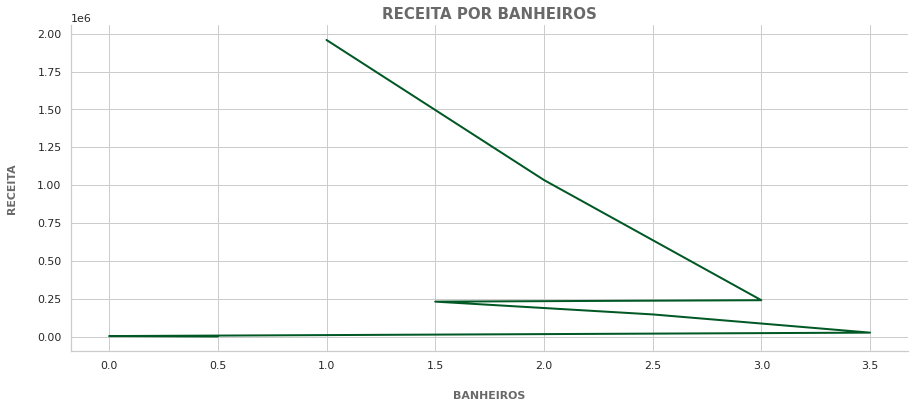

In [176]:
# Gráfico receita total por quantidade de banheiro
plt.figure(figsize=(15,6))
plt.plot(rqbd['banheiros'], rqbd['preco'], color='#005824', linewidth = '2')
sns.despine()
plt.title('RECEITA POR BANHEIROS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('BANHEIROS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Acomodações com somente um banheiro são as mais frequentes e com maior arrecadamento
- O preço médio tende a aumentar à medida em que o número de banheiros aumenta
- Não foi possível identificar um motivo plausível do porque algumas acomodações têm a quantidade de banheiros iguais a zero

Coluna "quartos"

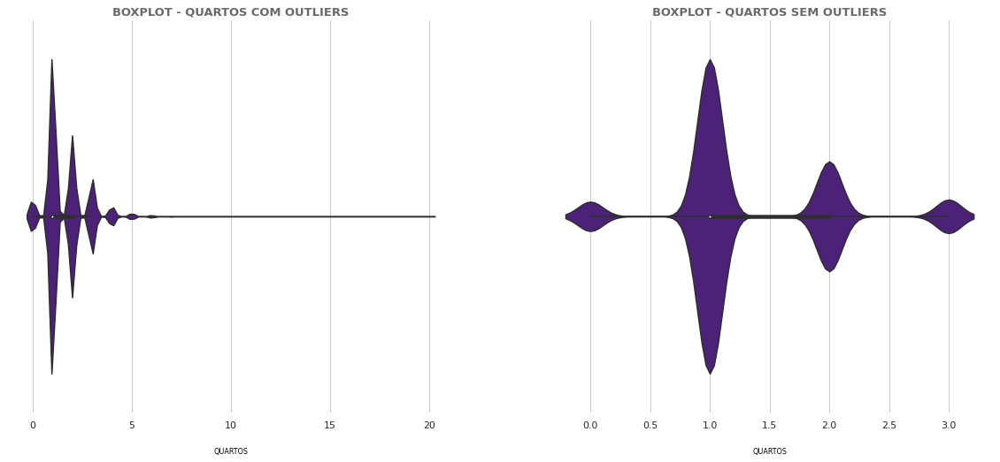

In [177]:
# Gráfico quantidade de quartos antes e depois da remoção de outliers 

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['quartos'], data=df_l, color='#4a1486')


plt.title('BOXPLOT - QUARTOS COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('QUARTOS', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['quartos'], data=df_t, color='#4a1486')


plt.title('BOXPLOT - QUARTOS SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('QUARTOS', color = 'black', labelpad = 20, fontsize = 8);

In [178]:
# Breve resumo estatístico quartos
df_t['quartos'].describe().T

count    12326.000000
mean         1.303261
std          0.685545
min          0.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          3.000000
Name: quartos, dtype: float64

In [179]:
# Frequência de quartos
df_t['quartos'].value_counts()

1    7950
2    2782
3     850
0     744
Name: quartos, dtype: int64

In [180]:
# Frequência de quartos em termos de porcentagem
round(df_t['quartos'].value_counts(normalize=True) * 100)

1    64.0
2    23.0
3     7.0
0     6.0
Name: quartos, dtype: float64

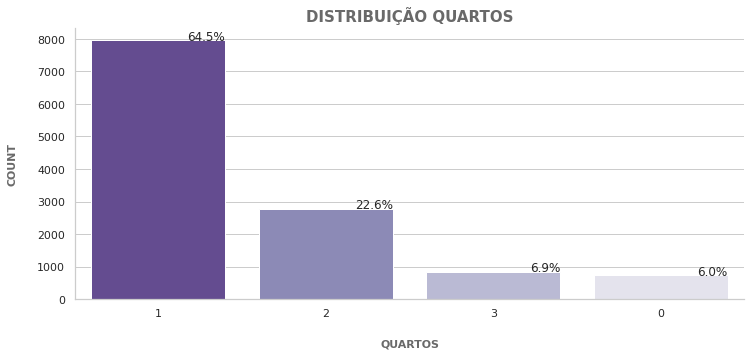

In [181]:
# Gráfico Distribuição Quartos
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='quartos', data=df_t, palette='Purples_r', order = df_t['quartos'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO QUARTOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

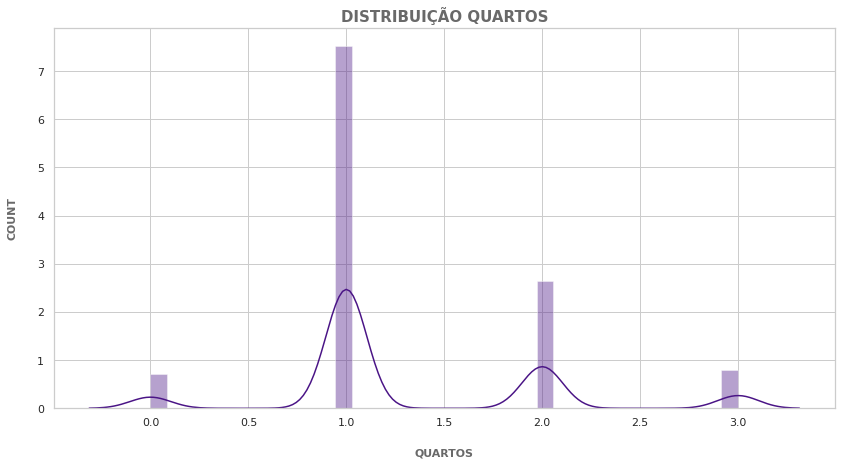

In [182]:
# Distribuição Quartos
sns.set(style='whitegrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['quartos'], color='#4a1486')
plt.title('DISTRIBUIÇÃO QUARTOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [183]:
# Descrição estatística do preço por quantidade de quartos
df_t.groupby('quartos')['preco'].describe().round(2).T

quartos,0,1,2,3
count,744.00,7950.00,2782.00,850.00
mean,238.34,236.25,417.00,525.06
std,182.66,194.94,257.84,276.39
min,29.00,29.00,42.00,46.00
25%,122.00,101.00,210.00,298.00
50%,185.00,178.00,348.00,491.00
75%,298.00,298.00,550.00,751.00
max,1113.00,1134.00,1117.00,1134.00


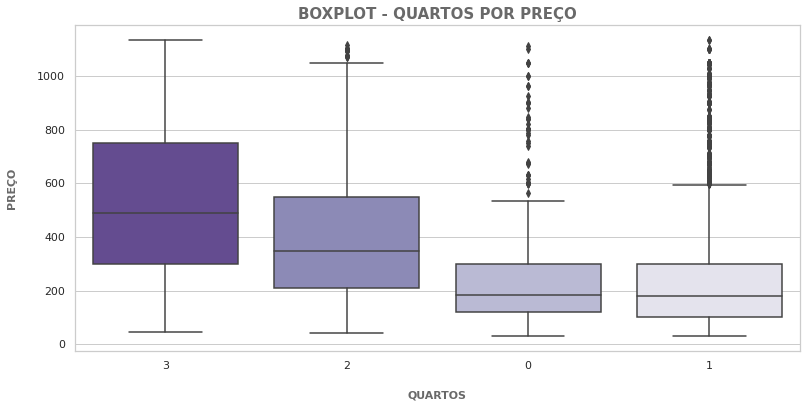

In [184]:
# Boxplot preço por quantidade de quartos

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='quartos', y='preco', palette='Purples_r', order = df_t.groupby(["quartos"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - QUARTOS POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [185]:
# Média de preço por quartos
df_t.groupby(['quartos'])['preco'].mean().round(2).sort_values(ascending=False)

quartos
3    525.06
2    417.00
0    238.34
1    236.25
Name: preco, dtype: float64

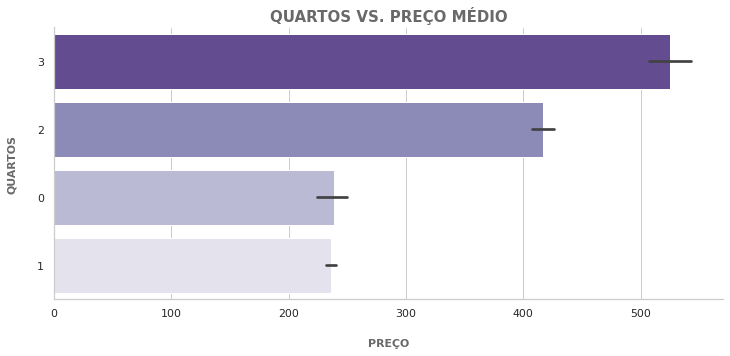

In [186]:
# Gráfico preço médio por Quartos

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'quartos', orient = "h", data=df_t, palette='Purples_r', order = df_t.groupby(["quartos"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('QUARTOS VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [187]:
# Correlação entre a quantidade de quartos e preços
df_t['quartos'].corr(df_t['preco']).round(2)

0.38

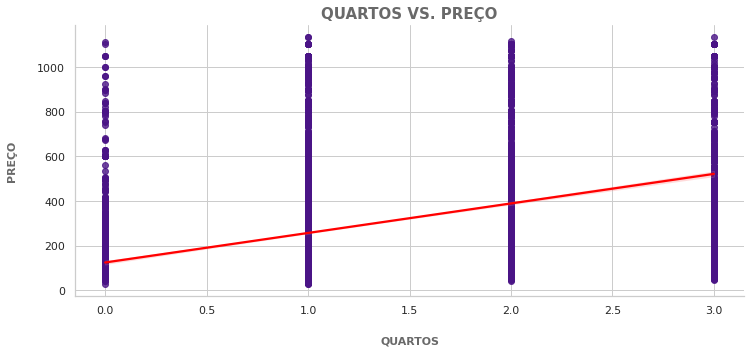

In [188]:
# Gráfico quantidade de quartos vs. preço

plt.figure(figsize=(12,5))
sns.regplot(x="quartos", y="preco", data=df_t, scatter_kws = {'color': '#4a1486'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('QUARTOS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [189]:
# Tabela analítica receita quantidade de quartos
rq = df_t.groupby(by=['quartos']).sum()['preco'].reset_index() # receita quantidade de quartos(rq)
rq.head()

,quartos,preco
0,0,177326.0
1,1,1878195.0
2,2,1160085.0
3,3,446303.0


In [190]:
# Tabela analítica receita quantidade de quartos em ordem decrescente
rqd = rq.sort_values('preco', ascending=False) # receita quantidade de quartos em ordem decrescente(rqd)
rqd.head()

,quartos,preco
1,1,1878195.0
2,2,1160085.0
3,3,446303.0
0,0,177326.0


<Figure size 720x720 with 0 Axes>

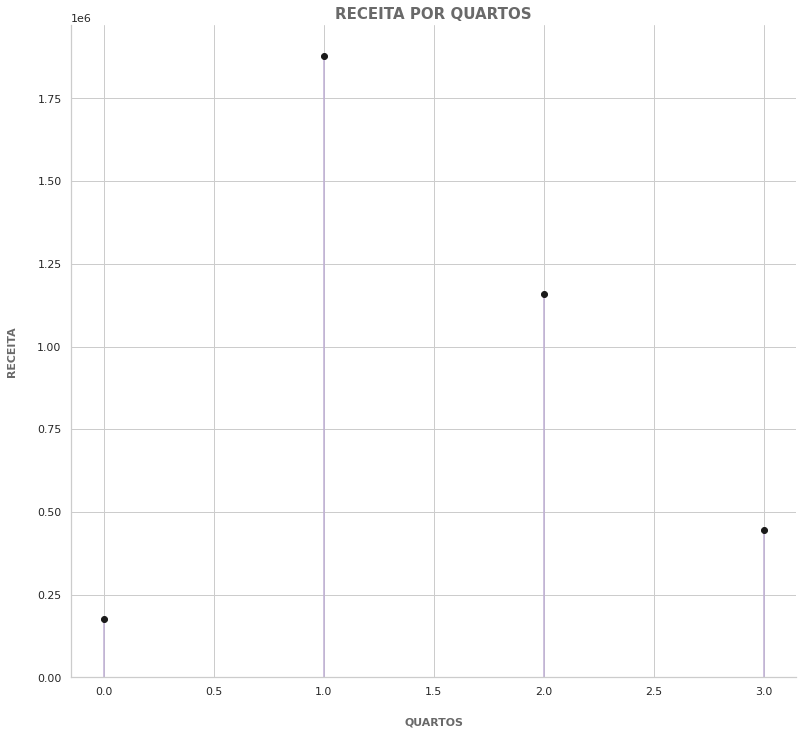

In [191]:
# Gráfico receita total por Quartos

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rqd['quartos'], ymin=0, ymax=rqd['preco'], color='#beaed4')
  
axes.plot(rqd['quartos'], rqd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR QUARTOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

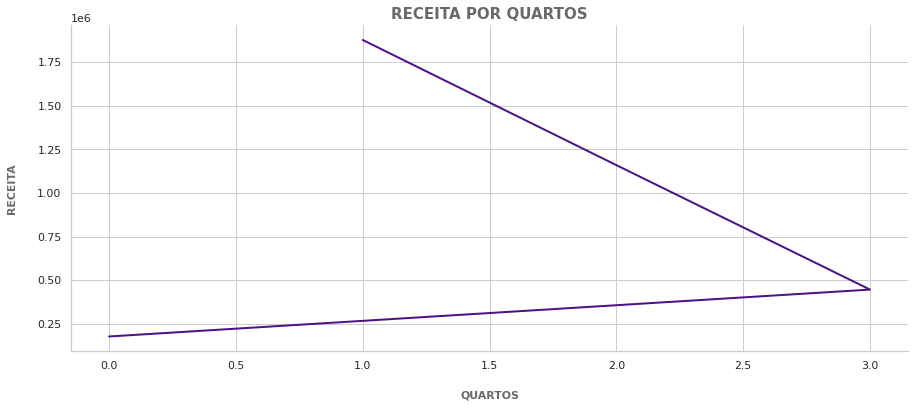

In [192]:
# Gráfico receita total por quantidade de quartos
plt.figure(figsize=(15,6))
plt.plot(rqd['quartos'], rqd['preco'], color='#4a1486', linewidth = '2')
sns.despine()
plt.title('RECEITA POR QUARTOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('QUARTOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Acomodações com apenas um quarto são as mais listadas e que possuem maior faturação 
- Existe uma tendência no aumento do preço médio ao passo em que o número de quartos também aumenta
- Acomodações no qual a quantidade de quartos é zero, possivelmente representem acomodações em que o quarto, cozinha, sala e demais áreas existentes são combinados em um único espaço aberto, não havendo uma delimitação concreta separando o quarto dos demais cômodos

Coluna "tipo_quarto"

In [193]:
# Averiguar todos os tipos de quartos existentes
df_t['tipo_quarto'].unique()

array(['espaco_inteiro', 'quarto_privado', 'quarto_compartilhado',
       'quarto_hotel'], dtype=object)

In [194]:
# Breve resumo estatístico dos tipos de quartos
df_t['tipo_quarto'].describe().T

count              12326
unique                 4
top       espaco_inteiro
freq                6856
Name: tipo_quarto, dtype: object

In [195]:
# Frequência dos tipos de quartos
df_t['tipo_quarto'].value_counts()

espaco_inteiro          6856
quarto_privado          5040
quarto_compartilhado     347
quarto_hotel              83
Name: tipo_quarto, dtype: int64

In [196]:
# Frequência dos tipos de quarto em termos de porcentagem
round(df_t['tipo_quarto'].value_counts(normalize=True) * 100)

espaco_inteiro          56.0
quarto_privado          41.0
quarto_compartilhado     3.0
quarto_hotel             1.0
Name: tipo_quarto, dtype: float64

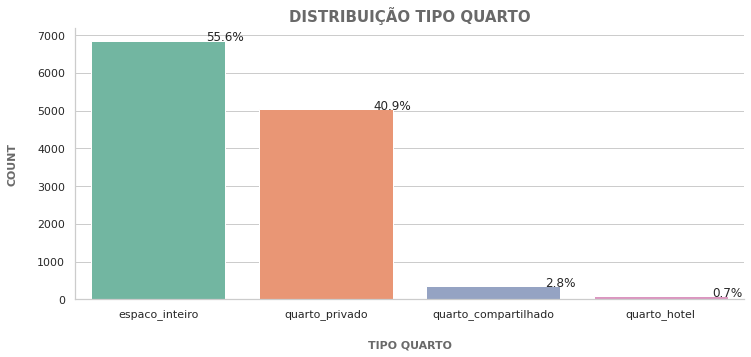

In [197]:
# Gráfico Distribuição tipo_quarto
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='tipo_quarto', data=df_t, palette='Set2', order = df_t['tipo_quarto'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO TIPO QUARTO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
plt.xlabel('TIPO QUARTO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [198]:
# Descrição estatística do tipo de quartos por preço
df_t.groupby('tipo_quarto')['preco'].describe().round(2).T

tipo_quarto,espaco_inteiro,quarto_compartilhado,quarto_hotel,quarto_privado
count,6856.00,347.00,83.00,5040.00
mean,373.73,162.09,233.55,203.17
std,252.58,178.65,207.60,172.25
min,34.00,29.00,38.00,29.00
25%,181.00,59.00,101.00,88.00
50%,298.00,88.00,176.00,151.00
75%,500.00,199.00,294.00,252.00
max,1134.00,999.00,1012.00,1134.00


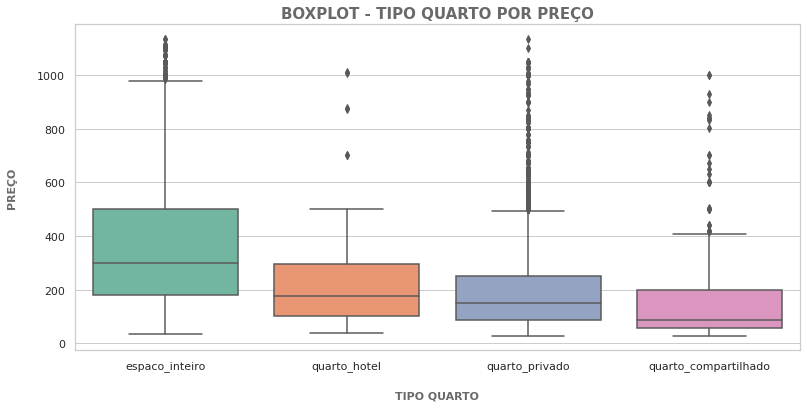

In [199]:
# Boxplot preço por tipo de quarto

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='tipo_quarto', y='preco', palette='Set2', order = df_t.groupby(["tipo_quarto"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - TIPO QUARTO POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('TIPO QUARTO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();


In [200]:
# Média de preço por tipo quarto
df_t.groupby(['tipo_quarto'])['preco'].mean().round(2).sort_values(ascending=False)

tipo_quarto
espaco_inteiro          373.73
quarto_hotel            233.55
quarto_privado          203.17
quarto_compartilhado    162.09
Name: preco, dtype: float64

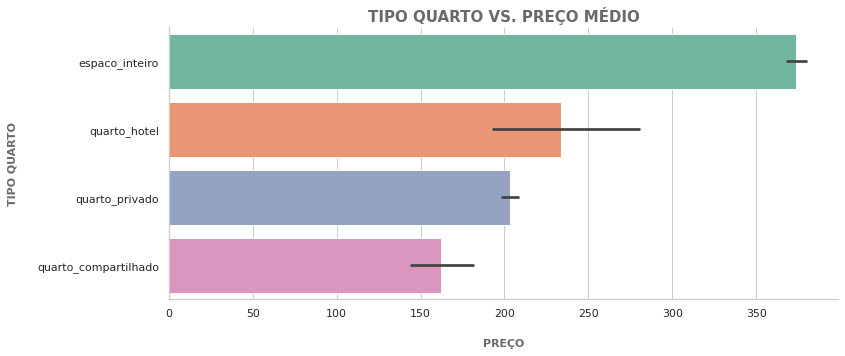

In [201]:
# Gráfico preço médio por tipo de quarto

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'tipo_quarto', orient = "h", data=df_t, palette='Set2', order = df_t.groupby(["tipo_quarto"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('TIPO QUARTO VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('TIPO QUARTO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [202]:
# Tabela analítica receita por tipo de quarto
rtq = df_t.groupby(by=['tipo_quarto']).sum()['preco'].reset_index() # receita por tipo de quarto(rtq)
rtq.head()

,tipo_quarto,preco
0,espaco_inteiro,2562322.0
1,quarto_compartilhado,56245.0
2,quarto_hotel,19385.0
3,quarto_privado,1023957.0


In [203]:
# Tabela analítica receita por tipo de quarto em ordem decrescente
rtqd = rtq.sort_values('preco', ascending=False) # receita por tipo de quarto em ordem decrescente(rtqd)
rtqd.head()

,tipo_quarto,preco
0,espaco_inteiro,2562322.0
3,quarto_privado,1023957.0
1,quarto_compartilhado,56245.0
2,quarto_hotel,19385.0


<Figure size 720x720 with 0 Axes>

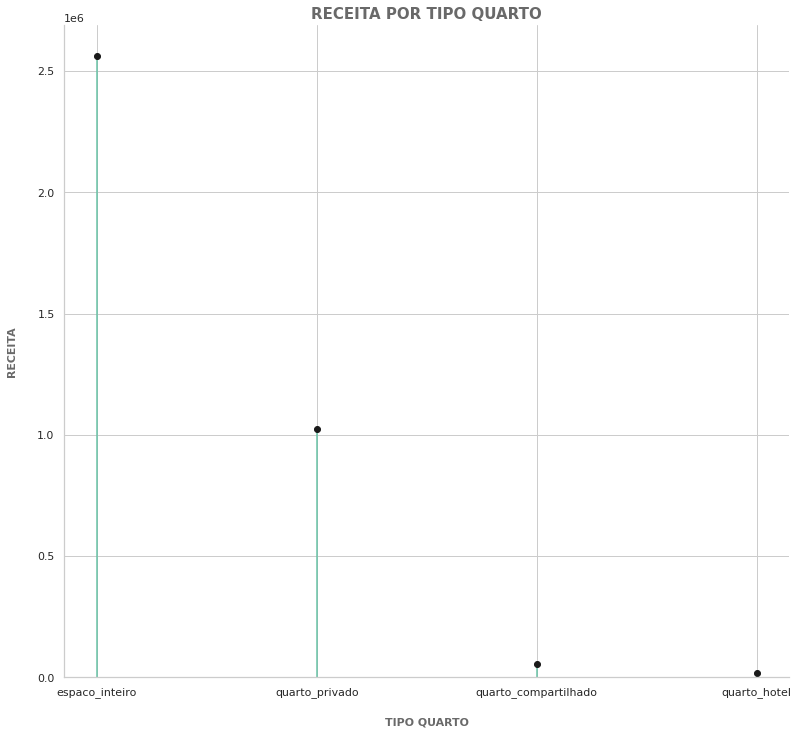

In [204]:
# Gráfico receita total por Tipo quarto

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rtqd['tipo_quarto'], ymin=0, ymax=rtqd['preco'], color='#66c2a5')
  
axes.plot(rtqd['tipo_quarto'], rtqd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR TIPO QUARTO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('TIPO QUARTO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

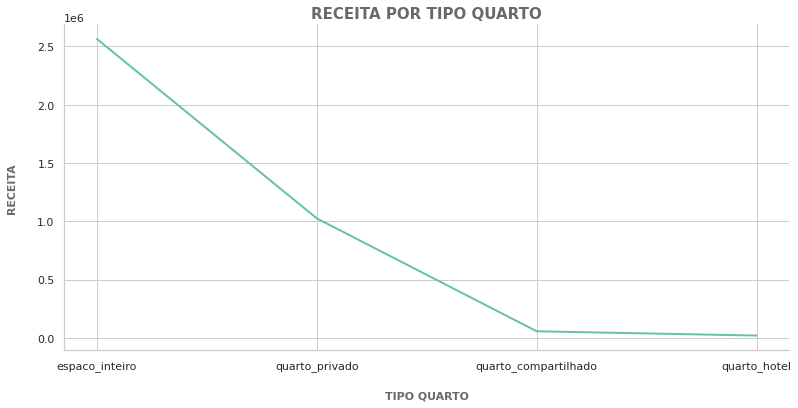

In [205]:
# Gráfico receita total por tipo de quarto
plt.figure(figsize=(13,6))
plt.plot(rtqd['tipo_quarto'], rtqd['preco'], color='#66c2a5', linewidth = '2')
sns.despine()
plt.title('RECEITA POR TIPO QUARTO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('TIPO QUARTO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [206]:
# Tipo de quarto por acomodação
pd.crosstab(df_t.acomodacao, df_t.tipo_quarto, margins=True, margins_name="Total")

tipo_quarto,espaco_inteiro,quarto_compartilhado,quarto_hotel,quarto_privado,Total
acomodacao,,,,,
acomodacao_cama_e_cafe,0,7,15,43,65
apart_hotel,6,0,1,5,12
apartamento,5491,185,0,3373,9049
apartamento_com_servico,196,1,32,27,256
bangalo,3,1,0,2,6
barco_hotel,0,0,0,1,1
cabana,3,0,0,0,3
casa,339,96,0,1020,1455
casa_de_hospedes,32,5,0,20,57


In [207]:
# Tipo de quarto por bairro
pd.crosstab(df_t.bairro_ajustado, df_t.tipo_quarto, margins=True, margins_name="Total")

tipo_quarto,espaco_inteiro,quarto_compartilhado,quarto_hotel,quarto_privado,Total
bairro_ajustado,,,,,
abolição,0,1,0,1,2
alto_da_boa_vista,10,0,0,13,23
anchieta,3,0,0,0,3
andaraí,20,2,0,34,56
anil,11,1,0,21,33
bancários,1,0,0,3,4
bangu,3,1,0,10,14
barra_da_tijuca,921,15,14,457,1407
barra_de_guaratiba,20,2,0,14,36


In [208]:
# Tipo de quarto por categoria preço
pd.crosstab(df_t.tipo_quarto, df_t.categoria_preco, margins=True, margins_name="Total")

categoria_preco,barato,caro,elevado,intermediario,muito_caro,Total
tipo_quarto,,,,,,
espaco_inteiro,1900,1651,734,1764,807,6856
quarto_compartilhado,260,25,9,42,11,347
quarto_hotel,45,11,4,21,2,83
quarto_privado,3203,558,107,980,192,5040
Total,5408,2245,854,2807,1012,12326


**ALGUMAS CONCLUSÕES:**

- Espaço inteiro é o tipo que quarto que aparece em maior frequência, tem maior preço médio e maior receita

Coluna "camas"

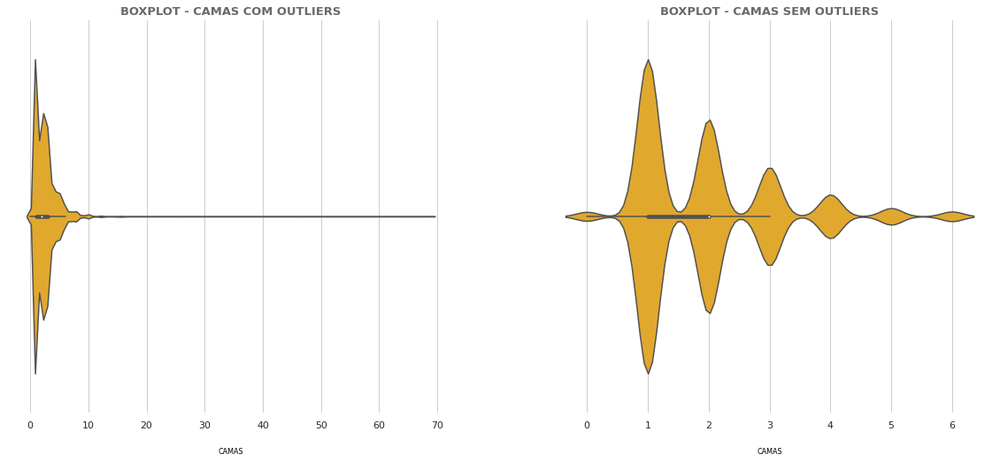

In [209]:
# Gráfico quantidade de camas antes e depois da remoção de outliers 

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['camas'], data=df_l, color='#ffb310')


plt.title('BOXPLOT - CAMAS COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('CAMAS', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['camas'], data=df_t, color='#ffb310')


plt.title('BOXPLOT - CAMAS SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('CAMAS', color = 'black', labelpad = 20, fontsize = 8);

In [210]:
# Breve resumo estatístico da quantidade de camas
df_t['camas'].describe().T

count    12326.000000
mean         1.916356
std          1.160638
min          0.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          6.000000
Name: camas, dtype: float64

In [211]:
# Frequência quantidade de camas
df_t['camas'].value_counts()

1    5644
2    3490
3    1771
4     786
5     298
6     175
0     162
Name: camas, dtype: int64

In [212]:
# Frequência da quantidade de camas em termos de porcentagem
round(df_t['camas'].value_counts(normalize=True) * 100)

1    46.0
2    28.0
3    14.0
4     6.0
5     2.0
6     1.0
0     1.0
Name: camas, dtype: float64

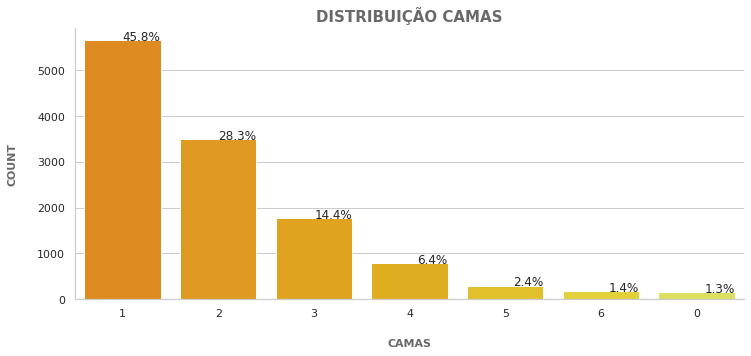

In [213]:
# Gráfico Distribuição Camas
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='camas', data=df_t, palette='Wistia_r', order = df_t['camas'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO CAMAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

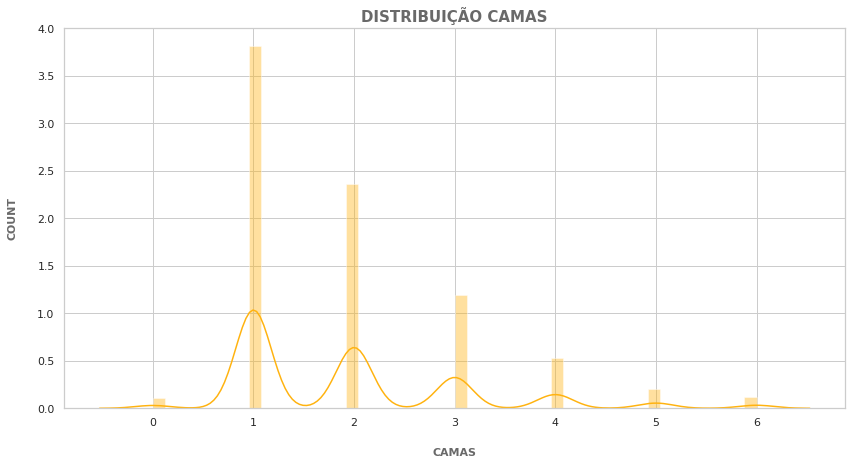

In [214]:
# Distribuição quantidade de camas
sns.set(style='whitegrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['camas'], color='#ffb310')
plt.title('DISTRIBUIÇÃO CAMAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [215]:
# Descrição estatística da quantidae de camas por preço
df_t.groupby('camas')['preco'].describe().round(2).T

camas,0,1,2,3,4,5,6
count,162.00,5644.00,3490.00,1771.00,786.00,298.00,175.00
mean,220.53,230.89,314.20,395.60,403.31,431.64,458.70
std,176.65,192.22,239.53,261.73,266.70,282.20,299.67
min,38.00,29.00,29.00,38.00,42.00,46.00,29.00
25%,98.00,101.00,143.00,202.00,202.00,202.00,216.00
50%,166.00,168.00,231.00,319.00,348.00,348.00,399.00
75%,287.75,298.00,399.00,542.00,521.00,600.00,699.00
max,999.00,1134.00,1113.00,1117.00,1134.00,1100.00,1100.00


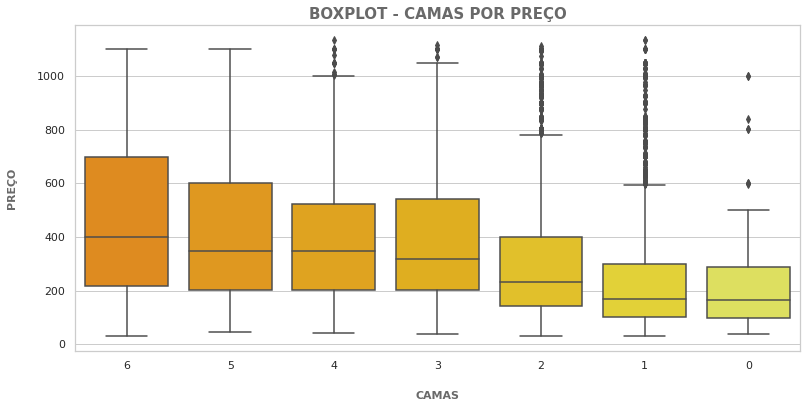

In [216]:
# Boxplot preço por Camas

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='camas', y='preco', palette='Wistia_r', order = df_t.groupby(["camas"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - CAMAS POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [217]:
# Média de preço por camas
df_t.groupby(['camas'])['preco'].mean().round(2).sort_values(ascending=False)

camas
6    458.70
5    431.64
4    403.31
3    395.60
2    314.20
1    230.89
0    220.53
Name: preco, dtype: float64

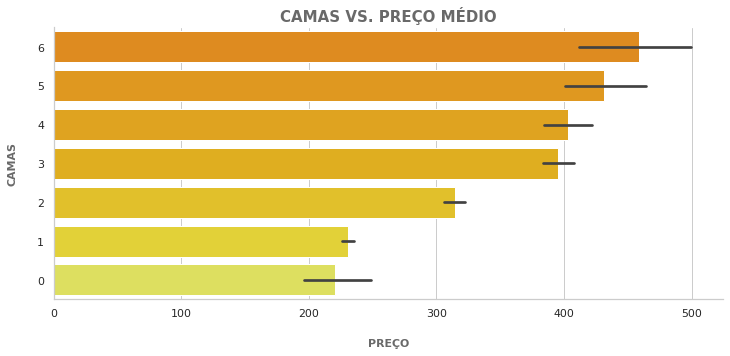

In [218]:
# Gráfico preço médio por Cama

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'camas', orient = "h", data=df_t, palette='Wistia_r', order = df_t.groupby(["camas"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('CAMAS VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [219]:
# Gráfico quantidade de camas por preço
df_t['camas'].corr(df_t['preco']).round(2)

0.29

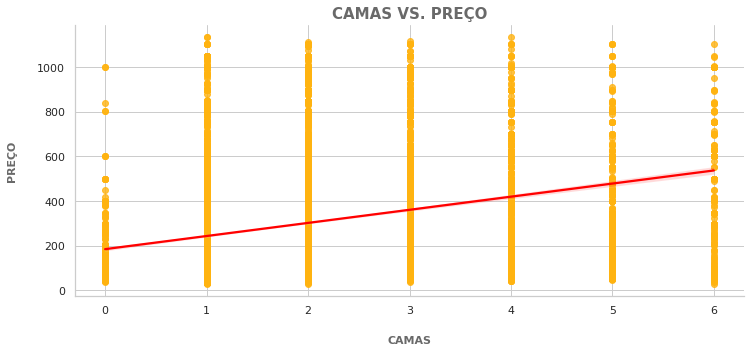

In [220]:
# Gráfico cama vs. preço

plt.figure(figsize=(12,5))
sns.regplot(x="camas", y="preco", data=df_t, scatter_kws = {'color': '#ffb310'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('CAMAS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [221]:
# Tabela analítica receita por quantidade de camas
rc = df_t.groupby(by=['camas']).sum()['preco'].reset_index() # receita por quantidade de camas(rc)
rc.head()

,camas,preco
0,0,35726.0
1,1,1303129.0
2,2,1096552.0
3,3,700602.0
4,4,316998.0


In [222]:
# Tabela analítica receita por quantidade de camas em ordem decrescente
rcd = rc.sort_values('preco', ascending=False) # receita por quantidade de camas em ordem decrescente(rcd)
rcd.head()

,camas,preco
1,1,1303129.0
2,2,1096552.0
3,3,700602.0
4,4,316998.0
5,5,128630.0


<Figure size 720x720 with 0 Axes>

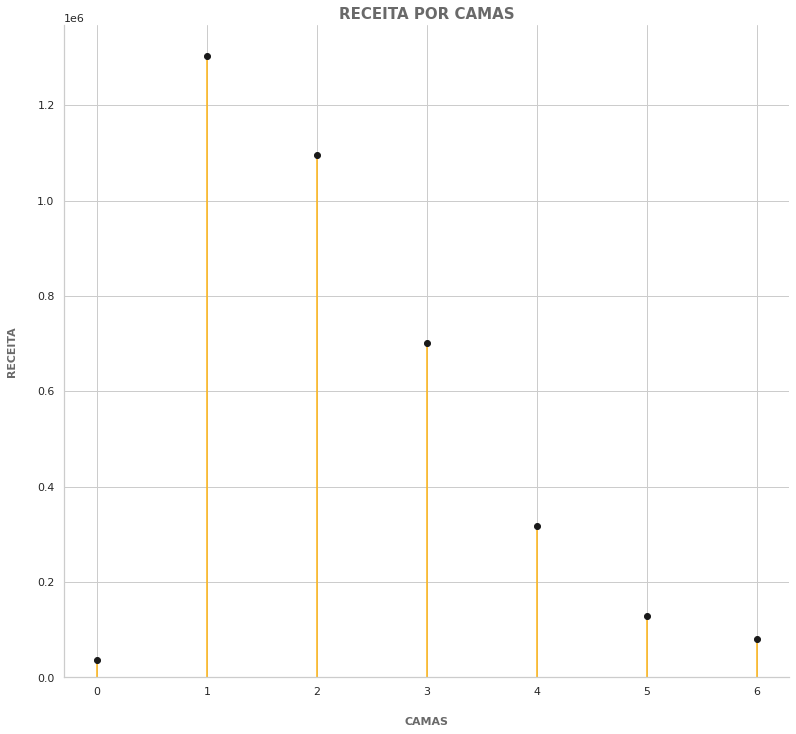

In [223]:
# Gráfico receita total por Camas

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rcd['camas'], ymin=0, ymax=rcd['preco'], color='#ffb310')
  
axes.plot(rcd['camas'], rcd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR CAMAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

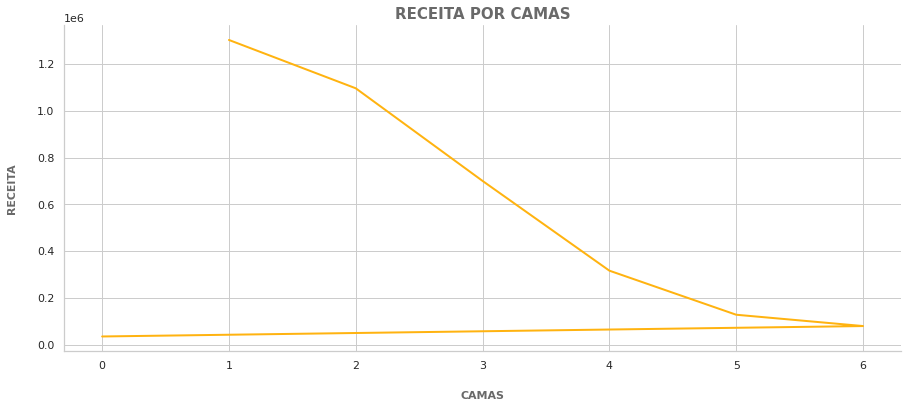

In [224]:
# Gráfico receita total por quantidade de camas
plt.figure(figsize=(15,6))
plt.plot(rcd['camas'], rcd['preco'], color='#ffb310', linewidth = '2')
sns.despine()
plt.title('RECEITA POR CAMAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAMAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- As acomodações mais comuns são as que contam com apenas uma cama
- O preço médio tem uma certa tendência em aumentar com a quantidade de camas
- A receita total tende a ser maior quanto menor for o número de camas 
- Não foi possível identificar um motivo plausível do porque algumas acomodações têm a quantidade de camas iguais a zero

Coluna "tipo_cama"

In [225]:
# Todos os tipos de camas
df_t['tipo_cama'].unique()

array(['cama_real', 'sofa_cama', 'futon', 'colchao_ar', 'sofa'],
      dtype=object)

In [226]:
# Breve resumo estatístico tipo de camas
df_t['tipo_cama'].describe().T

count         12326
unique            5
top       cama_real
freq          12106
Name: tipo_cama, dtype: object

In [227]:
# Frequência dos tipos de camas
df_t['tipo_cama'].value_counts()

cama_real     12106
sofa_cama       149
futon            33
colchao_ar       26
sofa             12
Name: tipo_cama, dtype: int64

In [228]:
# Frequência dos tipo de cama em termos de porcentagem
df_t['tipo_cama'].value_counts(normalize=True) * 100

cama_real     98.215155
sofa_cama      1.208827
futon          0.267727
colchao_ar     0.210936
sofa           0.097355
Name: tipo_cama, dtype: float64

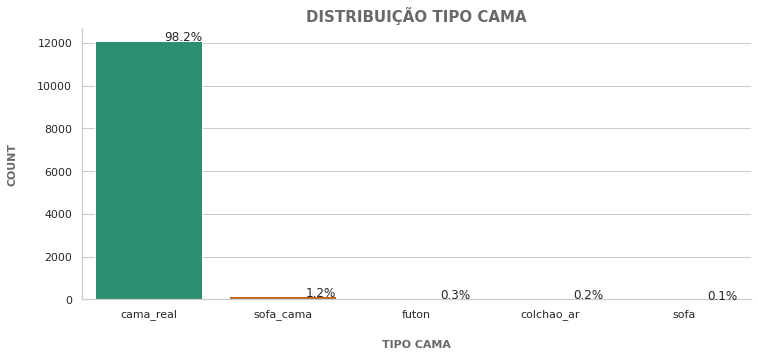

In [229]:
# Gráfico Distribuição Tipo cama
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='tipo_cama', data=df_t, palette='Dark2', order = df_t['tipo_cama'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO TIPO CAMA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('TIPO CAMA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [230]:
# Descrição estatística do tipo de camas por preço
df_t.groupby('tipo_cama')['preco'].describe().round(2).T

tipo_cama,cama_real,colchao_ar,futon,sofa,sofa_cama
count,12106.00,26.00,33.00,12.00,149.00
mean,297.36,256.58,252.12,445.33,280.45
std,237.04,193.56,243.01,397.53,227.13
min,29.00,34.00,42.00,80.00,42.00
25%,122.00,158.50,122.00,115.75,122.00
50%,210.00,206.00,181.00,279.00,202.00
75%,399.00,285.75,269.00,851.25,348.00
max,1134.00,802.00,1050.00,1050.00,1050.00


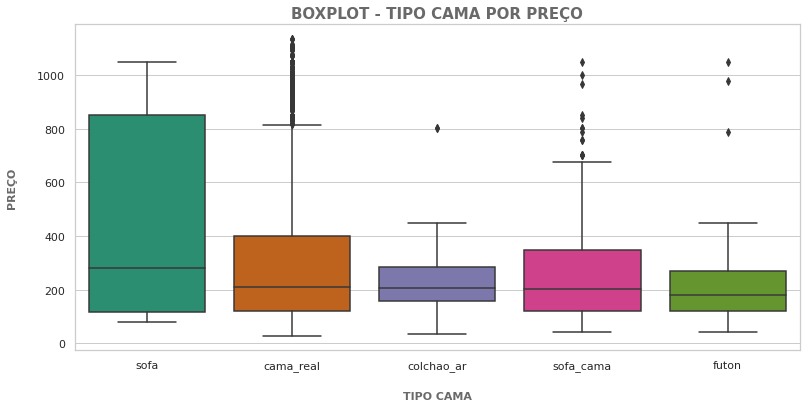

In [231]:
# Boxplot preço por Tipo cama

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='tipo_cama', y='preco', palette='Dark2', order = df_t.groupby(["tipo_cama"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - TIPO CAMA POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('TIPO CAMA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [232]:
# Média de preço por tipo cama
df_t.groupby(['tipo_cama'])['preco'].mean().round(2).sort_values(ascending=False)

tipo_cama
sofa          445.33
cama_real     297.36
sofa_cama     280.45
colchao_ar    256.58
futon         252.12
Name: preco, dtype: float64

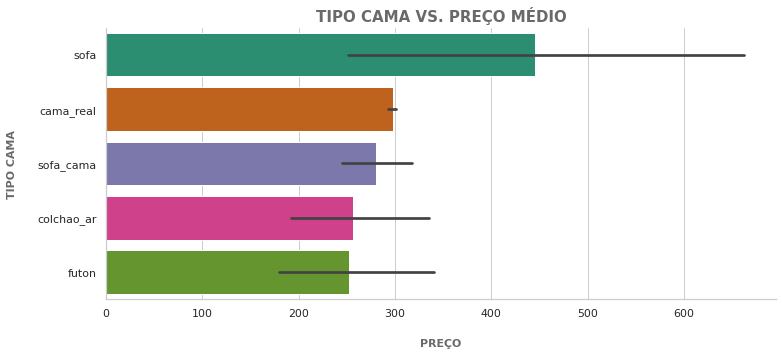

In [233]:
# Gráfico preço médio por Tipo cama

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'tipo_cama', orient = "h", data=df_t, palette='Dark2', order = df_t.groupby(["tipo_cama"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('TIPO CAMA VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('TIPO CAMA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [234]:
# Tabela analítica renda por tipo de cama
rtc = df_t.groupby(by=['tipo_cama']).sum()['preco'].reset_index() # renda por tipo de cama(rtc)
rtc.head()

,tipo_cama,preco
0,cama_real,3599787.0
1,colchao_ar,6671.0
2,futon,8320.0
3,sofa,5344.0
4,sofa_cama,41787.0


In [235]:
# Tabela analítica renda por tipo de cama em ordem decrescente
rtcd = rtc.sort_values('preco', ascending=False) # renda por tipo de cama em ordem decrescente(rtcd)
rtcd.head()

,tipo_cama,preco
0,cama_real,3599787.0
4,sofa_cama,41787.0
2,futon,8320.0
1,colchao_ar,6671.0
3,sofa,5344.0


<Figure size 720x720 with 0 Axes>

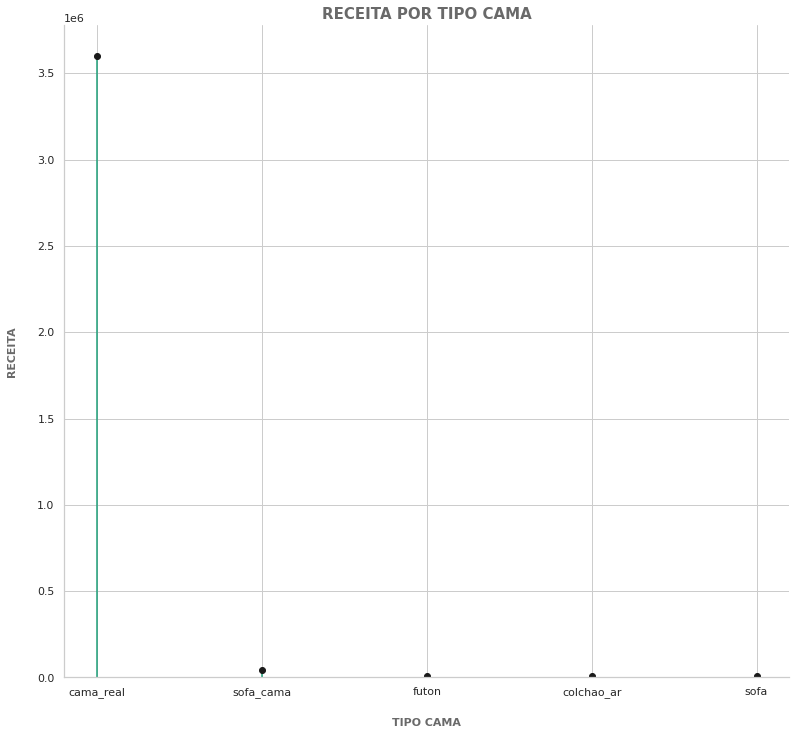

In [236]:
# Gráfico receita total por Tipo cama

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rtcd['tipo_cama'], ymin=0, ymax=rtcd['preco'], color='#1b9e77')
  
axes.plot(rtcd['tipo_cama'], rtcd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR TIPO CAMA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('TIPO CAMA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

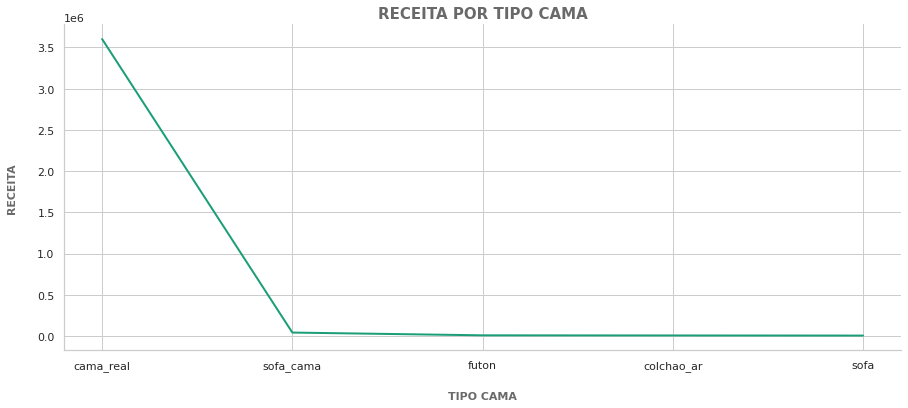

In [237]:
# Gráfico receita total por tipo de cama
plt.figure(figsize=(15,6))
plt.plot(rtcd['tipo_cama'], rtcd['preco'], color='#1b9e77', linewidth = '2')
sns.despine()
plt.title('RECEITA POR TIPO CAMA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('TIPO CAMA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [238]:
# Tipo de cama por acomodação
pd.crosstab(df_t.acomodacao, df_t.tipo_cama, margins=True, margins_name="Total")

tipo_cama,cama_real,colchao_ar,futon,sofa,sofa_cama,Total
acomodacao,,,,,,
acomodacao_cama_e_cafe,65,0,0,0,0,65
apart_hotel,11,0,0,0,1,12
apartamento,8869,16,22,11,131,9049
apartamento_com_servico,256,0,0,0,0,256
bangalo,6,0,0,0,0,6
barco_hotel,1,0,0,0,0,1
cabana,3,0,0,0,0,3
casa,1438,6,3,0,8,1455
casa_de_hospedes,57,0,0,0,0,57


In [239]:
# Tipo de cama por bairro
pd.crosstab(df_t.bairro_ajustado, df_t.tipo_cama, margins=True, margins_name="Total")

tipo_cama,cama_real,colchao_ar,futon,sofa,sofa_cama,Total
bairro_ajustado,,,,,,
abolição,2,0,0,0,0,2
alto_da_boa_vista,23,0,0,0,0,23
anchieta,3,0,0,0,0,3
andaraí,54,0,0,0,2,56
anil,32,0,0,0,1,33
bancários,4,0,0,0,0,4
bangu,14,0,0,0,0,14
barra_da_tijuca,1389,2,1,1,14,1407
barra_de_guaratiba,36,0,0,0,0,36


In [240]:
# Tipo de cama por categoria preço
pd.crosstab(df_t.tipo_cama, df_t.categoria_preco, margins=True, margins_name="Total")

categoria_preco,barato,caro,elevado,intermediario,muito_caro,Total
tipo_cama,,,,,,
cama_real,5307,2209,839,2755,996,12106
colchao_ar,8,3,2,13,0,26
futon,18,5,2,7,1,33
sofa,5,2,4,1,0,12
sofa_cama,70,26,7,31,15,149
Total,5408,2245,854,2807,1012,12326


In [241]:
# Tipo de cama por tipo de quarto
pd.crosstab(df_t.tipo_cama, df_t.tipo_quarto, margins=True, margins_name="Total")

tipo_quarto,espaco_inteiro,quarto_compartilhado,quarto_hotel,quarto_privado,Total
tipo_cama,,,,,
cama_real,6762,337,83,4924,12106
colchao_ar,14,3,0,9,26
futon,13,0,0,20,33
sofa,8,3,0,1,12
sofa_cama,59,4,0,86,149
Total,6856,347,83,5040,12326


**ALGUMAS CONCLUSÕES:**

- Acomodações com cama real são as mais habituais e apresentam maior receita total
- Acomodações com sofá possuem maior preço médio

# 7- Acomodações que apresentam maior quantidade de avaliações, capacidade de hóspedes e convidados inclusos possuem vantagens na receita total?

Coluna "avaliacoes"

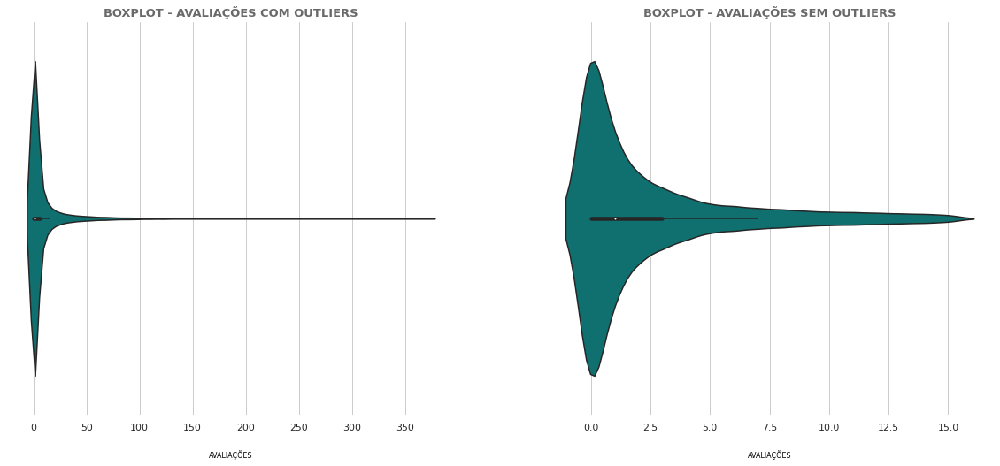

In [242]:
# Gráfico quantidade de avaliações antes e depois da remoção de outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['avaliacoes'], data=df_l, color='teal')


plt.title('BOXPLOT - AVALIAÇÕES COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('AVALIAÇÕES', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['avaliacoes'], data=df_t, color='teal')


plt.title('BOXPLOT - AVALIAÇÕES SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('AVALIAÇÕES', color = 'black', labelpad = 20, fontsize = 8);

In [243]:
# Breve resumo estatístico quantidade de avaliações
df_t['avaliacoes'].describe().T

count    12326.000000
mean         2.388609
std          3.506477
min          0.000000
25%          0.000000
50%          1.000000
75%          3.000000
max         15.000000
Name: avaliacoes, dtype: float64

In [244]:
# Frequência quantidade de avaliações
df_t['avaliacoes'].value_counts()

0     5356
1     2089
2     1168
3      820
4      580
5      377
6      338
7      278
8      248
9      206
10     180
11     173
12     154
13     136
14     124
15      99
Name: avaliacoes, dtype: int64

In [245]:
# Frequência quantidade de avaliações em termos de porcentagem
round(df_t['avaliacoes'].value_counts(normalize=True) * 100)

0     43.0
1     17.0
2      9.0
3      7.0
4      5.0
5      3.0
6      3.0
7      2.0
8      2.0
9      2.0
10     1.0
11     1.0
12     1.0
13     1.0
14     1.0
15     1.0
Name: avaliacoes, dtype: float64

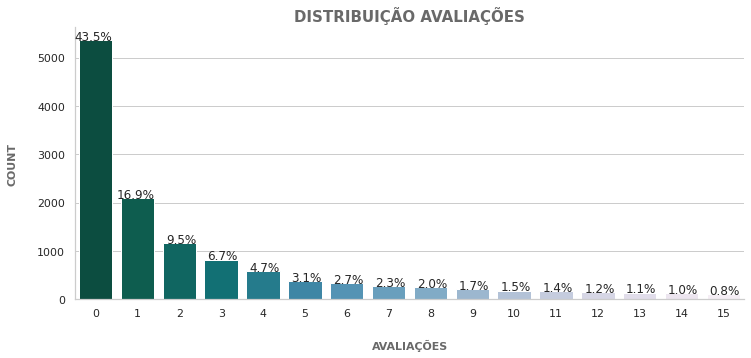

In [246]:
# Gráfico Distribuição Quantidade de avaliações
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='avaliacoes', data=df_t, palette='PuBuGn_r', order = df_t['avaliacoes'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO AVALIAÇÕES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

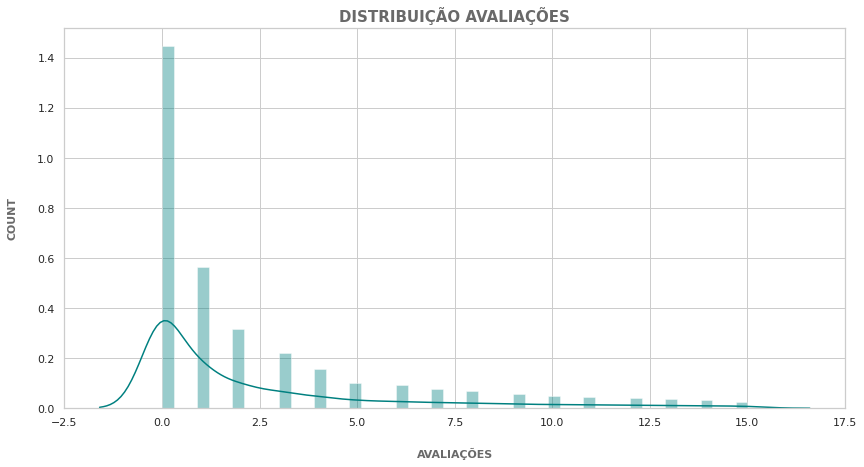

In [247]:
# Distribuição quantidade de avaliações
sns.set(style='whitegrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['avaliacoes'], color='teal')
plt.title('DISTRIBUIÇÃO AVALIAÇÕES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [248]:
# Descrição estatística do preço por quantidade de avaliações
df_t.groupby('avaliacoes')['preco'].describe().round(2).T

avaliacoes,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
count,5356.00,2089.00,1168.00,820.00,580.00,377.00,338.00,278.00,248.00,206.00,180.00,173.00,154.00,136.00,124.00,99.00
mean,360.85,274.47,251.63,244.63,252.19,232.95,252.47,217.88,238.14,237.03,197.54,185.30,201.68,206.23,218.53,198.44
std,270.59,213.94,190.65,189.48,193.05,179.08,186.52,171.88,203.52,191.13,140.22,125.37,144.47,149.25,193.40,162.10
min,29.00,29.00,34.00,42.00,38.00,42.00,38.00,42.00,42.00,42.00,42.00,38.00,38.00,46.00,42.00,46.00
25%,151.00,122.00,122.00,109.00,122.00,109.00,126.00,101.00,101.00,102.00,97.00,101.00,101.00,101.00,100.00,101.00
50%,281.00,202.00,197.00,189.00,202.00,181.00,202.00,164.00,168.00,181.00,157.50,151.00,155.00,168.00,151.00,151.00
75%,500.00,348.00,332.00,298.00,312.00,298.00,304.00,252.00,298.00,298.00,260.00,218.00,252.00,252.00,252.00,233.00
max,1134.00,1100.00,1100.00,999.00,1100.00,1016.00,999.00,1050.00,1100.00,1008.00,1100.00,848.00,890.00,970.00,1117.00,999.00


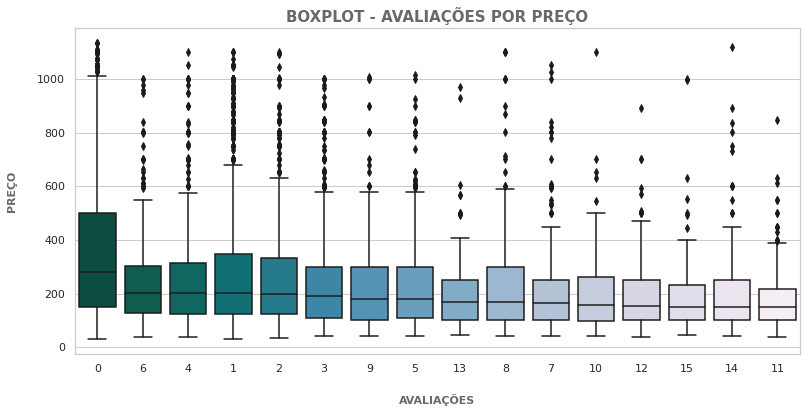

In [249]:
# Boxplot preço por Avaliações

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='avaliacoes', y='preco', palette='PuBuGn_r', order = df_t.groupby(["avaliacoes"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - AVALIAÇÕES POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [250]:
# Média de preço por Avaliações
df_t.groupby(['avaliacoes'])['preco'].mean().round(2).sort_values(ascending=False)

avaliacoes
0     360.85
1     274.47
6     252.47
4     252.19
2     251.63
3     244.63
8     238.14
9     237.03
5     232.95
14    218.53
7     217.88
13    206.23
12    201.68
15    198.44
10    197.54
11    185.30
Name: preco, dtype: float64

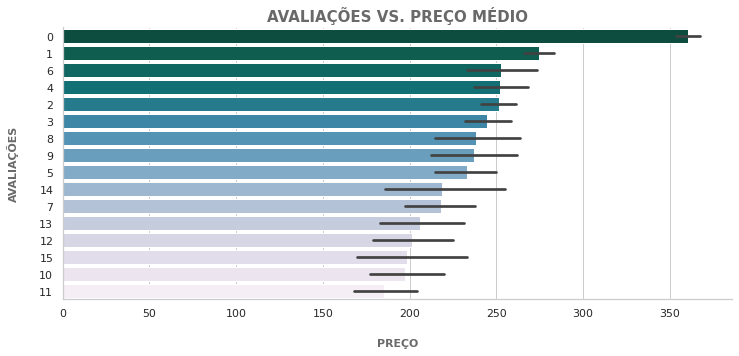

In [251]:
# Gráfico preço médio por Avaliações

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'avaliacoes', orient = "h", data=df_t, palette='PuBuGn_r', order = df_t.groupby(["avaliacoes"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('AVALIAÇÕES VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [252]:
# Correlação entre a quantidade de avaliações e preço
df_t['avaliacoes'].corr(df_t['preco']).round(2)

-0.19

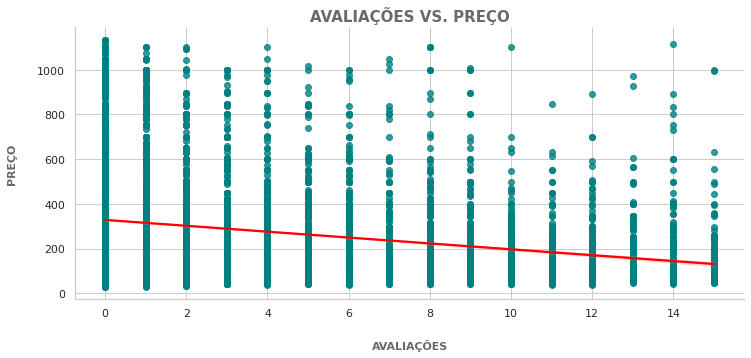

In [253]:
# Gráfico quantidade de avaliações vs. preço 

plt.figure(figsize=(12,5))
sns.regplot(x="avaliacoes", y="preco", data=df_t, scatter_kws = {'color': 'teal'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('AVALIAÇÕES VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [254]:
# Tabela analítica receita por quantidade de avaliações
rqa = df_t.groupby(by=['avaliacoes']).sum()['preco'].reset_index() # receita por quantidade de avaliações(rqa)
rqa.head()

,avaliacoes,preco
0,0,1932692.0
1,1,573375.0
2,2,293899.0
3,3,200594.0
4,4,146268.0


In [255]:
# Tabela analítica receita por quantidade de avaliações em ordem decrescente
rqad = rqa.sort_values('preco', ascending=False) # receita por quantidade de avaliações em ordem decrescente(rqad)
rqad.head()

,avaliacoes,preco
0,0,1932692.0
1,1,573375.0
2,2,293899.0
3,3,200594.0
4,4,146268.0


<Figure size 720x720 with 0 Axes>

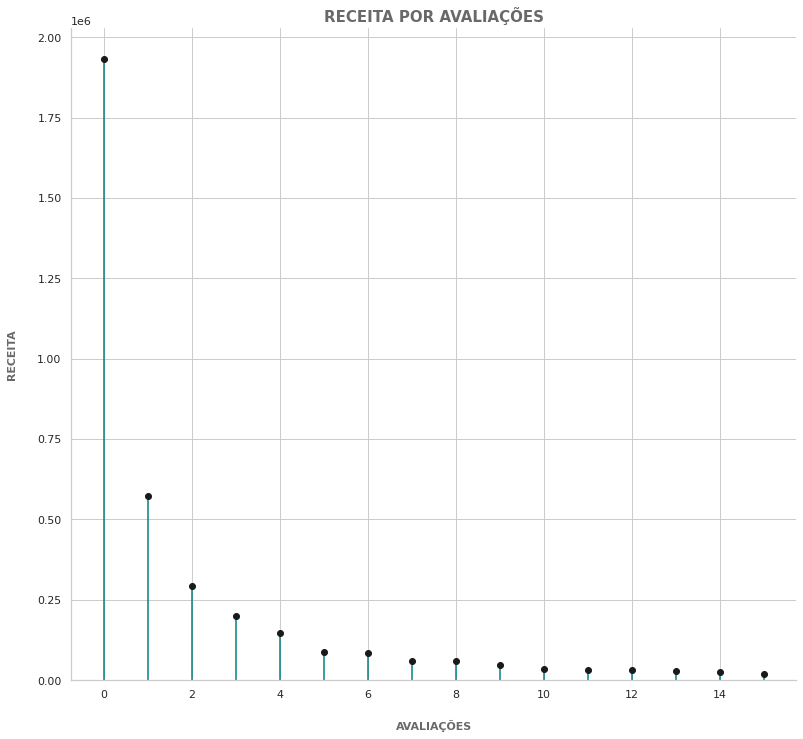

In [256]:
# Gráfico receita total por Avaliações

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rqad['avaliacoes'], ymin=0, ymax=rqad['preco'], color='teal')
  
axes.plot(rqad['avaliacoes'], rqad['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR AVALIAÇÕES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

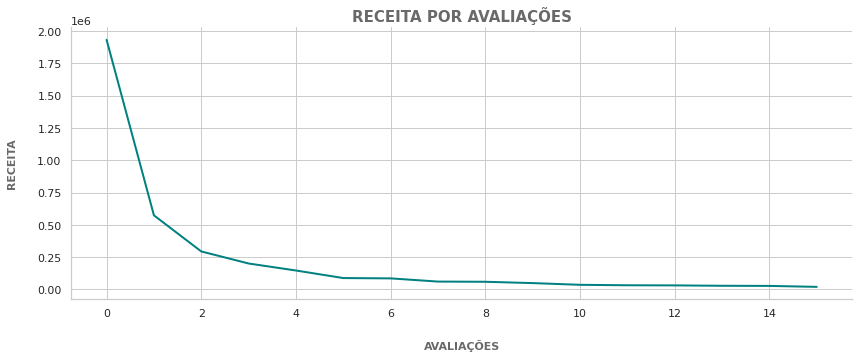

In [257]:
# Gráfico receita total por quantidade de avaliações
plt.figure(figsize=(14,5))
plt.plot(rqad['avaliacoes'], rqad['preco'], color = 'teal', linewidth = '2')
sns.despine()
plt.title('RECEITA POR AVALIAÇÕES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('AVALIAÇÕES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Existe uma quantidade significativa de acomodações sem avaliações
- Quantidade de avaliações apontam não ter influência sobre o preço

Coluna "capacidade_hospedes"

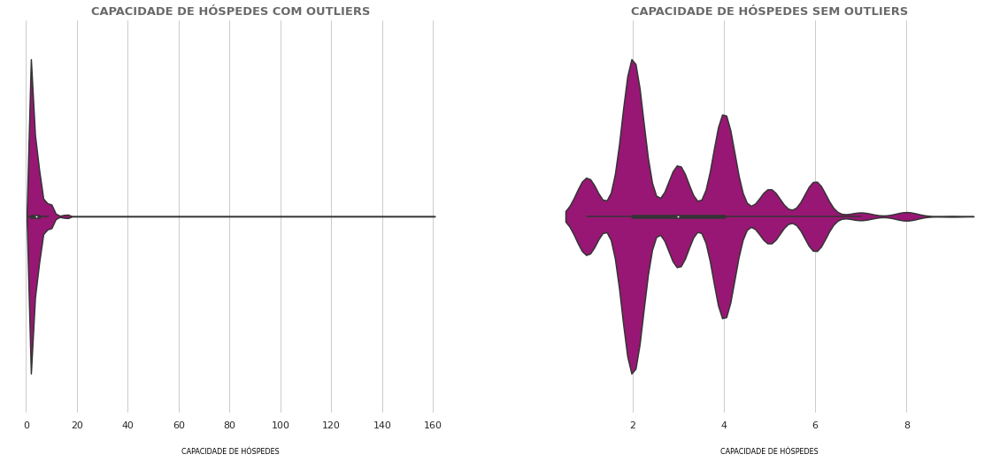

In [258]:
# Gráfico capacidade de hóspedes antes e depois da remoção de outliers 

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['capacidade_hospedes'], data=df_l, color='#ae017e')


plt.title('CAPACIDADE DE HÓSPEDES COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('CAPACIDADE DE HÓSPEDES', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['capacidade_hospedes'], data=df_t, color='#ae017e')


plt.title('CAPACIDADE DE HÓSPEDES SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('CAPACIDADE DE HÓSPEDES', color = 'black', labelpad = 20, fontsize = 8);

In [259]:
# Breve resumo estatístico capacidade de hóspedes
df_t['capacidade_hospedes'].describe().T

count    12326.000000
mean         3.159744
std          1.550881
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          9.000000
Name: capacidade_hospedes, dtype: float64

In [260]:
# Frequência da capacidade de hóspedes
df_t['capacidade_hospedes'].value_counts()

2    4611
4    3010
3    1496
1    1131
6    1025
5     802
8     125
7     114
9      12
Name: capacidade_hospedes, dtype: int64

In [261]:
# Frequência da capacidade de hóspedes em termos de porcentagem
round(df_t['capacidade_hospedes'].value_counts(normalize=True) * 100)

2    37.0
4    24.0
3    12.0
1     9.0
6     8.0
5     7.0
8     1.0
7     1.0
9     0.0
Name: capacidade_hospedes, dtype: float64

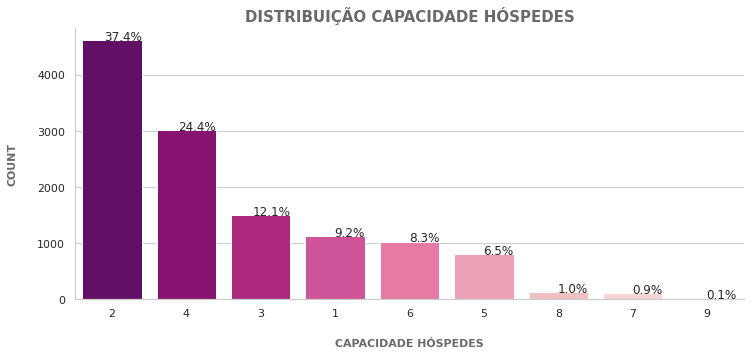

In [262]:
# Gráfico Distribuição Capacidade de hóspedes
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='capacidade_hospedes', data=df_t, palette='RdPu_r', order = df_t['capacidade_hospedes'].value_counts().index)
sns.despine()
plt.title('DISTRIBUIÇÃO CAPACIDADE HÓSPEDES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.xlabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

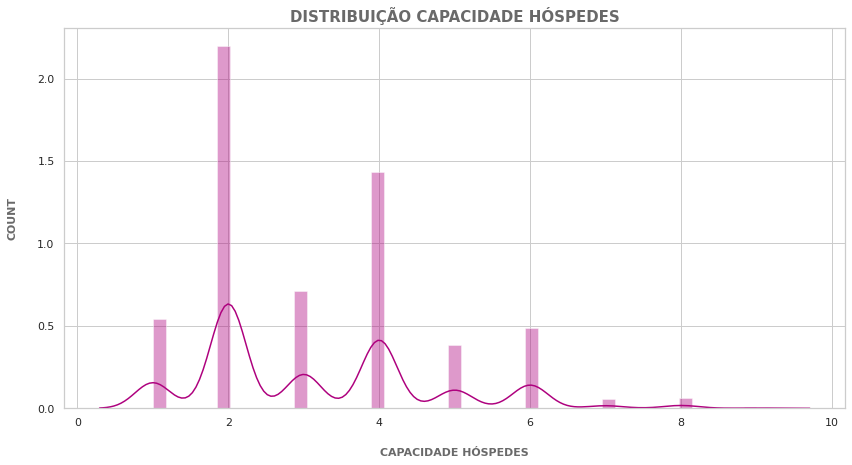

In [263]:
# Distribuição capacidade de hóspedes
sns.set(style='whitegrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['capacidade_hospedes'], color='#ae017e')
plt.title('DISTRIBUIÇÃO CAPACIDADE HÓSPEDES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [264]:
# Descrição estatística do preço por capacidade de hóspedes
df_t.groupby('capacidade_hospedes')['preco'].describe().round(2).T

capacidade_hospedes,1,2,3,4,5,6,7,8,9
count,1131.00,4611.00,1496.00,3010.00,802.00,1025.00,114.00,125.00,12.00
mean,154.51,225.76,262.36,363.47,420.67,476.23,522.11,556.87,416.42
std,160.71,180.33,198.46,243.90,262.30,276.11,297.41,294.83,274.97
min,29.00,29.00,42.00,38.00,42.00,29.00,101.00,42.00,97.00
25%,63.00,101.00,126.00,181.00,215.00,252.00,286.25,340.00,187.00
50%,101.00,168.00,202.00,298.00,348.00,416.00,459.50,500.00,325.50
75%,168.00,290.00,337.00,500.00,550.00,651.00,793.75,802.00,625.25
max,1008.00,1134.00,1100.00,1134.00,1100.00,1134.00,1100.00,1050.00,835.00


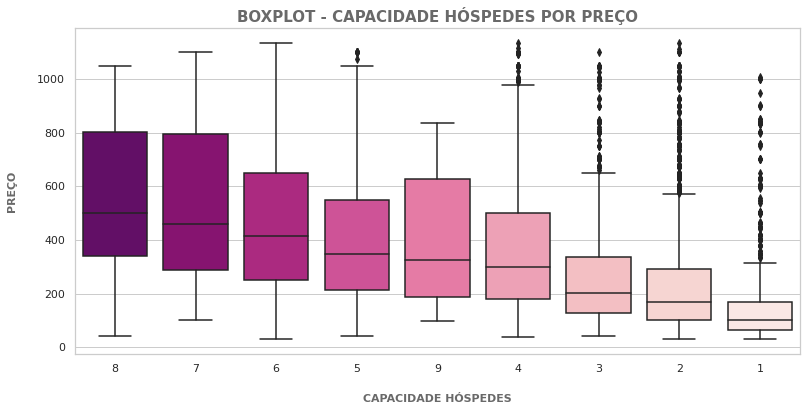

In [265]:
# Boxplot preço por Capacidade hóspedes

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='capacidade_hospedes', y='preco', palette='RdPu_r', order = df_t.groupby(["capacidade_hospedes"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - CAPACIDADE HÓSPEDES POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [266]:
# Média de preço por Capacidade hóspedes
df_t.groupby(['capacidade_hospedes'])['preco'].mean().round(2).sort_values(ascending=False)

capacidade_hospedes
8    556.87
7    522.11
6    476.23
5    420.67
9    416.42
4    363.47
3    262.36
2    225.76
1    154.51
Name: preco, dtype: float64

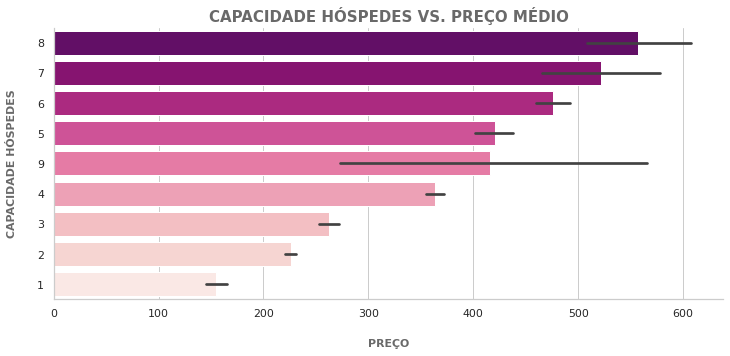

In [267]:
# Gráfico preço médio por Capacidade hóspedes

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'capacidade_hospedes', orient = "h", data=df_t, palette='RdPu_r', order = df_t.groupby(["capacidade_hospedes"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('CAPACIDADE HÓSPEDES VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [268]:
# Correlação entre a capacidade de hóspedes e o preço
df_t['capacidade_hospedes'].corr(df_t['preco']).round(2)

0.41

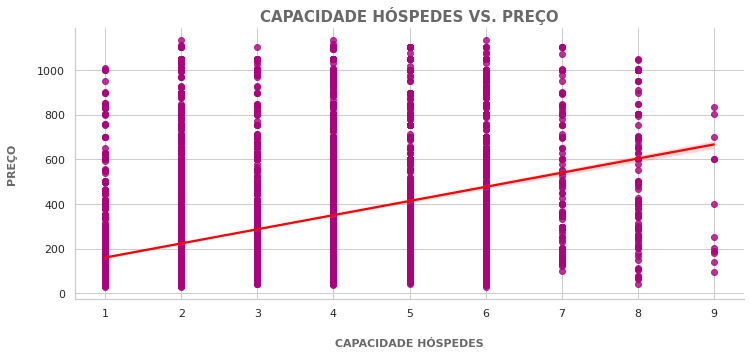

In [269]:
# Gráfico capacidade de hóspedes vs. preço

plt.figure(figsize=(12,5))
sns.regplot(x="capacidade_hospedes", y="preco", data=df_t, scatter_kws = {'color': '#ae017e'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('CAPACIDADE HÓSPEDES VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [270]:
# Tabela analítica receita capacidade de hóspedes
rch = df_t.groupby(by=['capacidade_hospedes']).sum()['preco'].reset_index() # receita capacidade de hospedes(rch)
rch.head()

,capacidade_hospedes,preco
0,1,174752.0
1,2,1040985.0
2,3,392492.0
3,4,1094038.0
4,5,337380.0


In [271]:
# Tabela analítica receita capacidade de hóspedes em ordem decrescente
rchd = rch.sort_values('preco', ascending=False) # receita capacidade de hospedes em ordem decrescente(rchd)
rchd.head()

,capacidade_hospedes,preco
3,4,1094038.0
1,2,1040985.0
5,6,488136.0
2,3,392492.0
4,5,337380.0


<Figure size 720x720 with 0 Axes>

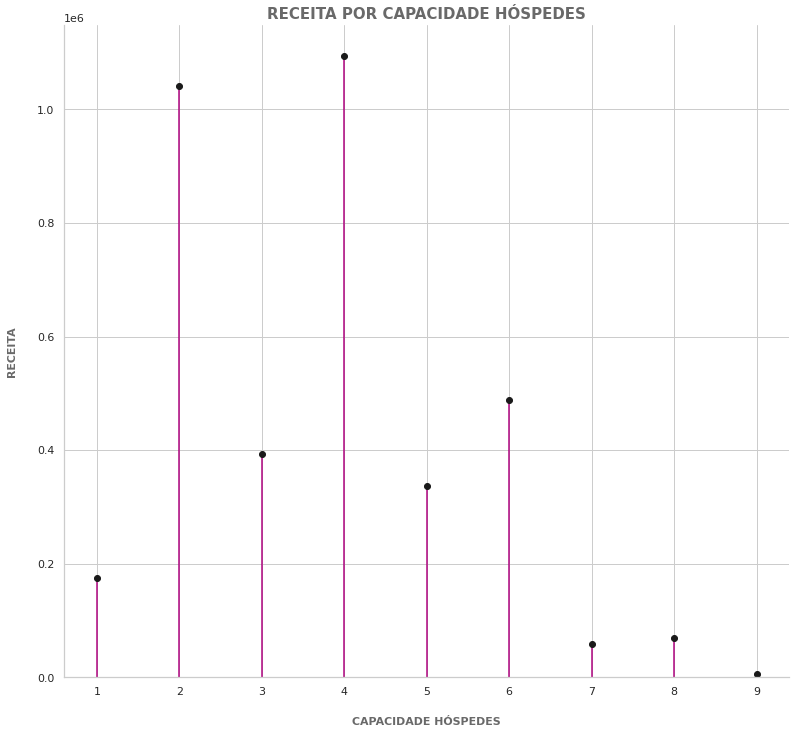

In [272]:
# Gráfico receita total por Capacidade hóspedes

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rchd['capacidade_hospedes'], ymin=0, ymax=rchd['preco'], color='#ae017e')
  
axes.plot(rchd['capacidade_hospedes'], rchd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR CAPACIDADE HÓSPEDES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

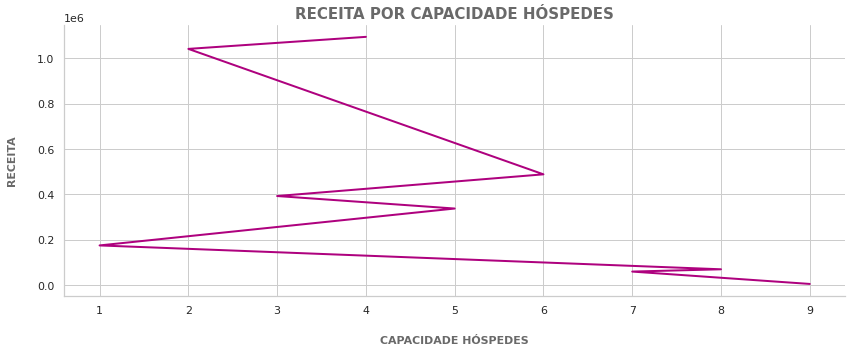

In [273]:
# Gráfico receita total por capacidade de hóspedes
plt.figure(figsize=(14,5))
plt.plot(rchd['capacidade_hospedes'], rchd['preco'], color='#ae017e', linewidth = '2')
sns.despine()
plt.title('RECEITA POR CAPACIDADE HÓSPEDES', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CAPACIDADE HÓSPEDES', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Acomodações com capacidade de 2 e 4 hóspedes são as mais usuais e possuem maior receita

- O preço médio tende a aumentar conforme a capacidade de hóspedes também aumenta


Coluna "convidados_inclusos"

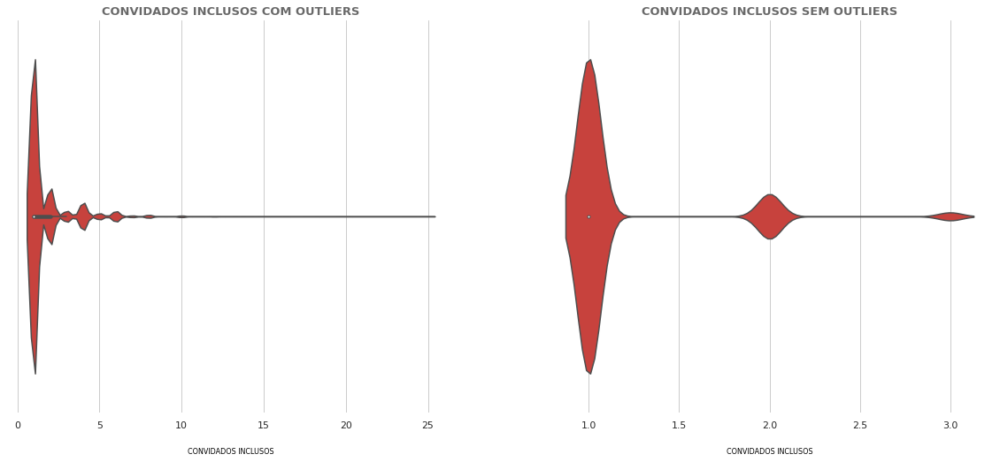

In [274]:
# Gráfico convidados inclusos antes e depois da remoção de outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['convidados_inclusos'], data=df_l, color='#de2d26')


plt.title('CONVIDADOS INCLUSOS COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('CONVIDADOS INCLUSOS', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['convidados_inclusos'], data=df_t, color='#de2d26')


plt.title('CONVIDADOS INCLUSOS SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('CONVIDADOS INCLUSOS', color = 'black', labelpad = 20, fontsize = 8);

In [275]:
# Breve resumo estatístico convidados inclusos
df_t['convidados_inclusos'].describe().T

count    12326.000000
mean         1.165098
std          0.425841
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          3.000000
Name: convidados_inclusos, dtype: float64

In [276]:
# Frequência convidados inclusos
df_t['convidados_inclusos'].value_counts()

1    10559
2     1499
3      268
Name: convidados_inclusos, dtype: int64

In [277]:
# Frequência convidados inclusos em termos de porcentagem
round(df_t['convidados_inclusos'].value_counts(normalize=True) * 100)

1    86.0
2    12.0
3     2.0
Name: convidados_inclusos, dtype: float64

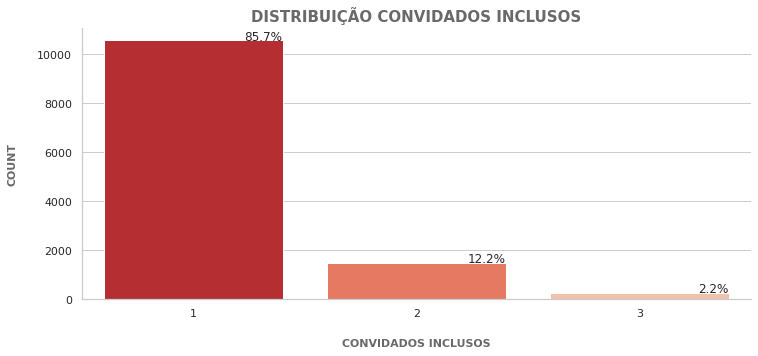

In [278]:
# Gráfico Distribuição Convidados inclusos
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='convidados_inclusos', data=df_t, palette='Reds_r', order = df_t['convidados_inclusos'].value_counts().index)
sns.despine()
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.title('DISTRIBUIÇÃO CONVIDADOS INCLUSOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

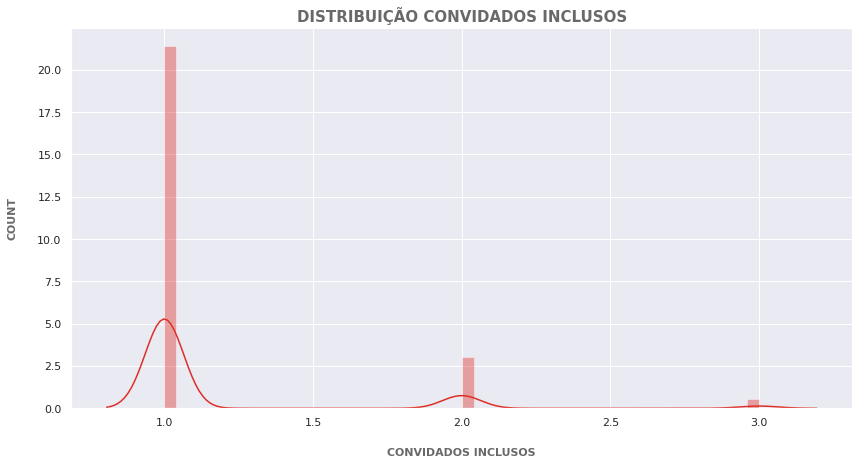

In [279]:
# Distribuição convidados inclusos
sns.set(style='darkgrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['convidados_inclusos'], color='#de2d26')
plt.title('DISTRIBUIÇÃO CONVIDADOS INCLUSOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [280]:
# Descrição estatística do preço por convidados inclusos
df_t.groupby('convidados_inclusos')['preco'].describe().round(2).T

convidados_inclusos,1,2,3
count,10559.00,1499.00,268.00
mean,309.53,216.87,255.41
std,247.83,135.84,135.84
min,29.00,42.00,50.00
25%,122.00,126.00,158.00
50%,218.00,181.00,222.50
75%,407.00,260.00,298.00
max,1134.00,999.00,802.00


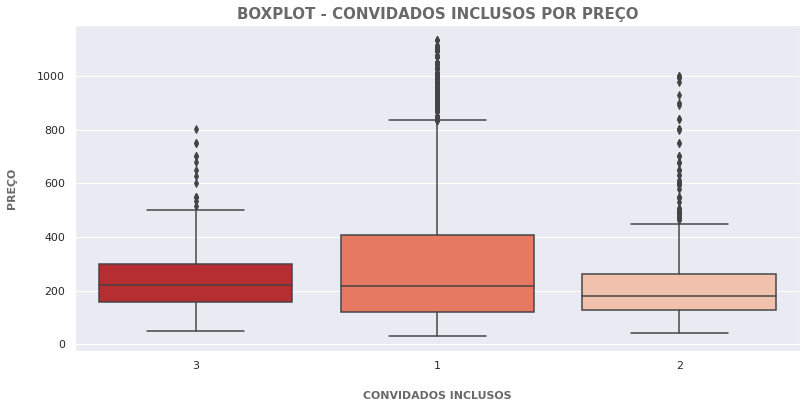

In [281]:
# Boxplot preço por Convidados inclusos

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='convidados_inclusos', y='preco', palette='Reds_r', order = df_t.groupby(["convidados_inclusos"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - CONVIDADOS INCLUSOS POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [282]:
# Média de preço por Convidados inclusos
df_t.groupby(['convidados_inclusos'])['preco'].mean().round(2).sort_values(ascending=False)

convidados_inclusos
1    309.53
3    255.41
2    216.87
Name: preco, dtype: float64

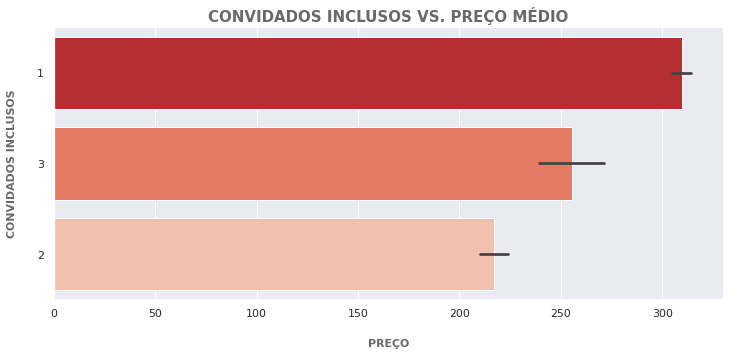

In [283]:
# Gráfico preço médio por Convidados inclusos

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'convidados_inclusos', orient = "h", data=df_t, palette='Reds_r', order = df_t.groupby(["convidados_inclusos"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('CONVIDADOS INCLUSOS VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [284]:
# Correlação entre a quantidade de convidados inclusos e preço
df_t['convidados_inclusos'].corr(df_t['preco']).round(2)

-0.11

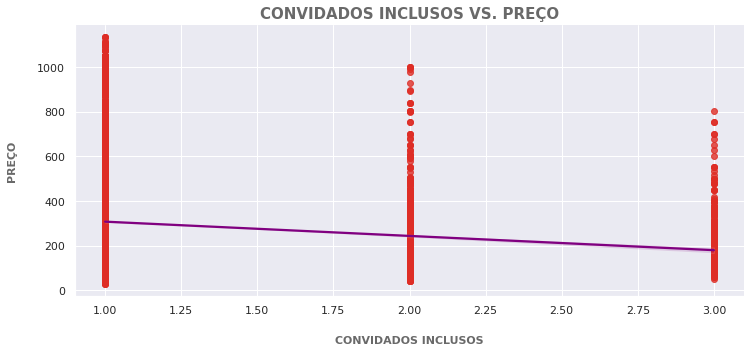

In [285]:
# Gráfico convidados inclusos vs. preço

plt.figure(figsize=(12,5))
sns.regplot(x="convidados_inclusos", y="preco", data=df_t,  scatter_kws = {'color': '#de2d26'}, line_kws = {'color': 'purple'})
sns.despine()
plt.title('CONVIDADOS INCLUSOS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [286]:
# Tabela analítica receita convidados inclusos
rci = df_t.groupby(by=['convidados_inclusos']).sum()['preco'].reset_index() # receita convidados inclusos(rci)
rci.head()

,convidados_inclusos,preco
0,1,3268371.0
1,2,325088.0
2,3,68450.0


In [287]:
# Tabela analítica receita convidados inclusos em ordem decrescente
rcid = rci.sort_values('preco', ascending=False) # receita convidados inclusos em ordem decrescente(rcid)
rcid.head()

,convidados_inclusos,preco
0,1,3268371.0
1,2,325088.0
2,3,68450.0


<Figure size 720x720 with 0 Axes>

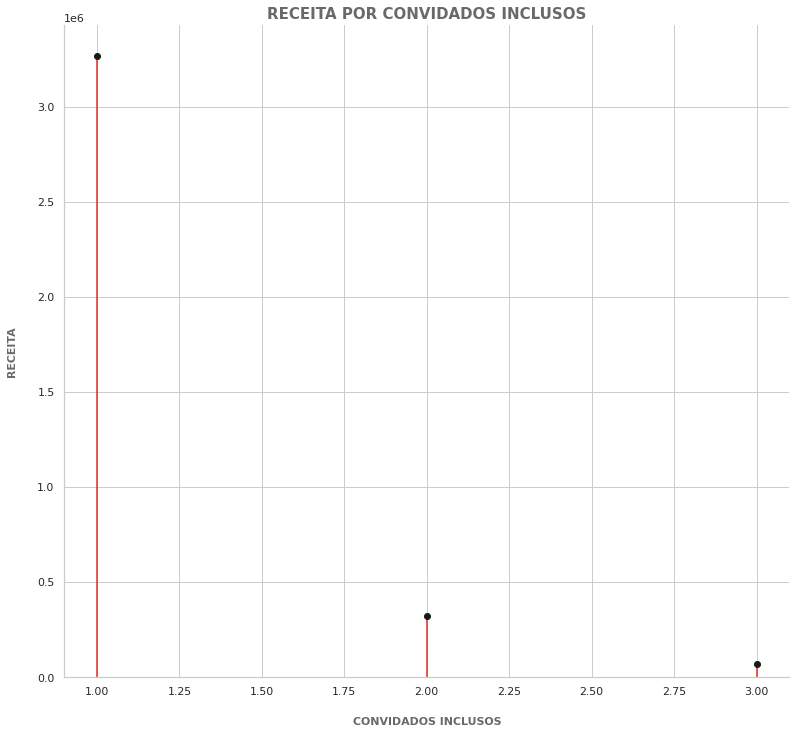

In [288]:
# Gráfico receita total por Convidados inclusos

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rcid['convidados_inclusos'], ymin=0, ymax=rcid['preco'], color='#de2d26')
  
axes.plot(rcid['convidados_inclusos'], rcid['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR CONVIDADOS INCLUSOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

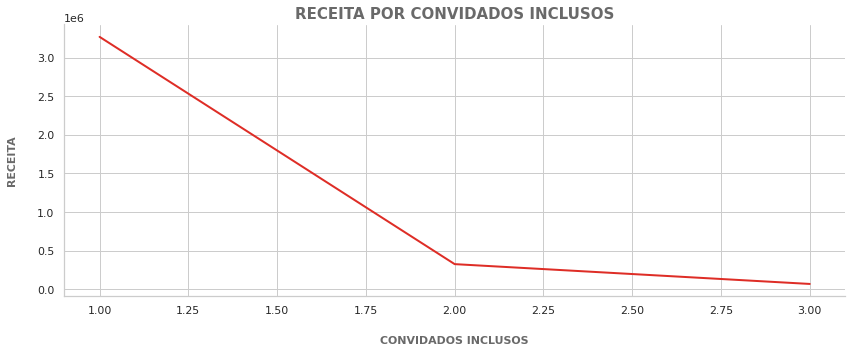

In [289]:
# Gráfico receita total por convidados inclusos
plt.figure(figsize=(14,5))
plt.plot(rcid['convidados_inclusos'], rcid['preco'], color='#de2d26', linewidth = '2')
sns.despine()
plt.title('RECEITA POR CONVIDADOS INCLUSOS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('CONVIDADOS INCLUSOS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

Acomodações com apenas um convidado incluso são as mais presentes, com maior preço médio e faturamento

# 8- Acomodações com reserva instantânea apresentam maior ganho? Qual o número de pernoites mais ofertado?

Coluna "reserva_instantanea"

In [290]:
# Breve resumo estatístico reserva instantânea
df_t['reserva_instantanea'].describe().T

count     12326
unique        2
top           f
freq       7358
Name: reserva_instantanea, dtype: object

In [291]:
# Frequência reserva instantânea
df_t['reserva_instantanea'].value_counts()

f    7358
t    4968
Name: reserva_instantanea, dtype: int64

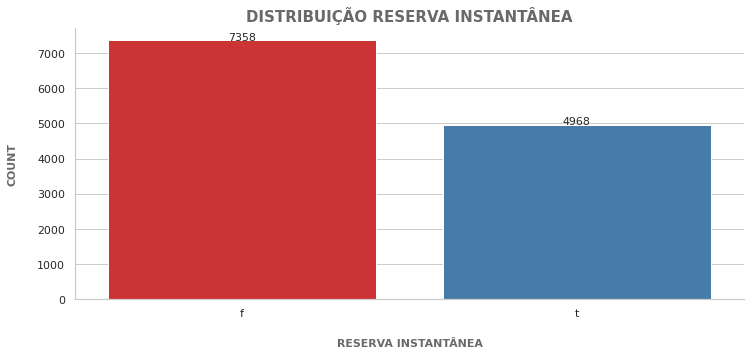

In [292]:
# Gráfico Distribuição Reserva instantânea
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

ax = sns.countplot(x='reserva_instantanea', data=df_t, palette='Set1', order = df_t['reserva_instantanea'].value_counts().index)
sns.despine()
for p in ax.patches:
    ax.text (p.get_x() + p.get_width()  / 2, p.get_height()+ 0.75, p.get_height(), horizontalalignment='center', fontsize = 11)
plt.title('DISTRIBUIÇÃO RESERVA INSTANTÂNEA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('RESERVA INSTANTÂNEA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [293]:
# Frequência reserva instantânea em termos de porcentagem
round(df_t['reserva_instantanea'].value_counts(normalize=True) * 100)

f    60.0
t    40.0
Name: reserva_instantanea, dtype: float64

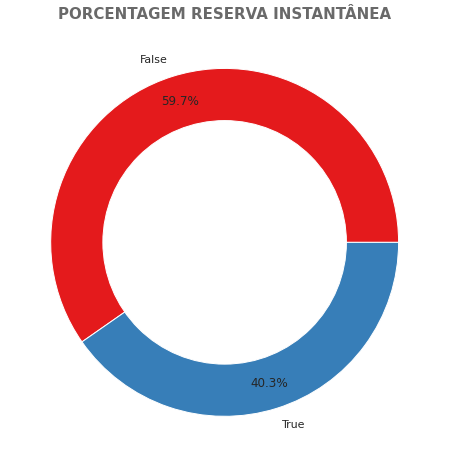

In [294]:
# Distribuição superhost em termos de porcentagem

plt.figure(figsize=(8,8))
# Rótulos para legenda
Legendas = ['False', 'True']
  
# Valores
valores = df_t['reserva_instantanea'].value_counts()
  
# Configurando o gráfico
plt.pie(valores, colors=['#e41a1c', '#377eb8'], labels=Legendas,
        autopct='%1.1f%%', pctdistance=0.85,)
  
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
fig.gca().add_artist(centre_circle)
plt.title('PORCENTAGEM RESERVA INSTANTÂNEA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show();

In [295]:
# Descrição estatística do preço por reserva instantânea
df_t.groupby('reserva_instantanea')['preco'].describe().round(2).T

reserva_instantanea,f,t
count,7358.00,4968.00
mean,310.52,277.19
std,240.69,230.24
min,29.00,29.00
25%,130.00,109.00
50%,231.00,202.00
75%,399.00,348.00
max,1117.00,1134.00


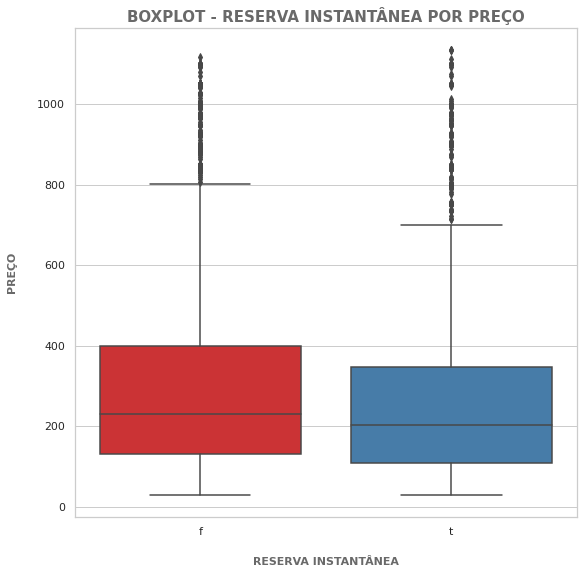

In [296]:
# Boxplot Reserva instantânea

# Plot
plt.figure(figsize = (9,9))
sns.boxplot(data=df_t, x='reserva_instantanea', y='preco', palette='Set1', order = df_t.groupby(["reserva_instantanea"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - RESERVA INSTANTÂNEA POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('RESERVA INSTANTÂNEA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

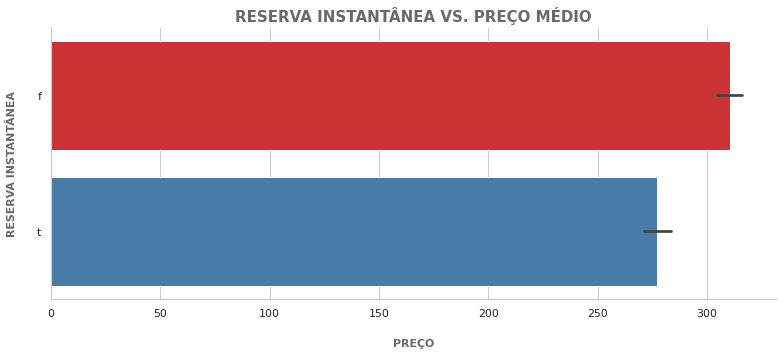

In [297]:
# Gráfico preço médio por reserva intantânea

# Plot
plt.figure(figsize = (13,5))

sns.barplot(x = 'preco', y = 'reserva_instantanea', orient = "h", data=df_t, palette = 'Set1', order = df_t.groupby(["reserva_instantanea"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('RESERVA INSTANTÂNEA VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RESERVA INSTANTÂNEA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [298]:
# Tabela analítica receita por reserva instantânea
rri = df_t.groupby(by=['reserva_instantanea']).sum()['preco'].reset_index() # receita por reserva instantânea(rri)
rri.head()

,reserva_instantanea,preco
0,f,2284806.0
1,t,1377103.0


In [299]:
# Tabela analítica receita por reserva instantânea em ordem decrescente
rrid = rri.sort_values('preco', ascending=False) # receita por reserva instantânea em ordem decrescente(rrid)
rrid.head()

,reserva_instantanea,preco
0,f,2284806.0
1,t,1377103.0


<Figure size 720x720 with 0 Axes>

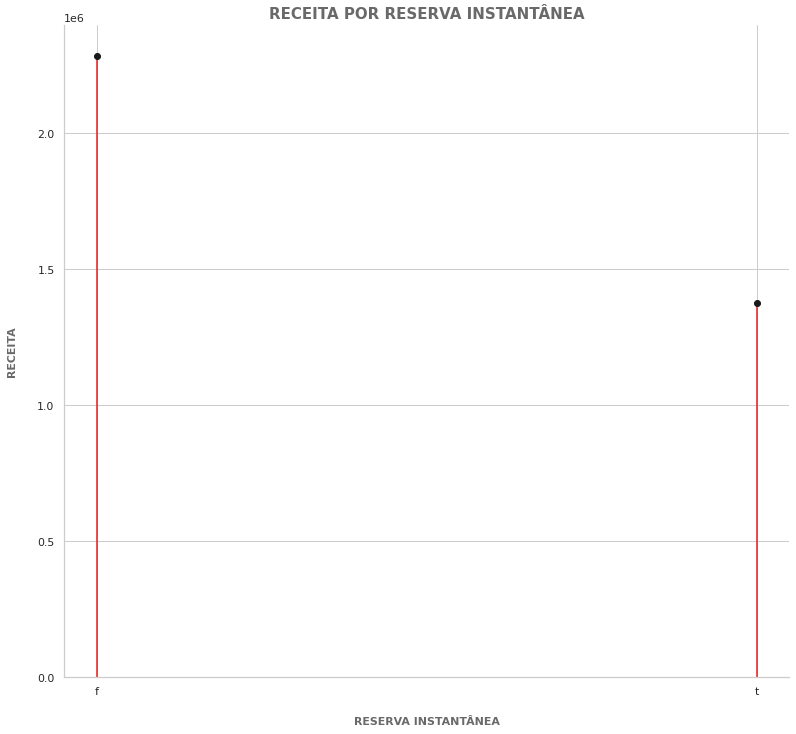

In [300]:
# Gráfico receita total por reserva instantânea

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rrid['reserva_instantanea'], ymin=0, ymax=rrid['preco'], color='#e41a1c')
  
axes.plot(rrid['reserva_instantanea'], rrid['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR RESERVA INSTANTÂNEA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('RESERVA INSTANTÂNEA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

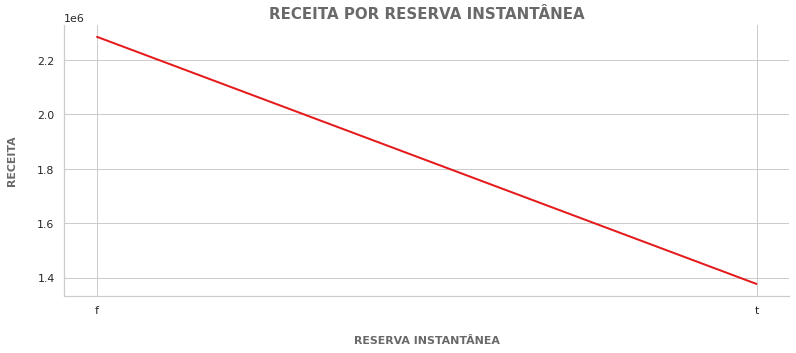

In [301]:
# Gráfico receita total por reserva instantânea
plt.figure(figsize=(13,5))
plt.plot(rrid['reserva_instantanea'], rrid['preco'], color='#e41a1c', linewidth = '2')
sns.despine()
plt.title('RECEITA POR RESERVA INSTANTÂNEA', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('RESERVA INSTANTÂNEA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Mais da metade das acomodações não possuem reserva instantânea
- Acomodações com reserva instantânea têm uma receita total menor 
- Não existe uma diferença expressiva entre o preço médio em acomodações que possuem reserva instantânea de acomodações que não possuem reserva instantânea

Coluna "minimo_pernoite"

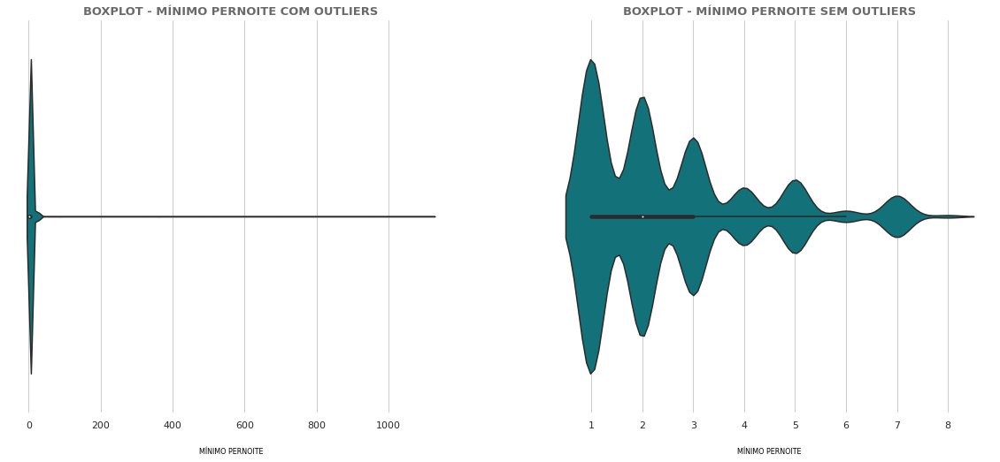

In [302]:
# Gráfico número mínimo pernoite antes e depois da remoção de outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['minimo_pernoite'], data=df_l, color='#02818a')


plt.title('BOXPLOT - MÍNIMO PERNOITE COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('MÍNIMO PERNOITE', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['minimo_pernoite'], data=df_t, color='#02818a')


plt.title('BOXPLOT - MÍNIMO PERNOITE SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('MÍNIMO PERNOITE', color = 'black', labelpad = 20, fontsize = 8);

In [303]:
# Breve resumo estatístico número mínimo pernoite
df_t['minimo_pernoite'].describe().T

count    12326.000000
mean         2.497485
std          1.651833
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          8.000000
Name: minimo_pernoite, dtype: float64

In [304]:
# Frequência número mínimo pernoite
df_t['minimo_pernoite'].value_counts()

1    4311
2    3297
3    2159
5    1009
4     791
7     569
6     155
8      35
Name: minimo_pernoite, dtype: int64

In [305]:
# Frequência número mínimo pernoite em termos de porcentagem
round(df_t['minimo_pernoite'].value_counts(normalize=True) * 100)

1    35.0
2    27.0
3    18.0
5     8.0
4     6.0
7     5.0
6     1.0
8     0.0
Name: minimo_pernoite, dtype: float64

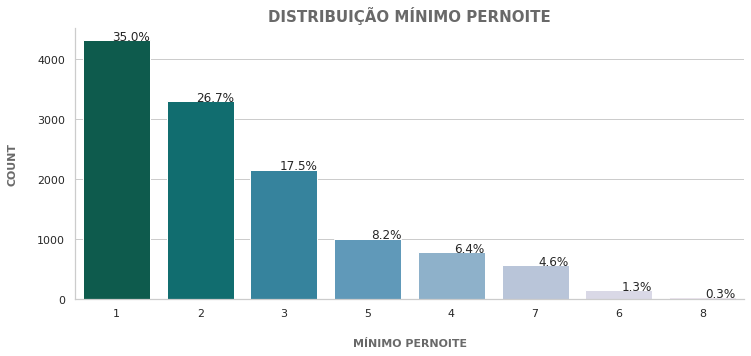

In [306]:
# Gráfico distribuição número mínimo de pernoite 
sns.set(style="whitegrid")
plt.figure(figsize=(12,5))

total = float(df_t.shape[0])

ax = sns.countplot(x='minimo_pernoite', data=df_t, palette='PuBuGn_r', order = df_t['minimo_pernoite'].value_counts().index)
sns.despine()
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.title('DISTRIBUIÇÃO MÍNIMO PERNOITE', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

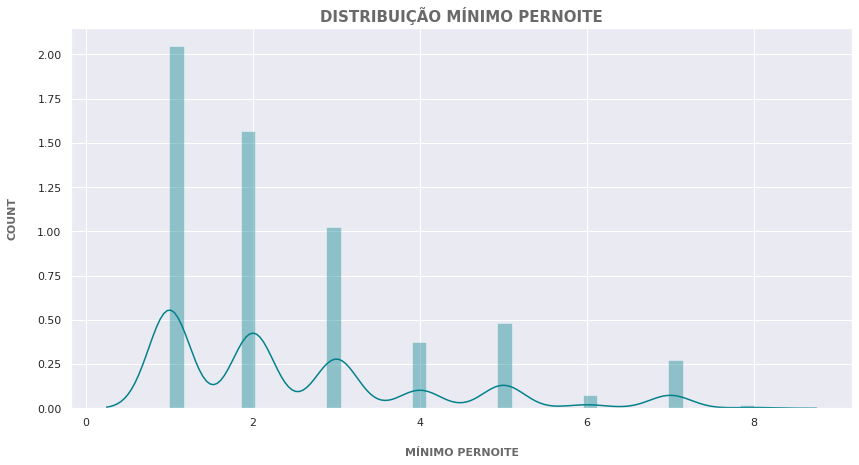

In [307]:
# Distribuição número mínimo pernoite
sns.set(style='darkgrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['minimo_pernoite'], color='#02818a')
plt.title('DISTRIBUIÇÃO MÍNIMO PERNOITE', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [308]:
# Descrição estatística do preço por número mínimo de pernoite
df_t.groupby('minimo_pernoite')['preco'].describe().round(2).T

minimo_pernoite,1,2,3,4,5,6,7,8
count,4311.00,3297.00,2159.00,791.00,1009.00,155.00,569.00,35.00
mean,271.21,256.77,300.65,360.82,397.14,407.94,410.62,400.74
std,241.78,191.57,216.17,256.26,266.28,280.17,294.44,305.06
min,29.00,34.00,29.00,46.00,38.00,46.00,38.00,59.00
25%,101.00,122.00,151.00,162.00,189.00,151.00,155.00,151.00
50%,181.00,202.00,239.00,290.00,323.00,348.00,348.00,298.00
75%,348.00,323.00,399.00,500.00,550.00,585.50,600.00,588.00
max,1117.00,1100.00,1134.00,1100.00,1100.00,1050.00,1134.00,1050.00


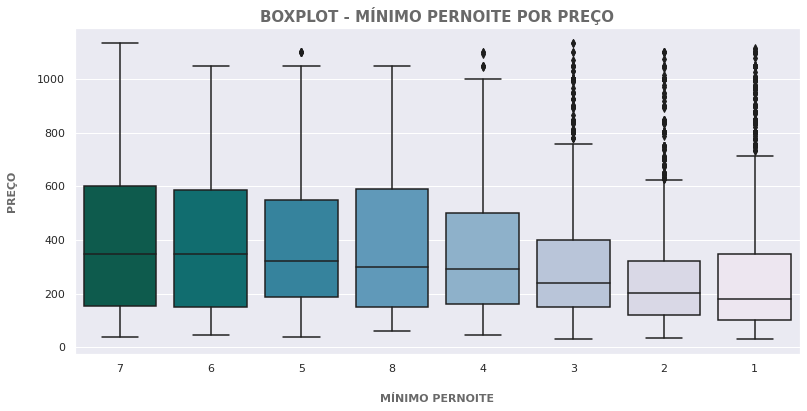

In [309]:
# Boxplot preço por Mínimo pernoite

# Plot
plt.figure(figsize = (13,6))
sns.boxplot(data=df_t, x='minimo_pernoite', y='preco', palette='PuBuGn_r', order = df_t.groupby(["minimo_pernoite"])["preco"].median().sort_values(ascending=False).index)
plt.title('BOXPLOT - MÍNIMO PERNOITE POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [310]:
# Média de preço por Mínimo pernoite
df_t.groupby(['minimo_pernoite'])['preco'].mean().round(2).sort_values(ascending=False)

minimo_pernoite
7    410.62
6    407.94
8    400.74
5    397.14
4    360.82
3    300.65
1    271.21
2    256.77
Name: preco, dtype: float64

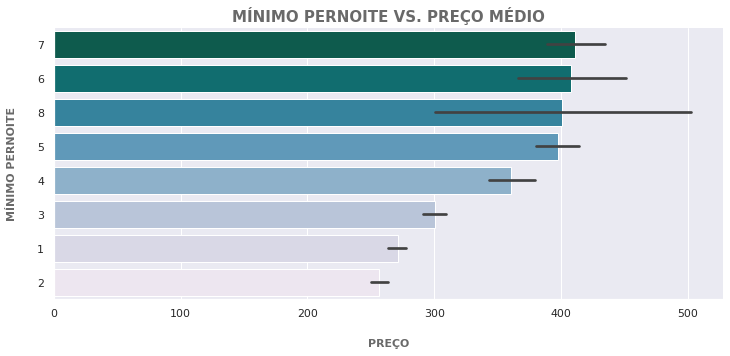

In [311]:
# Gráfico preço médio por Convidados inclusos

# Plot
plt.figure(figsize = (12,5))

sns.barplot(x = 'preco', y = 'minimo_pernoite', orient = "h", data=df_t, palette='PuBuGn_r', order = df_t.groupby(["minimo_pernoite"])["preco"].mean().sort_values(ascending=False).index)
sns.despine()
plt.title('MÍNIMO PERNOITE VS. PREÇO MÉDIO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [312]:
# Correlação entre número mínimo de pernoite e preço
df_t['minimo_pernoite'].corr(df_t['preco']).round(2)

0.19

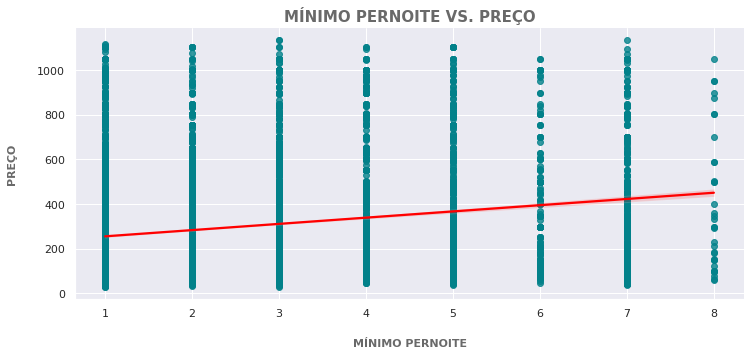

In [313]:
# Gráfico número mínimo pernoite vs. preço

plt.figure(figsize=(12,5))
sns.regplot(x="minimo_pernoite", y="preco", data=df_t, scatter_kws = {'color': '#02818a'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('MÍNIMO PERNOITE VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [314]:
# Tabela analítica receita número mínimo pernoite
rmp = df_t.groupby(by=['minimo_pernoite']).sum()['preco'].reset_index() # receita mínimo pernoite(rmp)
rmp.head()

,minimo_pernoite,preco
0,1,1169201.0
1,2,846576.0
2,3,649108.0
3,4,285408.0
4,5,400719.0


In [315]:
# Tabela analítica receita número mínimo pernoite em ordem decrescente
rmpd = rmp.sort_values('preco', ascending=False) # receita mínimo pernoite em ordem decrescente(rmpd)
rmpd.head()

,minimo_pernoite,preco
0,1,1169201.0
1,2,846576.0
2,3,649108.0
4,5,400719.0
3,4,285408.0


<Figure size 720x720 with 0 Axes>

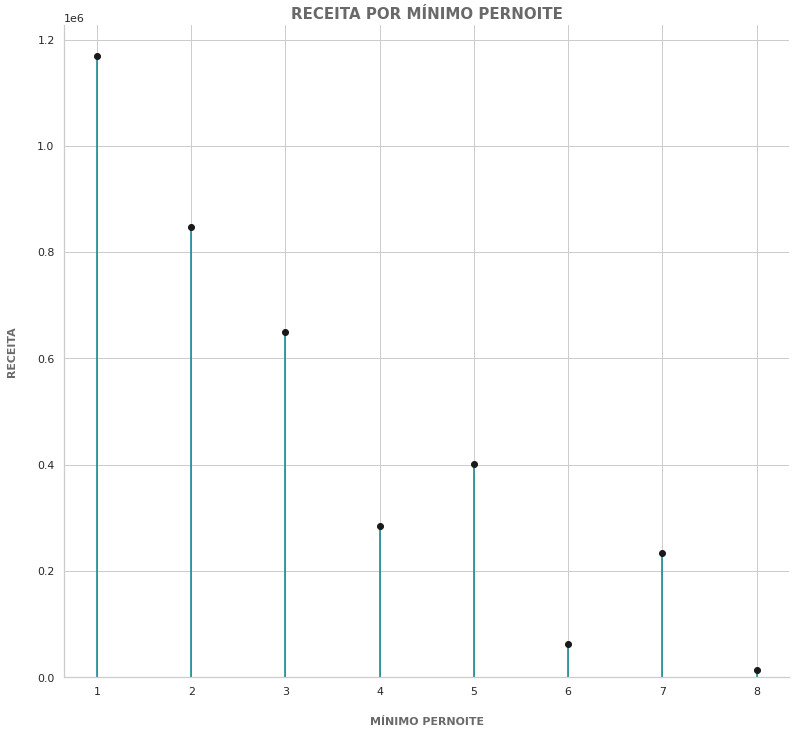

In [316]:
# Gráfico receita total por Mínimo pernoite

sns.set(style="whitegrid")
plt.figure(figsize=(10,10))

fig, axes = plt.subplots()
axes.vlines(rmpd['minimo_pernoite'], ymin=0, ymax=rmpd['preco'], color='#02818a')
  
axes.plot(rmpd['minimo_pernoite'], rmpd['preco'], "o", color='k')
axes.set_ylim(0)
sns.despine()
plt.title('RECEITA POR MÍNIMO PERNOITE', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

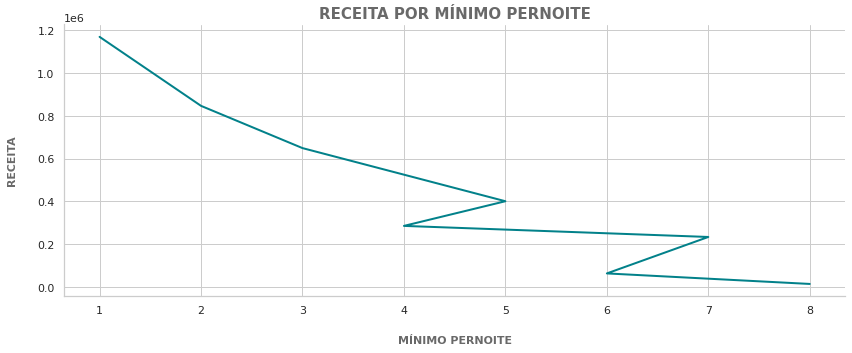

In [317]:
# Gráfico receita total número mínimo pernoite
plt.figure(figsize=(14,5))
plt.plot(rmpd['minimo_pernoite'], rmpd['preco'], color='#02818a', linewidth='2')
sns.despine()
plt.title('RECEITA POR MÍNIMO PERNOITE', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('MÍNIMO PERNOITE', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**ALGUMAS CONCLUSÕES:**

- Acomodações com menor número de pernoites são as mais ofertadas e as que possuem maior renda total 

- O preço médio tem uma certa propensão em aumentar conforme o número de pernoites também aumenta

# 9- Qual a proporção de acomodações que oferecem o serviço de hóspedes extras? E qual o preço médio?

Coluna "preco_hospedes_extras"

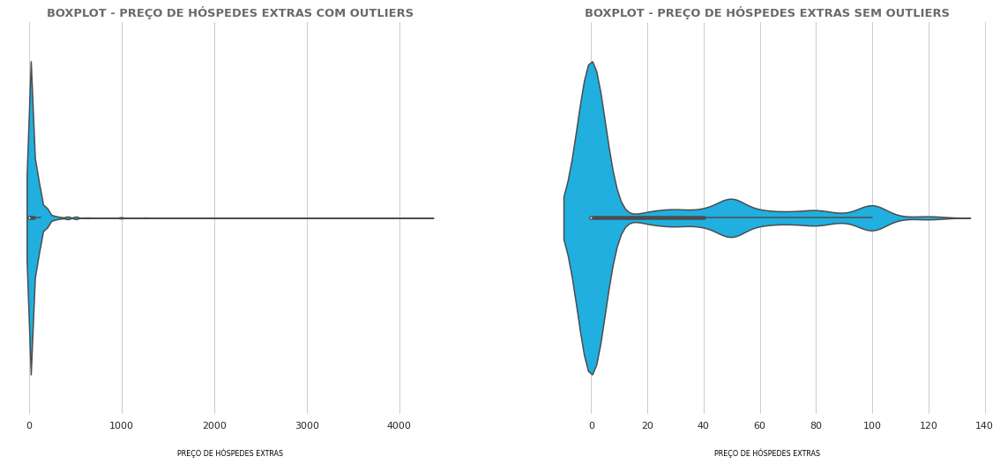

In [318]:
# Gráfico preço de hóspedes extras antes e depois da remoção de outliers

# Plot gráfico 1

plt.figure(figsize=(20,18))

plt.subplot(2, 2, 1)
sns.violinplot(df_l['preco_hospedes_extras'], data=df_l, color='deepskyblue')


plt.title('BOXPLOT - PREÇO DE HÓSPEDES EXTRAS COM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('PREÇO DE HÓSPEDES EXTRAS', color = 'black', labelpad = 20, fontsize = 8)

# Plot gráfico 2

plt.subplot(2, 2, 2)
sns.violinplot(df_t['preco_hospedes_extras'], data=df_t, color='deepskyblue')


plt.title('BOXPLOT - PREÇO DE HÓSPEDES EXTRAS SEM OUTLIERS',
         fontsize = 13, color ='dimgrey', fontweight = 'bold')

sns.despine(bottom = True, left=True)
plt.xlabel('PREÇO DE HÓSPEDES EXTRAS', color = 'black', labelpad = 20, fontsize = 8);


In [319]:
# Breve resumo estatístico preço hóspedes extras
df_t['preco_hospedes_extras'].describe().T

count    12326.000000
mean        19.405403
std         32.451472
min          0.000000
25%          0.000000
50%          0.000000
75%         40.000000
max        125.000000
Name: preco_hospedes_extras, dtype: float64

In [320]:
# Descrição estatística do preço por preço de hóspedes extras
df_t.groupby('preco_hospedes_extras')['preco'].describe().round(2).T

preco_hospedes_extras,0.0,10.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,90.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,105.0,107.0,109.0,110.0,111.0,113.0,114.0,116.0,118.0,120.0,122.0,125.0
count,8479.00,1.0,1.0,2.00,2.00,3.00,25.00,126.00,56.00,3.00,7.00,1.0,103.00,2.00,1.0,6.00,4.00,273.00,2.00,3.00,4.00,5.00,65.00,1.0,5.00,5.00,7.00,229.00,3.00,32.00,3.00,5.00,66.00,16.00,3.00,4.00,18.00,852.00,2.00,3.0,4.00,3.00,32.00,4.00,1.0,2.00,4.00,233.00,1.0,31.00,7.00,45.00,2.00,4.00,2.00,3.00,183.00,3.00,2.00,1.0,4.00,71.00,2.00,2.0,1.0,10.00,261.00,1.0,7.00,57.00,15.00,1.0,3.00,5.00,95.00,16.00,1.0,9.00,2.00,1.0,8.00,16.00,604.00,2.00,4.00,25.00,1.0,4.00,17.00,1.0,1.0,1.0,1.0,2.00,72.00,2.00,6.00
mean,345.66,298.0,218.0,115.50,166.00,99.33,149.16,128.49,134.95,86.67,146.29,80.0,148.56,63.00,42.0,87.50,75.50,137.69,65.00,79.67,89.25,132.60,138.42,59.0,145.40,111.80,189.00,140.59,113.33,177.53,126.00,74.00,125.76,250.38,152.33,259.00,207.67,189.39,262.00,50.0,119.50,116.00,107.66,274.00,151.0,109.00,269.75,146.11,298.0,167.19,150.57,162.38,153.50,115.50,270.50,261.67,170.20,67.33,115.50,76.0,151.00,196.15,157.50,101.0,151.0,167.20,213.77,155.0,207.29,243.25,185.93,101.0,453.33,222.60,231.66,176.81,105.0,202.56,340.00,101.0,183.25,189.50,269.51,222.50,196.50,338.08,298.0,286.25,192.18,290.0,202.0,97.0,374.0,197.50,285.82,365.50,252.67
std,254.82,NaN,NaN,50.20,62.23,17.21,137.57,84.67,107.86,34.30,91.89,NaN,96.70,35.36,NaN,52.99,28.41,100.58,21.21,15.01,36.02,72.02,100.58,NaN,130.47,44.08,160.71,99.45,42.67,128.36,75.72,25.44,100.24,174.69,136.31,144.26,207.45,135.66,91.92,0.0,119.84,104.07,67.83,287.88,NaN,70.71,127.51,97.71,NaN,86.07,106.87,118.55,109.60,38.67,306.18,157.06,112.19,30.37,62.93,NaN,70.25,149.29,103.94,29.7,NaN,149.15,152.09,NaN,73.52,139.46,94.67,NaN,120.02,231.92,183.60,105.82,NaN,107.82,183.85,NaN,94.37,106.41,172.03,177.48,152.00,244.68,NaN,164.14,64.01,NaN,NaN,NaN,NaN,6.36,167.52,219.91,141.04
min,29.00,298.0,218.0,80.00,122.00,80.00,46.00,38.00,42.00,63.00,71.00,80.0,42.00,38.00,42.0,38.00,46.00,42.00,50.00,71.00,59.00,50.00,38.00,59.0,71.00,59.00,38.00,34.00,67.00,42.00,42.00,46.00,34.00,84.00,46.00,46.00,50.00,42.00,197.00,50.0,50.00,42.00,42.00,80.00,151.0,59.00,101.00,42.00,298.0,50.00,71.00,55.00,76.00,67.00,54.00,84.00,42.00,42.00,71.00,76.0,92.00,59.00,84.00,80.0,151.0,63.00,46.00,155.0,84.00,59.00,88.00,101.0,348.00,71.00,50.00,67.00,105.0,88.00,210.00,101.0,97.00,42.00,42.00,97.00,88.00,50.00,298.0,164.00,88.00,290.0,202.0,97.0,374.0,193.00,71.00,210.00,97.00
25%,151.00,298.0,218.0,97.75,144.00,92.50,71.00,75.25,71.00,67.00,90.50,80.0,82.00,50.50,42.0,52.50,55.75,80.00,57.50,71.00,65.00,88.00,67.00,59.0,84.00,80.00,88.00,80.00,94.50,73.00,94.50,59.00,64.00,145.00,75.50,232.00,81.00,101.00,229.50,50.0,50.00,56.50,55.00,117.50,151.0,84.00,214.25,80.00,298.0,126.00,88.50,84.00,114.75,98.50,162.25,201.50,88.00,50.50,93.25,76.0,92.00,107.00,120.75,90.5,151.0,64.00,109.00,155.0,176.00,147.00,99.00,101.0,388.00,88.00,101.00,67.00,105.0,97.00,275.00,101.0,130.00,122.00,151.00,159.75,97.75,147.00,298.0,170.00,155.00,290.0,202.0,97.0,374.0,195.25,151.00,287.75,190.00
50%,269.00,298.0,218.0,115.50,166.00,105.00,101.00,101.00,107.00,71.00,105.00,80.0,122.00,63.00,42.0,86.00,73.50,109.00,65.00,71.00,79.50,109.00,101.00,59.0,97.00,109.00,151.00,113.00,122.00,145.00,147.00,63.00,97.00,210.00,105.00,321.00,105.00,151.00,262.00,50.0,65.00,71.00,90.00,157.50,151.0,109.00,289.50,118.00,298.0,134.00,126.00,134.00,153.50,117.50,270.50,319.00,139.00,59.00,115.50,76.0,140.50,151.00,157.50,101.0,151.0,101.00,168.00,155.0,193.00,210.00,122.00,101.0,428.00,143.00,180.00,184.50,105.0,252.00,340.00,101.0,16

In [321]:
# Frequência de preços de hóspedes extras
df_t['preco_hospedes_extras'].value_counts()

0.0      8479
50.0      852
100.0     604
30.0      273
80.0      261
60.0      233
40.0      229
70.0      183
20.0      126
25.0      103
90.0       95
120.0      72
75.0       71
45.0       66
35.0       65
84.0       57
21.0       56
65.0       45
55.0       32
42.0       32
63.0       31
19.0       25
105.0      25
49.0       18
110.0      17
93.0       16
46.0       16
99.0       16
85.0       15
79.0       10
95.0        9
98.0        8
23.0        7
83.0        7
64.0        7
39.0        7
125.0       6
28.0        6
44.0        5
38.0        5
37.0        5
34.0        5
88.0        5
109.0       4
74.0        4
29.0        4
59.0        4
48.0        4
56.0        4
33.0        4
67.0        4
53.0        4
102.0       4
54.0        3
18.0        3
43.0        3
41.0        3
47.0        3
87.0        3
69.0        3
71.0        3
22.0        3
32.0        3
52.0        3
58.0        2
16.0        2
96.0        2
51.0        2
77.0        2
122.0       2
31.0        2
17.0  

In [322]:
# Frequência de preços de hóspedes extras em termos de porcentagem
round(df_t['preco_hospedes_extras'].value_counts(normalize=True) * 100)

0.0      69.0
50.0      7.0
100.0     5.0
30.0      2.0
80.0      2.0
60.0      2.0
40.0      2.0
70.0      1.0
20.0      1.0
25.0      1.0
90.0      1.0
120.0     1.0
75.0      1.0
45.0      1.0
35.0      1.0
84.0      0.0
21.0      0.0
65.0      0.0
55.0      0.0
42.0      0.0
63.0      0.0
19.0      0.0
105.0     0.0
49.0      0.0
110.0     0.0
93.0      0.0
46.0      0.0
99.0      0.0
85.0      0.0
79.0      0.0
95.0      0.0
98.0      0.0
23.0      0.0
83.0      0.0
64.0      0.0
39.0      0.0
125.0     0.0
28.0      0.0
44.0      0.0
38.0      0.0
37.0      0.0
34.0      0.0
88.0      0.0
109.0     0.0
74.0      0.0
29.0      0.0
59.0      0.0
48.0      0.0
56.0      0.0
33.0      0.0
67.0      0.0
53.0      0.0
102.0     0.0
54.0      0.0
18.0      0.0
43.0      0.0
41.0      0.0
47.0      0.0
87.0      0.0
69.0      0.0
71.0      0.0
22.0      0.0
32.0      0.0
52.0      0.0
58.0      0.0
16.0      0.0
96.0      0.0
51.0      0.0
77.0      0.0
122.0     0.0
31.0      0.0
17.0  

In [323]:
# Receita por preço hóspedes extras
df_t.groupby(['preco_hospedes_extras'])['preco'].sum().sort_values(ascending=False)

preco_hospedes_extras
0.0      2930862.0
100.0     162783.0
50.0      161362.0
80.0       55793.0
30.0       37589.0
60.0       34043.0
40.0       32195.0
70.0       31147.0
90.0       22008.0
120.0      20579.0
20.0       16190.0
25.0       15302.0
75.0       13927.0
84.0       13865.0
35.0        8997.0
105.0       8452.0
45.0        8300.0
21.0        7557.0
65.0        7307.0
42.0        5681.0
63.0        5183.0
46.0        4006.0
49.0        3738.0
19.0        3729.0
55.0        3445.0
110.0       3267.0
99.0        3032.0
93.0        2829.0
85.0        2789.0
95.0        1823.0
79.0        1672.0
125.0       1516.0
98.0        1466.0
83.0        1451.0
87.0        1360.0
39.0        1323.0
109.0       1145.0
88.0        1113.0
56.0        1096.0
59.0        1079.0
64.0        1054.0
48.0        1036.0
23.0        1024.0
102.0        786.0
69.0         785.0
122.0        731.0
37.0         727.0
96.0         680.0
34.0         663.0
74.0         604.0
38.0         559.0
68.0     

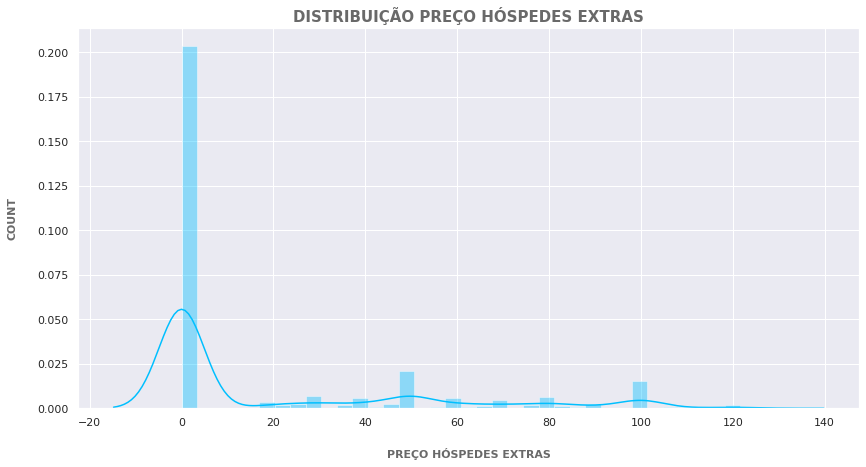

In [324]:
# Distribuição do preço de hóspedes extras
sns.set(style='darkgrid',)
plt.figure(figsize = (14,7))
sns.distplot(df_t['preco_hospedes_extras'], color='deepskyblue')
plt.title('DISTRIBUIÇÃO PREÇO HÓSPEDES EXTRAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO HÓSPEDES EXTRAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('COUNT', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [325]:
# Correlação entre preço e preço de hóspedes extras 
df_t['preco_hospedes_extras'].corr(df_t['preco']).round(2)

-0.22

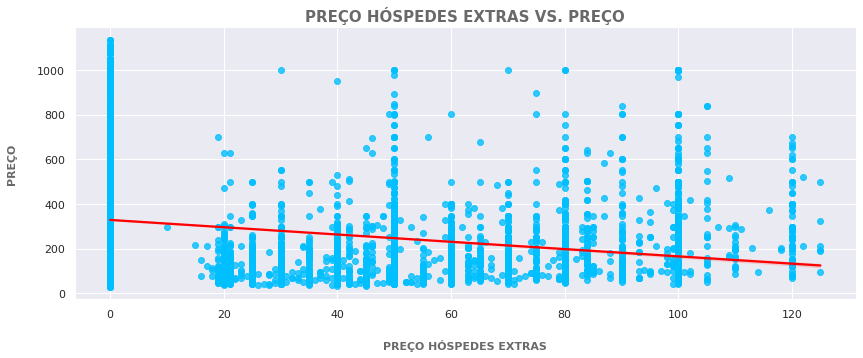

In [326]:
# Gráfico preço hóspedes extras vs. preço

plt.figure(figsize=(14,5))
sns.regplot(x="preco_hospedes_extras", y="preco", data=df_t, scatter_kws = {'color': 'deepskyblue'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('PREÇO HÓSPEDES EXTRAS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO HÓSPEDES EXTRAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

**OBS:** Devido a grande quantidade de preços a zero reais presume-se que a maioria das acomodações não oferecem o serviço de hóspedes extras. Assim, vamos trabalhar apenas com as acomodações que apresentem este serviço.

In [327]:
# Preço hóspedes extras sem R$0
df_phe = df_t[(df_t['preco_hospedes_extras'] != 0)]

In [328]:
# Frequência preço hóspedes extras sem valores a zero reais
df_phe['preco_hospedes_extras'].value_counts()

50.0     852
100.0    604
30.0     273
80.0     261
60.0     233
40.0     229
70.0     183
20.0     126
25.0     103
90.0      95
120.0     72
75.0      71
45.0      66
35.0      65
84.0      57
21.0      56
65.0      45
42.0      32
55.0      32
63.0      31
105.0     25
19.0      25
49.0      18
110.0     17
93.0      16
99.0      16
46.0      16
85.0      15
79.0      10
95.0       9
98.0       8
39.0       7
23.0       7
83.0       7
64.0       7
125.0      6
28.0       6
44.0       5
38.0       5
88.0       5
34.0       5
37.0       5
53.0       4
67.0       4
59.0       4
109.0      4
56.0       4
48.0       4
102.0      4
33.0       4
74.0       4
29.0       4
32.0       3
52.0       3
54.0       3
71.0       3
41.0       3
43.0       3
47.0       3
18.0       3
69.0       3
22.0       3
87.0       3
31.0       2
118.0      2
68.0       2
122.0      2
16.0       2
76.0       2
101.0      2
51.0       2
66.0       2
77.0       2
58.0       2
17.0       2
26.0       2
72.0       2

In [329]:
# Frequência de preços de hóspedes extras sem o valores a zero reais em termos de porcentagem
round(df_phe['preco_hospedes_extras'].value_counts(normalize=True) * 100)

50.0     22.0
100.0    16.0
30.0      7.0
80.0      7.0
60.0      6.0
40.0      6.0
70.0      5.0
20.0      3.0
25.0      3.0
90.0      2.0
120.0     2.0
75.0      2.0
45.0      2.0
35.0      2.0
84.0      1.0
21.0      1.0
65.0      1.0
42.0      1.0
55.0      1.0
63.0      1.0
105.0     1.0
19.0      1.0
49.0      0.0
110.0     0.0
93.0      0.0
99.0      0.0
46.0      0.0
85.0      0.0
79.0      0.0
95.0      0.0
98.0      0.0
39.0      0.0
23.0      0.0
83.0      0.0
64.0      0.0
125.0     0.0
28.0      0.0
44.0      0.0
38.0      0.0
88.0      0.0
34.0      0.0
37.0      0.0
53.0      0.0
67.0      0.0
59.0      0.0
109.0     0.0
56.0      0.0
48.0      0.0
102.0     0.0
33.0      0.0
74.0      0.0
29.0      0.0
32.0      0.0
52.0      0.0
54.0      0.0
71.0      0.0
41.0      0.0
43.0      0.0
47.0      0.0
18.0      0.0
69.0      0.0
22.0      0.0
87.0      0.0
31.0      0.0
118.0     0.0
68.0      0.0
122.0     0.0
16.0      0.0
76.0      0.0
101.0     0.0
51.0      0.0
66.0  

In [330]:
# Correlação entre preço e preço de hóspedes extras sem valores a zero reais
df_phe['preco_hospedes_extras'].corr(df_phe['preco']).round(2)

0.3

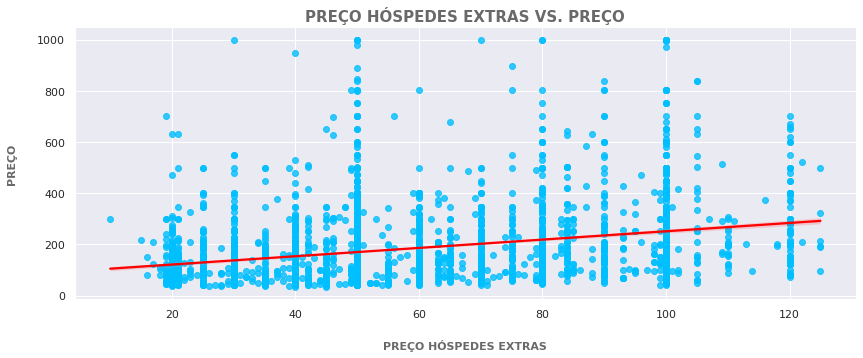

In [331]:
# Gráfico preço hóspedes extras vs. preço sem valores a zero reais

plt.figure(figsize=(14,5))
sns.regplot(x="preco_hospedes_extras", y="preco", data=df_phe, scatter_kws = {'color': 'deepskyblue'}, line_kws = {'color': 'red'})
sns.despine()
plt.title('PREÇO HÓSPEDES EXTRAS VS. PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO HÓSPEDES EXTRAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('PREÇO', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [332]:
# Tabela analítica receita por preço de hóspedes extras
rphe = df_phe.groupby(by=['preco_hospedes_extras']).sum()['preco'].reset_index() # receita por preço de hóspedes extras(rphe)
rphe.head()

,preco_hospedes_extras,preco
0,10.0,298.0
1,15.0,218.0
2,16.0,231.0
3,17.0,332.0
4,18.0,298.0


In [333]:
# Tabela analítica receita por preço de hóspedes extras em ordem decrescente
rphed = rphe.sort_values('preco', ascending=False) # receita por preço de hóspedes extras em ordem decrescente(rphed)
rphed.head()

,preco_hospedes_extras,preco
81,100.0,162783.0
36,50.0,161362.0
65,80.0,55793.0
16,30.0,37589.0
46,60.0,34043.0


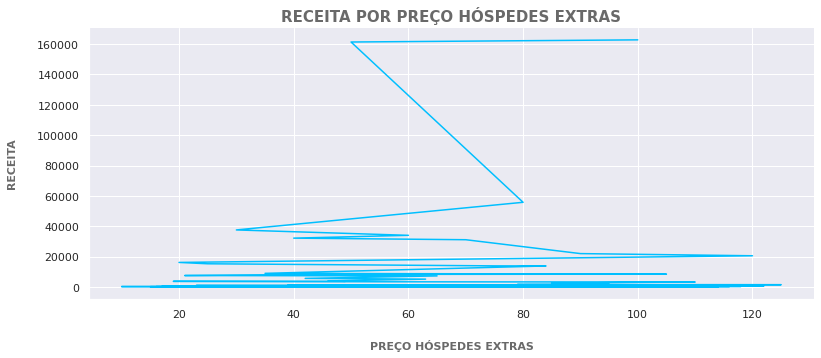

In [334]:
# Gráfico receita total por preço de hóspedes extras
plt.figure(figsize=(13,5))
plt.plot(rphed['preco_hospedes_extras'], rphed['preco'], color='deepskyblue')
sns.despine()
plt.title('RECEITA POR PREÇO HÓSPEDES EXTRAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.xlabel('PREÇO HÓSPEDES EXTRAS', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.ylabel('RECEITA', color = 'dimgrey', labelpad = 20, fontweight = 'bold', fontsize = 11)
plt.show();

In [335]:
# Descrição estatística preço de hóspedes extras
df_phe['preco_hospedes_extras'].describe().T

count    3847.000000
mean       62.175981
std        26.735623
min        10.000000
25%        42.000000
50%        50.000000
75%        84.000000
max       125.000000
Name: preco_hospedes_extras, dtype: float64

**ALGUMAS CONCLUSÕES:**

- A grande maioria das acomodações está com o preço de hóspedes extras a zero reais, talvez isto possa indicar que a maior parte das acomodações não oferecem este serviço

- Das acomodações que possivelmente oferecem este serviço, a média de preço é 62 reais, com preços de 50 e 100 reais sendo os mais frequentes e com maior ganho financeiro

# 10- Quais fatores mais influenciam no preço?

## Correlação entre as colunas quantitativas <h2>

In [336]:
# Correlação preço e colunas quantitativas
df_t.corr()['preco'].round(2)

id                      -0.20
host_id                 -0.13
host_anuncios           -0.12
avaliacoes              -0.19
latitude                -0.22
longitude               -0.05
capacidade_hospedes      0.41
banheiros                0.31
quartos                  0.38
camas                    0.29
minimo_pernoite          0.19
convidados_inclusos     -0.11
preco_hospedes_extras   -0.22
preco                    1.00
Name: preco, dtype: float64

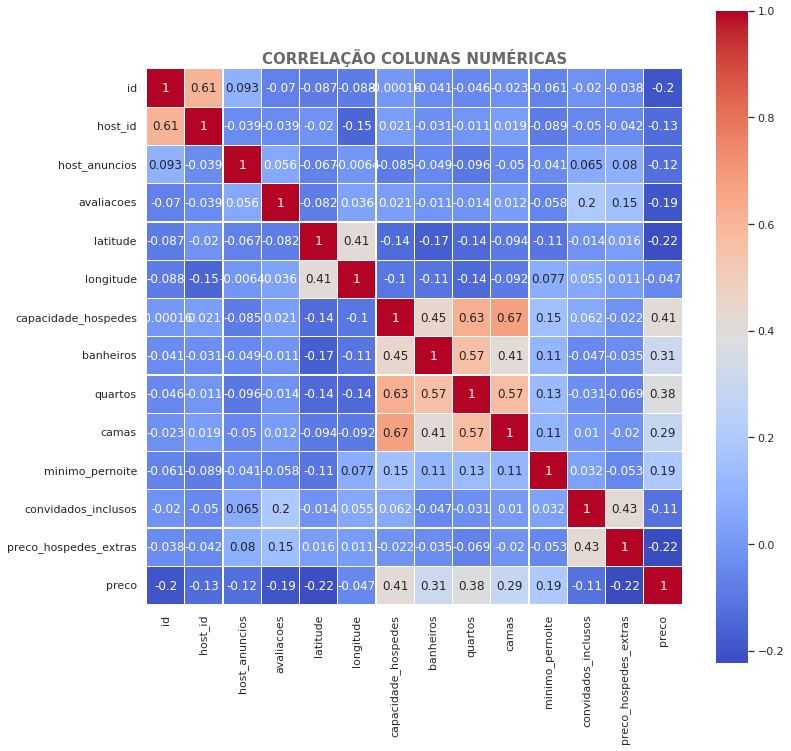

In [337]:
# Correlação entre as colunas quantitativas
plt.figure(figsize=(12,12)) 
sns.heatmap(data=df_t.corr(),annot=True,linewidths=0.2,cmap='coolwarm', square=True);
plt.title('CORRELAÇÃO COLUNAS NUMÉRICAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show();

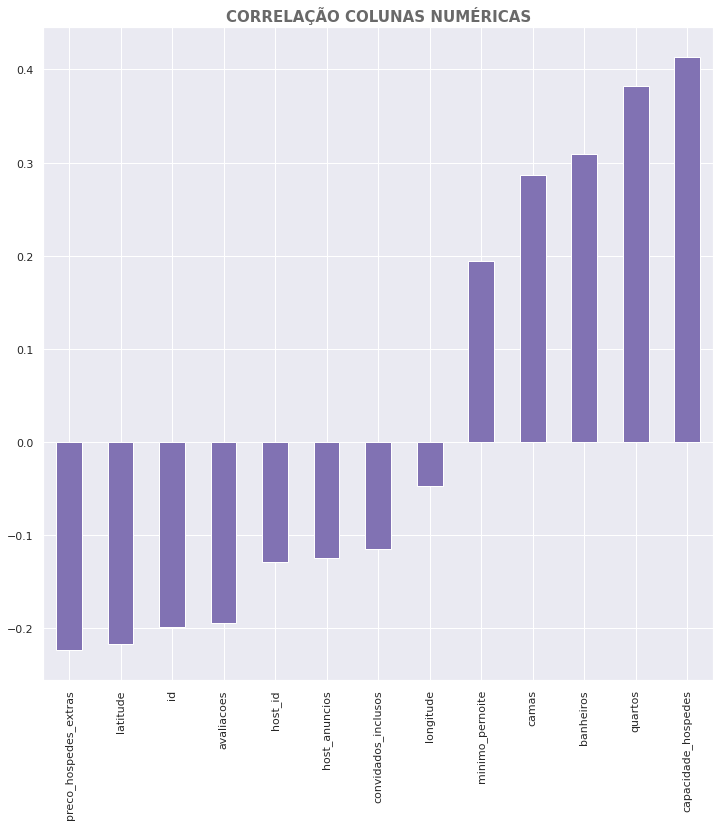

In [338]:
# Correlação entre as colunas quantitativas
plt.figure(figsize=(12,12))
df_t.corr()['preco'].sort_values()[:-1].plot(kind='bar', color='m')
plt.title('CORRELAÇÃO COLUNAS NUMÉRICAS', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show();

**ALGUMAS CONCLUSÕES:**

- Capacidade de hóspedes, quartos, banheiros, camas e mínimo de pernoites identificaram-se como tendo as maiores correlações com preço

## Mapas <h2>

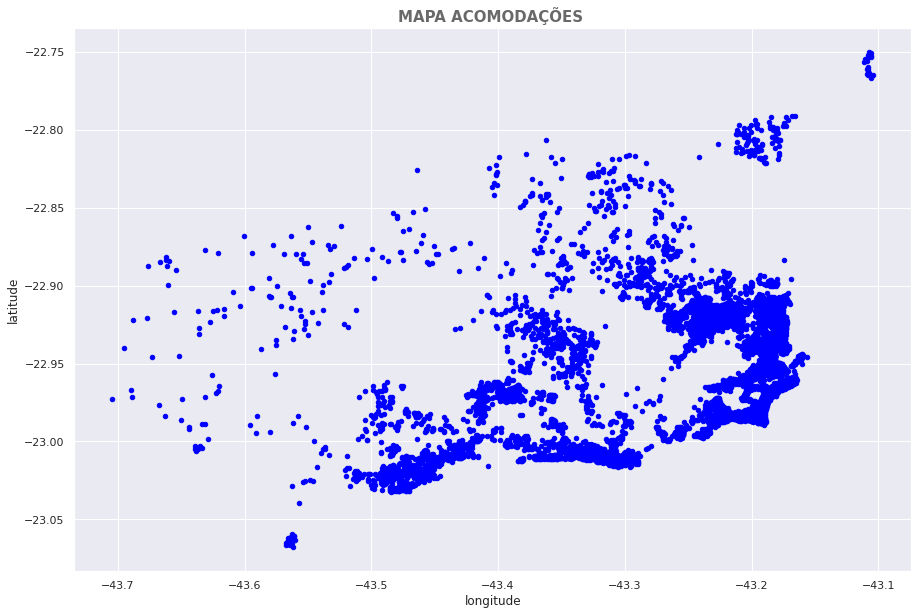

In [339]:
# Distribuição das acomodações em termos de latitude e longitude
fig = plt.figure(figsize = (15,10))
ax = fig.gca()
df_t.plot.scatter('longitude', 'latitude', ax=ax, color='Blue')
plt.title('MAPA ACOMODAÇÕES ', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show();

In [340]:
# Coordenadas
latitude = df_t['latitude']
longitude = df_t['longitude']

In [341]:
# Plotagem do mapa
mapa = folium.Map(location=[-22.92280, -43.36171], zoom_start=11)
for lat, lon in zip(latitude, longitude):
    folium.CircleMarker(location=[float(lat), float(lon)], radius=2).add_to(mapa)

In [342]:
# Visualização do mapa
mapa

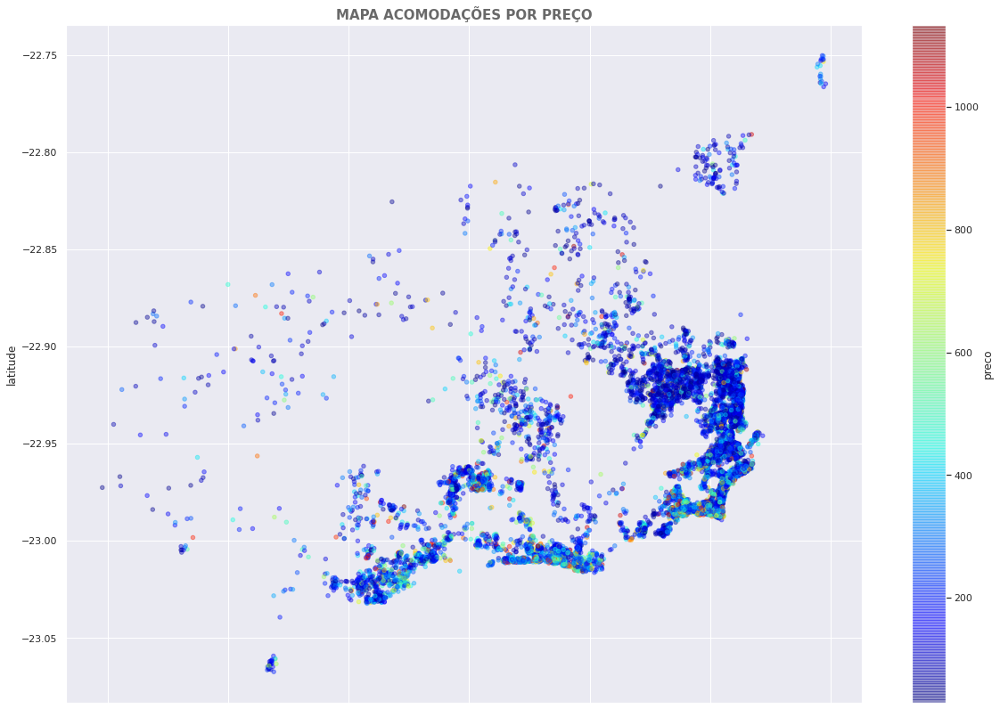

In [343]:
# Mapa em termos do preço
mapa2=df_t.plot(kind='scatter', x='longitude', y='latitude',  c='preco',
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(20,14))
plt.title('MAPA ACOMODAÇÕES POR PREÇO', fontsize = 15, color ='dimgrey', fontweight = 'bold')
plt.show()
mapa2;

In [344]:
# Densidade das acomodações em termos do preço
px.density_mapbox(
    df_t,
    lat='latitude',
    lon='longitude',
    z='preco',
    radius=30,
    center=dict(lat=-22.96474, lon=-43.34574),
    zoom=10,
    mapbox_style='carto-positron',
    opacity = 0.4,
    range_color = [0,1134],
    color_continuous_scale='deep',
)

**ALGUMAS CONCLUSÕES:**

- Ao que os mapas indicam, as acomodações mais caras estão localizadas próximas ao mar

# Conclusões Finais

- O Dataset apresentou-se com grande número de colunas com valores nulos

- Acomodações em que o anúncio estava relacionado a eventos esportivos do passado como a Copa do mundo 2014 e as Olimpíadas Rio 2016 apresentavam valores demasiadamente altos

- Excessiva quantidade de outliers, afetando diretamente na distribuição das colunas quantitativas

- Era de se esperar que Superhosts, Host verificados e Hosts com maior quantidade de anúncios usufruíssem de vantagens lucrativas sobre os demais que não dispusessem destas características. Porém, mostrou-se que a grande maioria dos Hosts não detêm estes atributos e devido a esta substancial parcela são os que portam maior lucro. Talvez isto possa indicar um certo desprovimento de profissionalismo por parte dos anfitriões, ou ainda, que hóspedes não levam em conta estas características na hora de escolher a acomodação para hospedagem

- Existe um grande número de acomodações sem avaliações, e isto apresentou-se não ser algo relevante para os hóspedes

- A diferença no preço médio entre acomodações que possuem reserva instantânea de acomodações que não possuem reserva instantânea não é muito significativa. No entanto, mais da metade das acomodações não possuem reserva instantânea e são as que possuem maior receita total. Isto posto, reserva instantânea aparenta não ser algo primordial para anfitriões e hóspedes

- O preço médio tende a aumentar à medida em que o número de banheiros, quartos, camas, capacidade de hóspedes, convidados inclusos e número de pernoites também aumentam

- A proporção de acomodações que não possuem o serviço de hóspedes extras é consideravelmente grande

# Insights

Os quesitos a seguir foram os que apresentaram-se como sendo os mais rentáveis. Com base nisso, talvez uma boa estratégia presumivelmente seria investir em: 

- Acomodações do tipo apartamento

- Acomodações no Bairro Barra da Tijuca

- Acomodações com faixa de preço em caro(301 a 500 reais)

- Acomodações com apenas um banheiro, um quarto e uma cama. Com o tipo de quarto sendo espaço inteiro e o tipo de cama real

- Acomodações com capacidade de 2 e 4 hóspedes

- Acomodações com apenas um convidado incluso

- Acomodações com número baixo de pernoites para reserva

- Acomodações com o preço de hóspedes extras a 50 e 100 reais

- Acomodações próximas ao mar

# Referências

- Matplotlib: https://matplotlib.org/stable/index.html
- Seaborn: https://seaborn.pydata.org/
- Pandas: https://pandas.pydata.org/docs/user_guide/index.html#user-guide
- Statistics: https://docs.python.org/3/library/statistics.html
- Folium: https://python-visualization.github.io/folium/
- Plotly https://plotly.com/python/
- Demais gráficos: https://www.python-graph-gallery.com/
- Tabela de cores código hexadecimal: https://loading.io/color/feature/
- Conhecimento do negócio: https://www.airbnb.com.br/help/all-topics?audience=guest e https://pt.wikipedia.org/wiki/Airbnb#cite_note-1
- Aquisição dos dados: https://www.kaggle.com/datasets/leonardopena/rio-de-janeiro-brazil-airbnb-data
- Metadados: http://insideairbnb.com/
- Intervalo interquartil: https://estatsite.com.br/2018/12/01/localizando-outliers-atraves-do-intervalo-interquartil-boxplot-codigo-sas/ e https://edtisensei.zendesk.com/hc/pt-br/articles/360028876412-Gr%C3%A1fico-de-Box-Plot-no-Minitab
- Quantidade de banheiros: https://community.withairbnb.com/t5/Hosting/How-to-calculate-Bathrooms/td-p/1437848